# 📘 Прогнозирования стоимости финансовых активов

Данная работа является частью магистерской работы по прогнозированию финансовых активов и посвящена анализу и прогнозированию временных рядов различных финансовых инструментов: криптовалют, акций различных российских компаний, фьючерсов и драгоценных металлов. Цель — провести EDA, оценить в каких сферах лучше всего модели предсказания справляются с задачей, построить различные варианты моделей (машинного обучения и классических статистических моделей), способные предсказывать будущие значения цен на основе исторических данных.

## 🧩 Структура работы
1. Загрузка и предобработка данных
2. Исследовательский анализ (EDA)
3. Прогнозирование с помощью классических моделей (ARIMA, Prophet)
4. Прогнозирование с помощью ML-моделей (RandomForest, LightGBM, LSTM)
5. Добавлние новых фичей в датасеты для эксперемента со всеми моделями.
6. Сравнение результатов и выводы


## 🔹 Описание данных
Основное исслендование будет проводиться на 12 датасетах с временными рядами в различных областях финансовой среды, а именно:
1. Будут рассмотрена динамика цена на биткоин и эфириум с 2016-2024 год.
2. Динамика цен на фьчерсы нефти марки Brent и WTI с получением товара через 5 месяцев. Даннные за 2016-2024 год.
3. Стоимость акций метталургрический компаний РФ (в основном занимающихся редкоземельными металлами). Даннные за 2016-2024 год.
4. Стоимость акций компаний торгующих газом РФ. Даннные за 2016-2024 год.
5. Спотовая стоимость драгоценных металлов (Платина, золото, серебро). Даннные за 2016-2024 год.

# 1. Загрузка данных

In [2]:
# импорт библиотек
import os
import glob
import pandas as pd
import numpy as np
from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import autocorrelation_plot
from IPython.display import display, Markdown


from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima.model import ARIMA
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from sklearn.preprocessing import MinMaxScaler


import lightgbm as lgb
from prophet import Prophet
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor


2025-03-30 12:14:42.930311: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-30 12:14:43.093594: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-30 12:14:43.228776: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743336883.344934    2081 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743336883.378040    2081 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1743336883.653287    2081 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

In [3]:
# фиксация сида на будущее
RANDOM_STATE = 654321

In [4]:
# просмотр неймнига данных
csv_files = glob.glob("data/*/*.csv")  # Ищет все CSV-файлы во вложенных папках
print(csv_files)

['data/share_oil_gaz_company/GAZP_company_2016_2024.csv', 'data/share_oil_gaz_company/NVTK_company_2016_2024.csv', 'data/cryptocurrency/BTC_USD Bitfinex_2016_2024.csv', 'data/cryptocurrency/Ethereum_2016_2024.csv', 'data/share_matal_company/GMKN_company_2016_2024.csv', 'data/share_matal_company/ALRS_company_2016_2024.csv', 'data/share_matal_company/RUAL_company_2016_2024.csv', 'data/futures_market_oil/WTI - Апр 25 (CLJ5) 2016_2024.csv', 'data/futures_market_oil/Brent - Май 25 (LCOK5) 2016_2024.csv', 'data/spot_market_precious_metal/XAU_USD_2016_2024.csv', 'data/spot_market_precious_metal/XAG_USD_2016_2024.csv', 'data/spot_market_precious_metal/XPT_USD_2016_2024.csv']


In [5]:
# Создание переменных с датасетами
crypt_Ethereum = pd.read_csv('data/cryptocurrency/Ethereum_2016_2024.csv')
crypt_BTC = pd.read_csv('data/cryptocurrency/BTC_USD Bitfinex_2016_2024.csv')
futures_Brent_LCOK5 = pd.read_csv('data/futures_market_oil/Brent - Май 25 (LCOK5) 2016_2024.csv')
futures_WTI_CLJ5 = pd.read_csv('data/futures_market_oil/WTI - Апр 25 (CLJ5) 2016_2024.csv')
share_metal_RUAL = pd.read_csv('data/share_matal_company/RUAL_company_2016_2024.csv')
share_metal_ALRS = pd.read_csv('data/share_matal_company/ALRS_company_2016_2024.csv')
share_metal_GMKN = pd.read_csv('data/share_matal_company/GMKN_company_2016_2024.csv')
share_oil_gaz_NVTK = pd.read_csv('data/share_oil_gaz_company/NVTK_company_2016_2024.csv')
share_oil_gaz_GAZP = pd.read_csv('data/share_oil_gaz_company/GAZP_company_2016_2024.csv')
spot_preciouse_metal_XPT = pd.read_csv('data/spot_market_precious_metal/XPT_USD_2016_2024.csv')
spot_preciouse_metal_AU = pd.read_csv('data/spot_market_precious_metal/XAU_USD_2016_2024.csv')
spot_preciouse_metal_AG = pd.read_csv('data/spot_market_precious_metal/XAG_USD_2016_2024.csv')


In [6]:
# компановка датасетов по словарям для будущего упрощения 
# исследования данных

# датасеты крипты
crypt = [crypt_Ethereum,
crypt_BTC]

# датасеты фючерсов на нефть
fetures = [futures_Brent_LCOK5,
futures_WTI_CLJ5]

# датасеты акций металург. компаний РФ.
share_metal = [share_metal_RUAL,
share_metal_ALRS,
share_metal_GMKN]

# датасеты газовых компаний РФ.
share_oil = [share_oil_gaz_NVTK ,
share_oil_gaz_GAZP]

# датасеты спотовых цен на драг. металлы 
spot_prec = [spot_preciouse_metal_XPT,
spot_preciouse_metal_AU,
spot_preciouse_metal_AG]


In [7]:
def first_scroll_data(data):
    '''Функция для просмотра базовой информации о
    датасете'''
    
    print('Общая информация:')
    print(data.info())
    print()
    print('Первые пять строк таблицы:')
    display(data.head())
    print()
    print('Последние пять строк таблицы:')
    display(data.tail())

In [8]:
def list_scroll(data: list):
    '''вторичная функция для прокрутки first_scroll_data 
    используя список'''
    for i in data:
        first_scroll_data(i)
        print()

### Проверка по группам

In [9]:
list_scroll(crypt)  

Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3293 entries, 0 to 3292
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    3293 non-null   object
 1   Цена    3293 non-null   object
 2   Откр.   3293 non-null   object
 3   Макс.   3293 non-null   object
 4   Мин.    3293 non-null   object
 5   Объём   3285 non-null   object
 6   Изм. %  3293 non-null   object
dtypes: object(7)
memory usage: 180.2+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"1.925,17","1.910,71","1.934,78","1.904,30","318,73K","0,71%"
1,14.03.2025,"1.911,62","1.863,57","1.945,25","1.861,63","405,34K","2,52%"
2,13.03.2025,"1.864,69","1.906,05","1.916,35","1.823,72","617,45K","-2,28%"
3,12.03.2025,"1.908,22","1.923,22","1.955,50","1.833,70","844,66K","-0,73%"
4,11.03.2025,"1.922,28","1.865,07","1.961,10","1.766,97","1,26M","3,10%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
3288,14.03.2016,"12,50","15,07","15,07","11,40","92,18K","-17,05%"
3289,13.03.2016,"15,07","12,92","15,07","12,92","1,30K","16,64%"
3290,12.03.2016,"12,92","11,95","13,45","11,95","0,83K","8,12%"
3291,11.03.2016,"11,95","11,75","11,95","11,75","0,18K","1,70%"
3292,10.03.2016,"11,75","11,20","11,85","11,07","0,00K","4,91%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3361 entries, 0 to 3360
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    3361 non-null   object
 1   Цена    3361 non-null   object
 2   Откр.   3361 non-null   object
 3   Макс.   3361 non-null   object
 4   Мин.    3361 non-null   object
 5   Объём   3354 non-null   object
 6   Изм. %  3361 non-null   object
dtypes: object(7)
memory usage: 183.9+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"84.497,0","84.207,0","84.911,0","83.832,0","0,75K","0,34%"
1,14.03.2025,"84.207,0","81.289,0","85.473,0","81.024,0","1,16K","3,59%"
2,13.03.2025,"81.289,0","83.856,0","84.490,0","80.101,0","0,44K","-3,06%"
3,12.03.2025,"83.856,0","83.163,0","84.600,0","80.881,0","1,11K","0,86%"
4,11.03.2025,"83.142,0","78.807,0","83.808,0","77.041,0","1,82K","5,60%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
3356,05.01.2016,"431,8","432,9","434,9","428,2","11,22K","-0,24%"
3357,04.01.2016,"432,9","428,6","435,7","427,0","13,02K","0,99%"
3358,03.01.2016,"428,7","432,7","433,1","422,0","19,18K","-0,93%"
3359,02.01.2016,"432,7","434,0","435,8","430,0","6,38K","-0,29%"
3360,01.01.2016,"434,0","429,0","436,5","426,3","12,97K","1,16%"


Датасеты криптовалюты загружены полностью корректно. Необходимо поправить типы данных.

In [10]:
list_scroll(fetures)

Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2376 entries, 0 to 2375
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2376 non-null   object
 1   Цена    2376 non-null   object
 2   Откр.   2376 non-null   object
 3   Макс.   2376 non-null   object
 4   Мин.    2376 non-null   object
 5   Объём   2375 non-null   object
 6   Изм. %  2376 non-null   object
dtypes: object(7)
memory usage: 130.1+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,14.03.2025,"70,58","70,16","70,75","69,93","238,55K","1,00%"
1,13.03.2025,"69,88","70,95","71,25","69,66","331,69K","-1,51%"
2,12.03.2025,"70,95","69,95","71,10","69,48","273,31K","2,00%"
3,11.03.2025,"69,56","69,05","70,44","68,63","282,86K","0,40%"
4,10.03.2025,"69,28","70,49","70,88","69,05","275,18K","-1,53%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2371,08.01.2016,"33,55","34,02","34,72","32,78","206,97K","-0,59%"
2372,07.01.2016,"33,75","34,52","34,74","32,16","291,51K","-1,40%"
2373,06.01.2016,"34,23","36,64","36,67","34,13","296,86K","-6,01%"
2374,05.01.2016,"36,42","37,27","37,57","36,24","275,47K","-2,15%"
2375,04.01.2016,"37,22","37,85","38,99","36,77","321,84K","-0,16%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2421 entries, 0 to 2420
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2421 non-null   object
 1   Цена    2421 non-null   object
 2   Откр.   2421 non-null   object
 3   Макс.   2421 non-null   object
 4   Мин.    2421 non-null   object
 5   Объём   2314 non-null   object
 6   Изм. %  2421 non-null   object
dtypes: object(7)
memory usage: 132.5+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,14.03.2025,"67,18","66,78","67,48","66,59",NaN,"0,95%"
1,13.03.2025,"66,55","67,69","67,94","66,37","268,59K","-1,67%"
2,12.03.2025,"67,68","66,62","67,88","66,15","246,68K","2,16%"
3,11.03.2025,"66,25","65,95","67,17","65,29","222,51K","0,33%"
4,10.03.2025,"66,03","67,11","67,60","65,80","249,63K","-1,51%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2416,08.01.2016,"33,16","33,30","34,34","32,64","596,50K","-0,33%"
2417,07.01.2016,"33,27","34,09","34,26","32,10","617,41K","-2,06%"
2418,06.01.2016,"33,97","36,18","36,39","33,77","563,81K","-5,56%"
2419,05.01.2016,"35,97","36,90","37,10","35,74","410,13K","-2,15%"
2420,04.01.2016,"36,76","37,60","38,39","36,33","431,99K","-0,76%"


Датасеты фьчерсов на нефть загружены полностью. Есть пустые строчки и необходимо поправить типы данных.

In [11]:
list_scroll(share_metal)

Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2300 entries, 0 to 2299
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2300 non-null   object
 1   Цена    2300 non-null   object
 2   Откр.   2300 non-null   object
 3   Макс.   2300 non-null   object
 4   Мин.    2300 non-null   object
 5   Объём   2298 non-null   object
 6   Изм. %  2300 non-null   object
dtypes: object(7)
memory usage: 125.9+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"42,535","42,480","42,640","42,420","1,02M","0,25%"
1,14.03.2025,"42,430","42,000","42,575","41,600","31,22M","1,01%"
2,13.03.2025,"42,005","41,900","42,750","40,515","47,15M","0,24%"
3,12.03.2025,"41,905","42,595","42,900","41,500","23,47M","-1,79%"
4,11.03.2025,"42,670","43,075","43,490","42,345","40,72M","-0,87%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2295,12.01.2016,"22,400","22,100","22,790","21,900","535,90K","0,45%"
2296,11.01.2016,"22,300","22,400","22,700","22,230","485,40K","-3,00%"
2297,06.01.2016,"22,990","23,700","23,700","22,630","91,80K","-0,48%"
2298,05.01.2016,"23,100","22,490","23,870","22,490","367,20K","2,71%"
2299,04.01.2016,"22,490","22,000","22,500","21,900","350,10K","-0,04%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2306 entries, 0 to 2305
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2306 non-null   object
 1   Цена    2306 non-null   object
 2   Откр.   2306 non-null   object
 3   Макс.   2306 non-null   object
 4   Мин.    2306 non-null   object
 5   Объём   2303 non-null   object
 6   Изм. %  2306 non-null   object
dtypes: object(7)
memory usage: 126.2+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"60,28","60,18","60,50","60,17","498,03K","0,17%"
1,14.03.2025,"60,18","59,35","60,35","59,11","13,21M","0,72%"
2,13.03.2025,"59,75","59,80","60,61","58,32","26,49M","-0,07%"
3,12.03.2025,"59,79","59,52","60,35","58,80","21,57M","0,47%"
4,11.03.2025,"59,51","61,23","61,65","59,20","36,87M","-2,92%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2301,12.01.2016,"58,34","56,06","58,40","55,50","6,50M","3,97%"
2302,11.01.2016,"56,11","56,90","57,28","55,63","6,84M","-2,74%"
2303,06.01.2016,"57,69","57,50","58,90","56,86","5,42M","-0,19%"
2304,05.01.2016,"57,80","55,01","57,80","54,66","5,01M","4,69%"
2305,04.01.2016,"55,21","56,00","56,78","55,20","1,55M","-1,30%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2300 entries, 0 to 2299
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2300 non-null   object
 1   Цена    2300 non-null   object
 2   Откр.   2300 non-null   object
 3   Макс.   2300 non-null   object
 4   Мин.    2300 non-null   object
 5   Объём   2298 non-null   object
 6   Изм. %  2300 non-null   object
dtypes: object(7)
memory usage: 125.9+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"131,2","130,9","131,7","130,9","690,76K","0,54%"
1,14.03.2025,"130,5","132,0","132,5","129,0","28,18M","-1,06%"
2,13.03.2025,"131,9","133,8","135,5","128,2","51,65M","-1,57%"
3,12.03.2025,"134,0","135,8","136,4","133,8","14,99M","-1,27%"
4,11.03.2025,"135,7","137,4","138,9","135,1","24,23M","-1,04%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2295,12.01.2016,"85,5","85,5","87,2","85,0","22,97M","-0,58%"
2296,11.01.2016,"86,0","88,0","88,0","85,1","35,15M","-4,34%"
2297,06.01.2016,"89,9","91,0","91,5","89,9","13,92M","-0,99%"
2298,05.01.2016,"90,8","89,4","91,2","88,9","13,79M","1,79%"
2299,04.01.2016,"89,2","90,9","91,4","88,9","11,77M","-2,51%"


Датасеты металлургических компаний  загружены полностью. Есть пустые строчки и необходимо поправить типы данных.

In [12]:
list_scroll(share_oil)

Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2304 entries, 0 to 2303
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2304 non-null   object
 1   Цена    2304 non-null   object
 2   Откр.   2304 non-null   object
 3   Макс.   2304 non-null   object
 4   Мин.    2304 non-null   object
 5   Объём   2302 non-null   object
 6   Изм. %  2304 non-null   object
dtypes: object(7)
memory usage: 126.1+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"1.282,60","1.276,20","1.287,80","1.276,20","143,36K","0,50%"
1,14.03.2025,"1.276,20","1.254,00","1.281,20","1.240,00","3,22M","0,98%"
2,13.03.2025,"1.263,80","1.255,00","1.295,00","1.202,40","5,31M","0,70%"
3,12.03.2025,"1.255,00","1.267,00","1.274,00","1.237,00","2,40M","-0,85%"
4,11.03.2025,"1.265,80","1.287,40","1.289,20","1.252,60","2,19M","-1,49%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2299,12.01.2016,"567,00","548,90","568,90","537,00","1,25M","3,00%"
2300,11.01.2016,"550,50","562,00","562,90","545,70","1,15M","-3,08%"
2301,06.01.2016,"568,00","572,10","575,30","565,00","604,38K","-0,98%"
2302,05.01.2016,"573,60","572,40","575,70","566,80","1,03M","0,46%"
2303,04.01.2016,"571,00","594,10","594,10","570,30","861,79K","-3,38%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2321 entries, 0 to 2320
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2321 non-null   object
 1   Цена    2321 non-null   object
 2   Откр.   2321 non-null   object
 3   Макс.   2321 non-null   object
 4   Мин.    2321 non-null   object
 5   Объём   2306 non-null   object
 6   Изм. %  2321 non-null   object
dtypes: object(7)
memory usage: 127.1+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,15.03.2025,"170,45","170,45","170,99","170,35","2,23M","0,00%"
1,14.03.2025,"170,45","167,22","171,47","164,38","110,59M","1,39%"
2,13.03.2025,"168,11","168,30","171,70","160,71","214,68M","-0,11%"
3,12.03.2025,"168,29","170,42","171,14","167,70","46,49M","-1,25%"
4,11.03.2025,"170,42","171,09","172,50","169,15","61,14M","-0,39%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2316,12.01.2016,"133,54","130,40","135,25","130,10","39,70M","1,64%"
2317,11.01.2016,"131,38","133,00","133,65","131,10","34,01M","-3,35%"
2318,06.01.2016,"135,94","136,31","136,93","135,30","10,39M","-0,37%"
2319,05.01.2016,"136,45","134,66","137,28","134,61","14,29M","1,14%"
2320,04.01.2016,"134,91","135,89","136,65","134,42","12,41M","-0,87%"


Датасеты добывающих компаний загружены, есть пустые строчки и необходимо поправить типы данных.

In [13]:
list_scroll(spot_prec)

Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2388 entries, 0 to 2387
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Дата    2388 non-null   object 
 1   Цена    2388 non-null   object 
 2   Откр.   2388 non-null   object 
 3   Макс.   2388 non-null   object 
 4   Мин.    2388 non-null   object 
 5   Объём   0 non-null      float64
 6   Изм. %  2388 non-null   object 
dtypes: float64(1), object(6)
memory usage: 130.7+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,14.03.2025,"993,19","999,80","1.004,50","985,28",NaN,"-0,10%"
1,13.03.2025,"994,22","988,15","1.001,88","970,33",NaN,"1,02%"
2,12.03.2025,"984,17","983,60","995,25","978,58",NaN,"0,94%"
3,11.03.2025,"975,00","960,40","988,90","952,85",NaN,"1,81%"
4,10.03.2025,"957,63","963,50","978,95","957,40",NaN,"-0,55%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2383,07.01.2016,"873,80","876,00","886,80","859,82",NaN,"-0,21%"
2384,06.01.2016,"875,65","888,92","894,40","871,02",NaN,"-1,44%"
2385,05.01.2016,"888,40","884,25","900,55","878,13",NaN,"0,58%"
2386,04.01.2016,"883,30","889,00","895,76","871,25",NaN,"-0,70%"
2387,01.01.2016,"889,50","891,65","893,13","889,50",NaN,"-0,12%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2394 entries, 0 to 2393
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Дата    2394 non-null   object
 1   Цена    2394 non-null   object
 2   Откр.   2394 non-null   object
 3   Макс.   2394 non-null   object
 4   Мин.    2394 non-null   object
 5   Объём   12 non-null     object
 6   Изм. %  2394 non-null   object
dtypes: object(7)
memory usage: 131.1+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,14.03.2025,"2.984,42","2.988,38","3.005,08","2.978,41",NaN,"-0,11%"
1,13.03.2025,"2.987,75","2.932,66","2.989,64","2.932,03",NaN,"1,90%"
2,12.03.2025,"2.932,06","2.916,85","2.940,83","2.906,19",NaN,"0,55%"
3,11.03.2025,"2.916,04","2.888,72","2.922,22","2.880,34",NaN,"0,92%"
4,10.03.2025,"2.889,40","2.912,17","2.918,50","2.880,30",NaN,"-0,73%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2389,07.01.2016,"1.109,25","1.094,45","1.110,20","1.091,09",NaN,"1,35%"
2390,06.01.2016,"1.094,45","1.077,55","1.095,45","1.074,70",NaN,"1,56%"
2391,05.01.2016,"1.077,66","1.074,66","1.082,30","1.072,70",NaN,"0,28%"
2392,04.01.2016,"1.074,70","1.065,36","1.083,70","1.061,90",NaN,"1,32%"
2393,01.01.2016,"1.060,74","1.061,21","1.061,41","1.060,74",NaN,"-0,05%"



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2395 entries, 0 to 2394
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Дата    2395 non-null   object 
 1   Цена    2395 non-null   object 
 2   Откр.   2395 non-null   object 
 3   Макс.   2395 non-null   object 
 4   Мин.    2395 non-null   object 
 5   Объём   0 non-null      float64
 6   Изм. %  2395 non-null   object 
dtypes: float64(1), object(6)
memory usage: 131.1+ KB
None

Первые пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
0,14.03.2025,"33,7800","33,8130","34,1050","33,5174",NaN,"-0,06%"
1,13.03.2025,"33,8000","33,2530","33,9718","32,9341",NaN,"1,72%"
2,12.03.2025,"33,2300","32,9900","33,3386","32,6984",NaN,"0,91%"
3,11.03.2025,"32,9300","32,1197","33,0150","31,8050",NaN,"2,55%"
4,10.03.2025,"32,1100","32,5350","32,6804","31,9244",NaN,"-1,28%"



Последние пять строк таблицы:


,Дата,Цена,Откр.,Макс.,Мин.,Объём,Изм. %
2390,07.01.2016,"14,3100","14,0000","14,3900","13,9000",NaN,"2,14%"
2391,06.01.2016,"14,0100","13,9500","14,1500","13,8800",NaN,"0,21%"
2392,05.01.2016,"13,9800","13,8500","14,0900","13,7900",NaN,"0,72%"
2393,04.01.2016,"13,8800","13,8200","14,2200","13,7900",NaN,"0,51%"
2394,01.01.2016,"13,8100","13,8500","13,8700","13,7900",NaN,"-0,29%"


Датасеты драг. металлов загружены, необходимо подправить данные. 

**Выводы:** Данные представлены практически в полном объёме, за исключением пары пустых строк и колонок в разных датасетах

# 2. Исследовательский анализ (EDA)

## Предобработика данных

In [14]:
def transform_data(data):
    '''Фнукция для трансформации текстовых строчек в числовые'''

    # перевод даты в индексы датасета
    data["Дата"] = pd.to_datetime(data["Дата"], format="%d.%m.%Y")
    data = data.sort_values("Дата").set_index("Дата")

    # меняем тип данных и удаляем заранее известные не информативные колонки
    for col in ["Цена", "Откр.", "Макс.", "Мин."]:
        data[col] = data[col].str.replace(".", "", regex=False).str.replace(",", ".").astype(float)
    data = data.drop(columns=["Объём", "Изм. %"], errors='ignore')

    #доп проверка на пустые строчки
    try:
        data.isnull().sum().sum() == 0
    except:
        print("В данных есть пустые значения!")

    data = data.drop_duplicates()
    
    return data

In [15]:
# трансформация датасетов
crypt_Ethereum = transform_data(crypt_Ethereum)
crypt_BTC = transform_data(crypt_BTC)
futures_WTI_CLJ5 = transform_data(futures_WTI_CLJ5)
futures_Brent_LCOK5 = transform_data(futures_Brent_LCOK5)
share_metal_RUAL  = transform_data(share_metal_RUAL)
share_metal_ALRS  = transform_data(share_metal_ALRS)
share_metal_GMKN  = transform_data(share_metal_GMKN)
share_oil_gaz_NVTK  = transform_data(share_oil_gaz_NVTK)
share_oil_gaz_GAZP  = transform_data(share_oil_gaz_GAZP)
spot_preciouse_metal_XPT = transform_data(spot_preciouse_metal_XPT)
spot_preciouse_metal_AU  = transform_data(spot_preciouse_metal_AU)
spot_preciouse_metal_AG = transform_data(spot_preciouse_metal_AG)

In [16]:
# Словарь со всеми датасетами
all_data = {
    'crypt_Ethereum': crypt_Ethereum,
    'crypt_BTC': crypt_BTC,       
    'futures_WTI_CLJ5': futures_WTI_CLJ5,
    'futures_Brent_LCOK5': futures_Brent_LCOK5,           
    'share_metal_RUAL': share_metal_RUAL,
    'share_metal_ALRS': share_metal_ALRS,
    'share_metal_GMKN': share_metal_GMKN,
    'share_oil_gaz_NVTK': share_oil_gaz_NVTK,
    'share_oil_gaz_GAZ': share_oil_gaz_GAZP,
    'spot_preciouse_metal_XPT': spot_preciouse_metal_XPT,
    'spot_preciouse_metal_AU': spot_preciouse_metal_AU,
    'spot_preciouse_metal_AG': spot_preciouse_metal_AG
}

## Исследование данных


## 📖 Теоретическая основа

При исследовании датасетов будут использованы следующие инструменты/способы изучения:

- **Корреляция**

Используется коэффициент Пирсона (по умолчанию в бибилотеке sns.heatmap):

$$
\rho_k = \frac{ \sum_{t = k+1}^{T} (x_t - \bar{x})(x_{t-k} - \bar{x}) }{ \sum_{t=1}^{T} (x_t - \bar{x})^2 }
$$

где x и y — два признака а $\bar{x}$ и $\bar{y}$ — их средние значения.

🧠 Что показывает:

$r≈1$ — сильная положительная связь

$r≈−1$ — сильная отрицательная связь

$r≈0$ — связи нет


🎯 Что ожидается понять в результате исследования:
Есть ли избыточные признаки, или не информативные для поиска взаимосвязей целевого признака и остальных данных в датасете


- **Автокорреляция**

Будет использоваться готовое решение из pandas - autocorrelation_plot
Автокорреляция показывает, насколько текущие значения ряда зависят от прошлых (то есть от самих себя с лагом).
Похоже на корреляцию, но сравнивается ряд с его копией, сдвинутой на lag:

$$
\rho_k = \frac{ \sum_{t=k+1}^{T} (x_t - \bar{x})(x_{t-k} - \bar{x}) }{ \sum_{t=1}^{T} (x_t - \bar{x})^2 }
$$

🧠 Что показывает:

Выявляет циклы, сезонность. 

🎯 Что ожидается понять в результате исследования:
Обнаружение сезонности или цикличности цены сквозь года.


- **Волатильность**

Будет использоваться шаг в 10 дней ```data["Цена"].rolling(window=10).std()```
В контексте финансов — высокая волатильность означает, что актив ведёт себя нестабильно: цена часто и резко меняется.

🧮 Как считается:

В каждой точке времени измеряется, насколько сильно колебалась цена за последние 10 дней.

🧠 Что показывает:

- Моменты высокой турбулентности на рынке (всплески волатильности)
- Участки, где цена была стабильной
- Риск актива: чем выше волатильность — тем выше потенциальная неопределённость

🎯 Что ожидается понять в результате исследования:
Визуализирубщий график динамики волатильной цены на тот или иной финансовый актив

- **Декомпозиция**

📌 Будет использоваться seasonal_decompose включающий в себя разделение временного ряда на 3 компонента:

- Тренд — общее направление (рост/падение)
- Сезонность — циклические колебания
- Остаток (шум) — всё, что не попало в предыдущие


🧠 Что показывает:

Помогает визуально отделить шум от структуры временного ряда, определить сезонность, тренд роста цены.

🎯 Что ожидается понять в результате исследования:

Присутствует ли сезонность во временном ряде, выявить аномалии и шум

- **Аномалии (Z-score & IQR)**

Будут исплmзованы методы поиска выбросов, то есть точек, которые значительно отклоняются от общей картины.

🧮 Z-score  (stats.zscore):
$$
Z = \frac{x - \mu}{\sigma}
$$

Если \( |Z| > 3 \), значение считается выбросом.


🧮 IQR  (будет рассчёт через квантели df.quantile()):

Расчёт квартилей:

$$
IQR = Q_3 - Q_1
$$

Выбросы:

$$
x < Q_1 - 1.5 \cdot IQR \quad \text{или} \quad x > Q_3 + 1.5 \cdot IQR
$$


🧠 Что показывает:

Выявляет скачки цен, аномальные события, аномальные данные.


🎯 Что ожидается понять в результате исследования:

Присутствуют ли во временном ряде аномальные данные, выделяющиеся на фоне всего датасета


- **Скользящее среднее и EMA**

SMA (Simple Moving Average) — простое скользящее среднее

EMA (Exponential Moving Average) — экспоненциальное скользящее среднее 

🧮 Как считается:
SMA - среднее арифметическое N последних цен
EMA - рекурсивно, с использованием сглаживающего коэффициента.  $EMA_t = \alpha \cdot P_t + (1 - \alpha) \cdot EMA_{t-1}$


🧠 Что показывает:
Выявляет скачки цен, аномальные события, аномальные данные.
> - Видно направление тренда — растёт цена или падает.
> - Обнаруживаются развороты трендов через пересечения скользящих средних.
> - Можно применять в торговых стратегиях: например, покупка при пересечении короткой EMA выше длинной.
> - Сравнение SMA и EMA показывает, насколько быстро реагирует рынок на изменения.



- **Сезонность через ACF**

📌 Что такое:

Автокорреляционная функция (plot_acf), в отличии от остальнх исследований на сезонность, покажет  насколько важны лаги в ряду и есть ли сезонные паттерны.

🧮 Как работает:

Считается автокорреляция для каждого лага 𝑘, визуализируется с доверительными интервалами.

🧠 Что показывает:

Пики через каждые N лагов → сезонность с периодом N

🎯 Что ожидается понять в результате исследования:

Насколько сильно временные лаги в ряду могут определять цену


- **Линейный тренд (через LinearRegression)**

📌 Что такое:
Прямая, которая аппроксимирует общее направление движения ряда — вверх или вниз.

🧮 Как считается:
Обычная линейная регрессия:

$$ y=a+bt$$
где t — временной индекс

🧠 Что показывает:

Есть ли общий тренд роста/падения


- **ADF-тест (тест Дики-Фуллера)**

📌 Что такое:
Тест на стационарность ряда (однородность статистических свойств во времени).
Если ряд нестационарен — многие модели (например, ARIMA) работают хуже.

🧮 Как работает:
Проверяет гипотезу:

$H₀$: ряд нестационарный

$H₁$: ряд стационарный

По p-значению:

$p<0.05$ → ряд стационарный

$p≥0.05$ → ряд нестационарный

🧠 Что показывает:

Нужно ли дифференцировать ряд



In [17]:
def title_block(text, color="blue"):
    colors = {
        "blue": "#1f77b4",
        "green": "#2ca02c",
        "red": "#d62728",
        "purple": "#9467bd",
        "orange": "#ff7f0e",
        "gray": "#7f7f7f"
    }
    display(Markdown(f"<div style='background-color:{colors.get(color, 'lightgray')}; \
                      padding:10px; border-radius:6px; color:white; font-weight:bold; \
                      font-size:16px; margin-top:20px;'>{text}</div>"))

In [18]:
def plot_lines(data, lines, title="", xlabel="Дата", ylabel="Значение", legend=True):
    plt.figure(figsize=(8, 6))
    for label, series in lines.items():
        plt.plot(data.index, series, label=label)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if legend:
        plt.legend()
    plt.grid()
    plt.show()


In [19]:
def plot_correlation_heatmap(df, title="Корреляция"):
    plt.figure(figsize=(8, 6))
    sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(title)
    plt.show()

In [20]:
def crate_base_research_data(name, data_1):
    title_block(f"📊 Анализ датасета: {name}", color="blue")
    
    print("\033[95mСтатистика по данным:\033[0m")
    print(data_1.describe())

    
    # Копия
    data = data_1.copy()

    title_block("📈 Временной ряд цены", color="green")

    plot_lines(data_1, {"Цена": data["Цена"]},  title = "Цена за день", ylabel = "Цена (USD)")

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("🔁 Корреляция и автокорреляция", color="orange")
    
    plot_correlation_heatmap(data, "Корреляция признаков")

    plt.figure(figsize=(8, 6))
    autocorrelation_plot(data["Цена"])
    plt.title("Автокорриляция признаков")
    plt.show()

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("🧩 Декомпозиция временного ряда", color="purple")
    result = seasonal_decompose(data["Цена"], model="additive", period=30)
    result.plot()
    plt.show()

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------


    title_block("📉 Скользящее среднее и EMA", color="green")
    data["SMA_7"] = data["Цена"].rolling(window=7).mean()
    data["SMA_30"] = data["Цена"].rolling(window=30).mean()
    data["EMA_7"] = data["Цена"].ewm(span=7, adjust=False).mean()
    data["EMA_30"] = data["Цена"].ewm(span=30, adjust=False).mean()

    
    plot_lines(data_1, {"SMA_7": data["SMA_7"], "SMA_30": data["SMA_30"]},  title = "SMA", ylabel = "Цена (USD)")

    plot_lines(data_1, {"SEMA_7": data["EMA_7"], "EMA_30": data["EMA_30"]},  title = "EMA", ylabel = "Цена (USD)")
    

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("📊 Волатильность (Шумность ряда)", color="gray")
    data["volatility"] = data["Цена"].rolling(window=10).std()

    plot_lines(data_1, {"volatility": data["volatility"]},  title = "Волатильность", ylabel = "Цена (USD)")
    

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("🚨 Аномалии (Z-score & IQR)", color="red")
    data["Z-score"] = stats.zscore(data["Цена"])
    data_outliers = data[data["Z-score"].abs() > 3]
    print("\033[91mZ-score выбросы:\033[0m")
    print(data_outliers.info())

    Q1 = data["Цена"].quantile(0.25)
    Q3 = data["Цена"].quantile(0.75)
    IQR = Q3 - Q1
    df_outliers = data[(data["Цена"] < (Q1 - 1.5 * IQR)) | (data["Цена"] > (Q3 + 1.5 * IQR))]
    print("\n\033[91mIQR выбросы:\033[0m")
    print(df_outliers.info())

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("📅 Сезонность: ACF", color="orange")
    plot_acf(data["Цена"], lags=50)
    plt.show()

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("📈 Линейный тренд", color="purple")
    data["time"] = np.arange(len(data))
    model = LinearRegression()
    model.fit(data[["time"]], data["Цена"])
    data["trend"] = model.predict(data[["time"]])

    plot_lines(data_1, {"Цена": data["Цена"], "trend": data["trend"]},  title = "Тренд", ylabel = "Цена (USD)")

# ----------------------------------------------------------------------------------------------------------------------------
# NEXT BLOCK CODE
# ----------------------------------------------------------------------------------------------------------------------------

    title_block("📏 ADF тест на стационарность", color="blue")
    adf_test = adfuller(data["Цена"])
    print(f"\033[94mp-значение:\033[0m {adf_test[1]:.5f}")
    if adf_test[1] < 0.05:
        print("\033[92m✅ Ряд стационарный (p < 0.05)\033[0m")
    else:
        print("\033[91m❌ Ряд НЕ стационарный (p >= 0.05)\033[0m")


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: crypt_Ethereum</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  3287.000000  3287.000000  3287.000000  3287.000000
mean   1264.224518  1263.646538  1299.720736  1223.619401
std    1245.427084  1245.559144  1278.553663  1208.273793
min       6.700000     6.680000     7.320000     5.860000
25%     188.800000   188.645000   195.200000   182.480000
50%     683.710000   683.490000   713.800000   644.460000
75%    2168.600000  2168.635000  2248.190000  2088.450000
max    4808.380000  4808.340000  4864.060000  4715.430000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

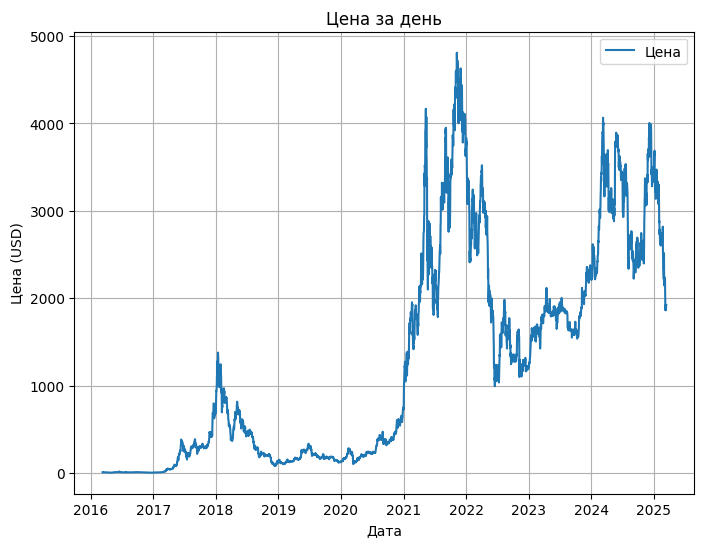

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

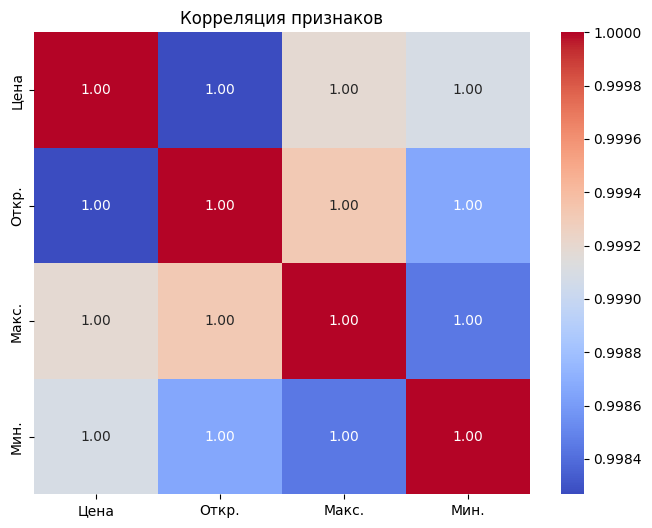

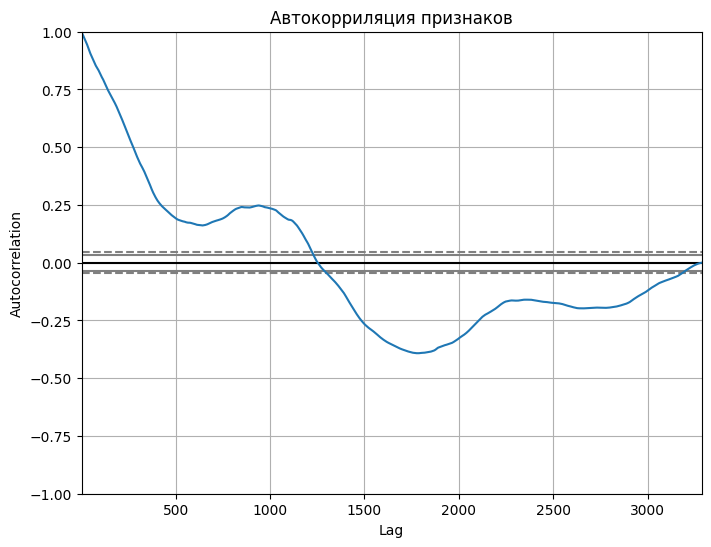

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

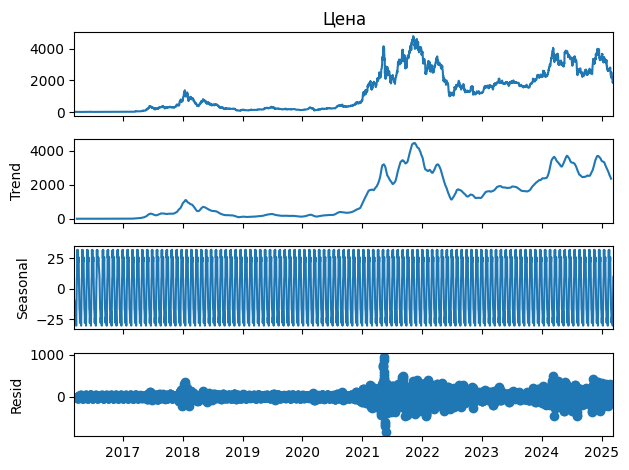

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

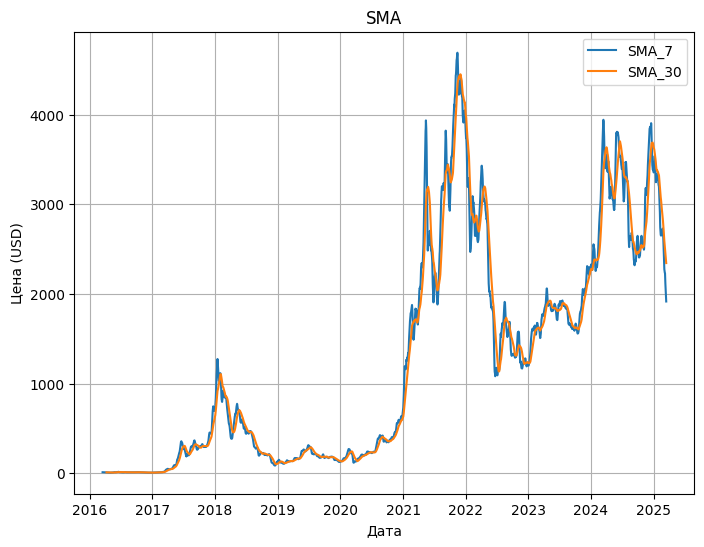

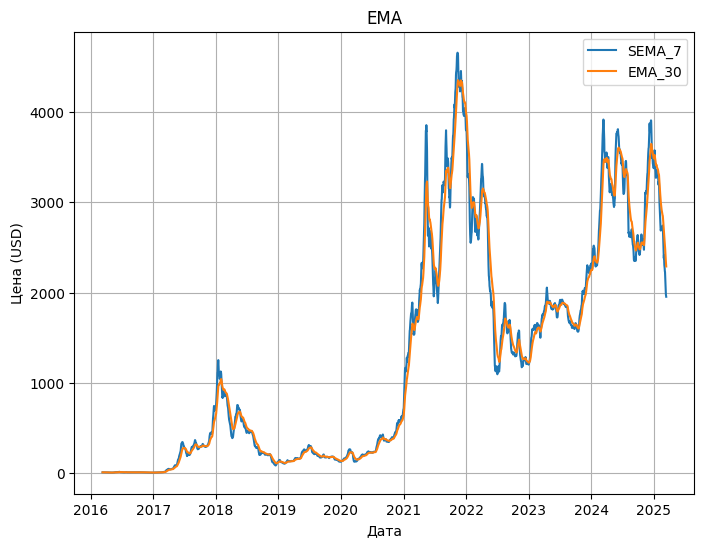

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

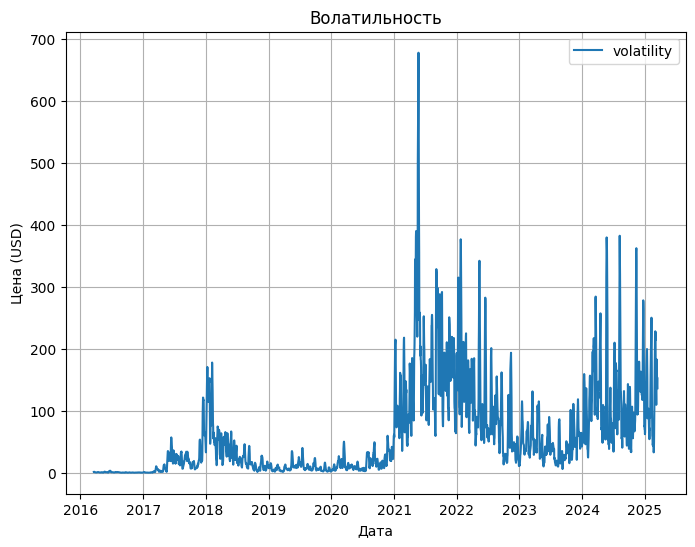

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null      float64
 4   SMA_7       0 non-null      float64
 5   SMA_30      0 non-null      float64
 6   EMA_7       0 non-null      float64
 7   EMA_30      0 non-null      float64
 8   volatility  0 non-null      float64
 9   Z-score     0 non-null      float64
dtypes: float64(10)
memory usage: 0.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null    

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

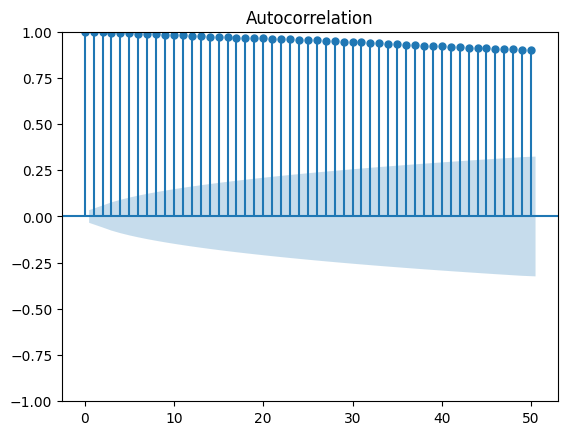

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

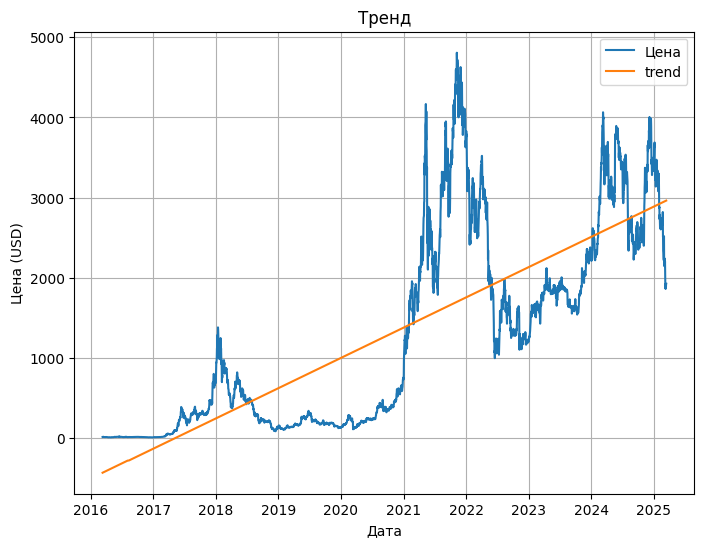

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.31128
❌ Ряд НЕ стационарный (p >= 0.05)


In [21]:
crate_base_research_data('crypt_Ethereum', crypt_Ethereum) 

## 📊 Исследование временного ряда Ethereum

### 1. Общая динамика 📈
На графике временного ряда наблюдается чётко выраженный восходящий тренд Ковидного периода, псоле конца которого стоимость резко сократилась ввиду снижения популярности майнинга, так же виден существенные колебания цены по времени.

---

### 2. Автокорреляция признаков 🔁

График показывает постепенное убывание автокорреляции с увеличением лага. Наблюдается высокая положительная автокорреляция при малых лагах, что указывает на сильную зависимость текущих значений от небольшого кол-ва прошлых, значит цены есть инерция. После ~1000 лага автокорреляция становится отрицательной и затем плавно движется к нулю.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента: **тренд**, **сезонность**, **остаток (шум)**:
- **Тренд** демонстрирует долгосрочный рост до 2022 года, затем снижение.
- **Сезонность** выражена ярко — повторяющиеся паттерны колебаний.
- **Остаток** содержит высокочастотный шум и отдельные выбросы в период максимального пика цен

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены:
- **SMA** — простое скользящее среднее за 7 и 30 дней
- **EMA** — экспоненциальное среднее с той же длиной окна

Сглаживание в обоих случаях показывает нам острые пики цен на данную крипту с плохо просматривающиемися зависимостями.

---

### 5. Волатильность (шумность ряда) 🌪

График показывает, что в периоды бурного роста или падения (2021–2022) волатильность резко возрастает. Второй рост волатильности виден в период 2024 и начало 2025 года

---

### 6. Аномалии (Z-score & IQR) ⚠️

В данном временном ряде аномальных значений по рассчёту методом Z-score и IQR не обнаружено

---

### 7. Сезонность ACF 🔁

График ACF показывает, что значения временного ряда имеют устойчивую положительную автокорреляцию до 50 лага. Все значения выше доверительного интервала, что подтверждает значимость автозависимости.

---

### 8. Линейный тренд 📈

Линейный тренд показывает нам высокую динамику рсота на протяжении вссех 7 лет.

---

### 9. ADF-тест на стационарность 📉

- **p-значение = 0.31128**
- Гипотеза о нестационарности **не отвергается**

---

### 🧾 Вывод


Ряд нестационарный, содержит долгосрочные зависимости. Возможно наличие скрытого цикла или инерции. Ряд обладает как сезонными, так и трендовыми компонентами Наблюдается высокая сезонность и наличие памяти в ряду. Временной ряд BTC нестационарный. Необходимо использовать преобразования (например, дифференцирование) перед применением моделей, требующих стационарности. Стоимость актива имее сильную волатильность в период активности большо числа покупателей/продавцов.


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: crypt_BTC</div>

Статистика по данным:
                Цена          Откр.          Макс.           Мин.
count    3355.000000    3355.000000    3355.000000    3355.000000
mean    24007.290015   23982.838182   24522.671386   23418.173651
std     24581.790644   24562.994420   25069.685952   24029.357652
min       358.900000     359.000000     374.000000     353.200000
25%      5982.500000    5951.400000    6174.550000    5696.300000
50%     11757.000000   11746.000000   11942.000000   11392.500000
75%     38523.000000   38495.550000   39715.500000   37559.500000
max    106150.000000  106150.000000  109410.000000  105160.000000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

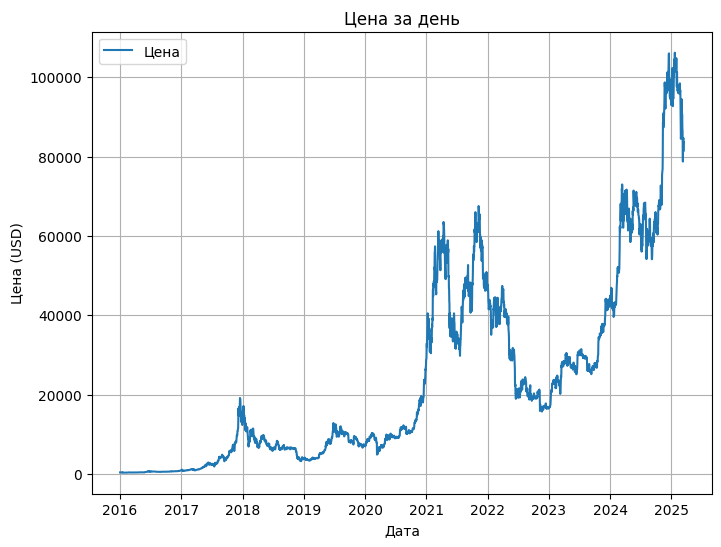

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

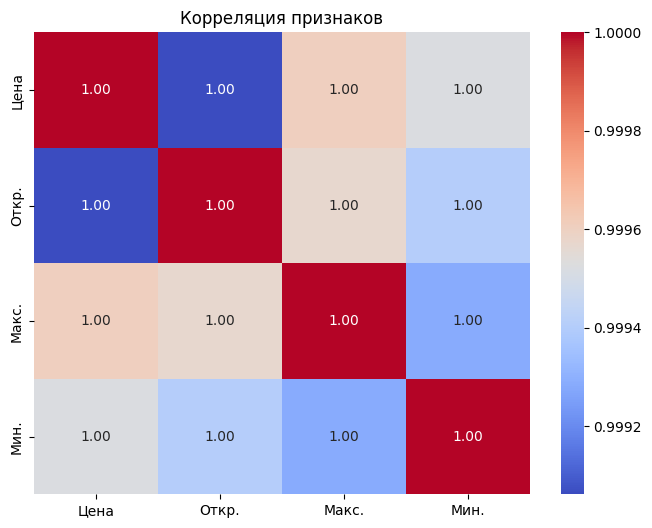

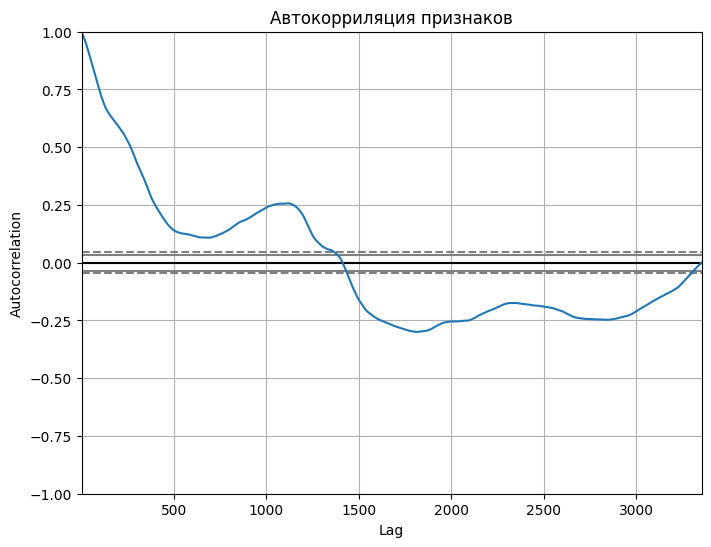

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

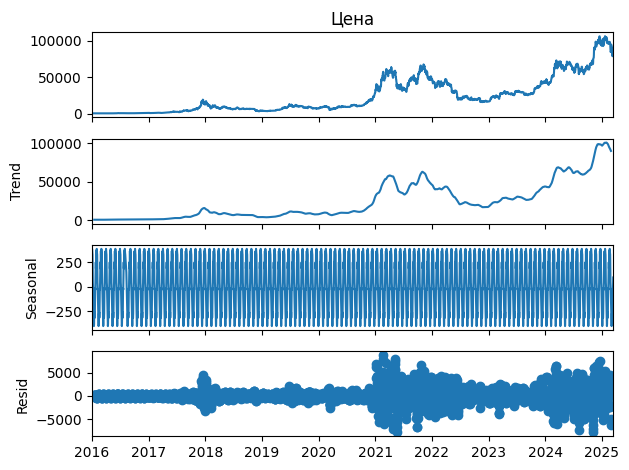

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

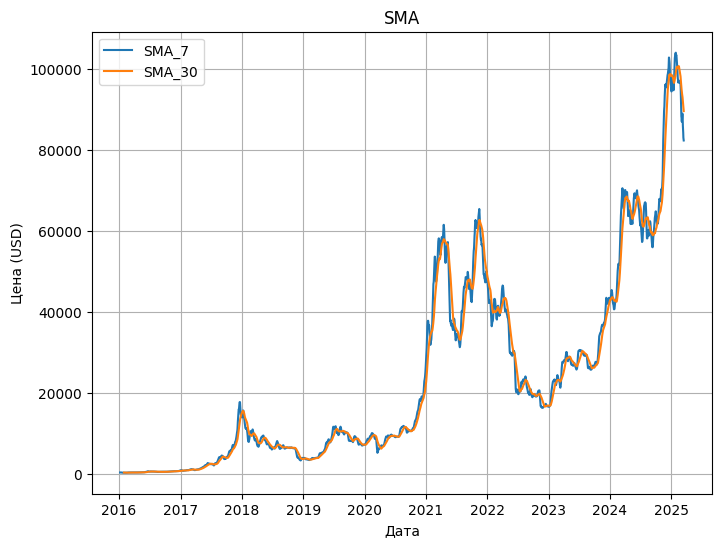

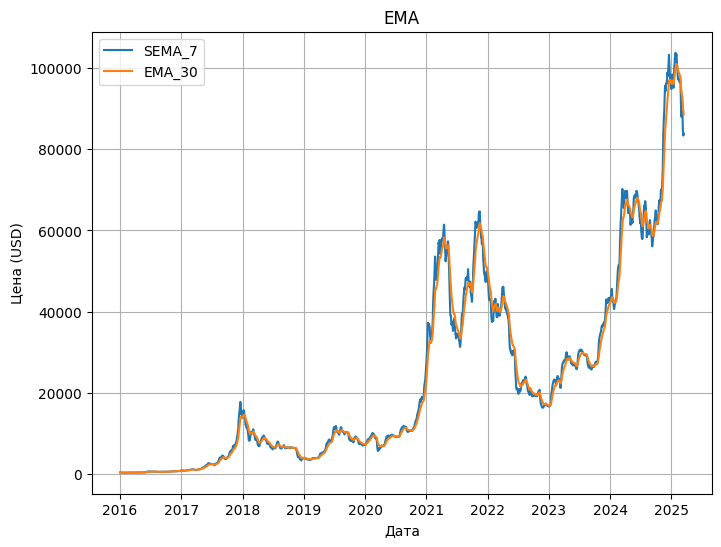

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

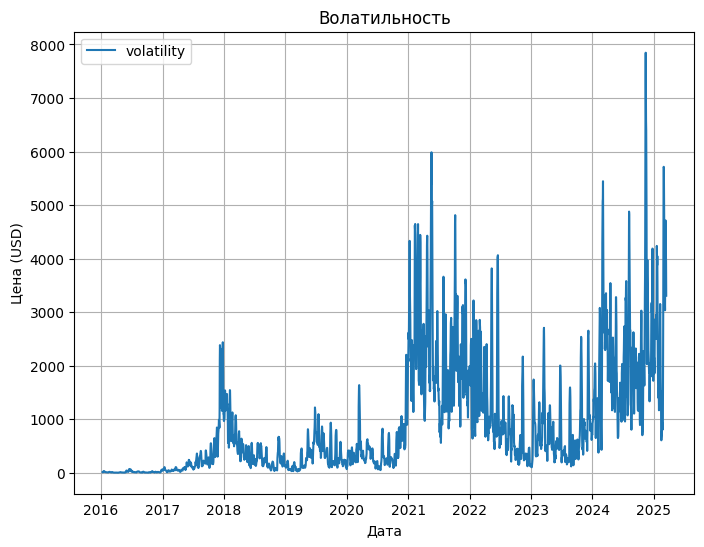

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 44 entries, 2024-11-21 to 2025-02-20
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        44 non-null     float64
 1   Откр.       44 non-null     float64
 2   Макс.       44 non-null     float64
 3   Мин.        44 non-null     float64
 4   SMA_7       44 non-null     float64
 5   SMA_30      44 non-null     float64
 6   EMA_7       44 non-null     float64
 7   EMA_30      44 non-null     float64
 8   volatility  44 non-null     float64
 9   Z-score     44 non-null     float64
dtypes: float64(10)
memory usage: 3.8 KB
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 110 entries, 2024-11-11 to 2025-03-06
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        110 non-null    float64
 1   Откр.       110 non-null    float64
 2   Макс.       110

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

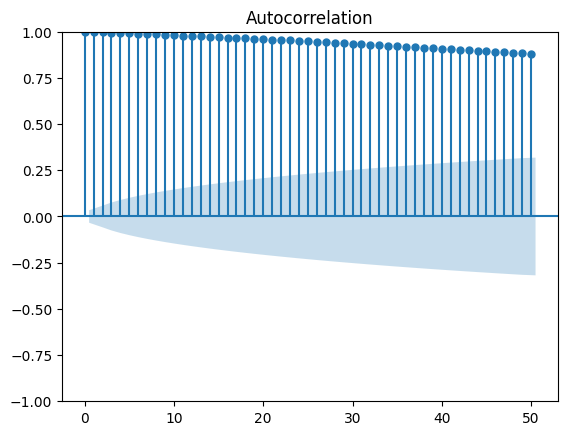

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

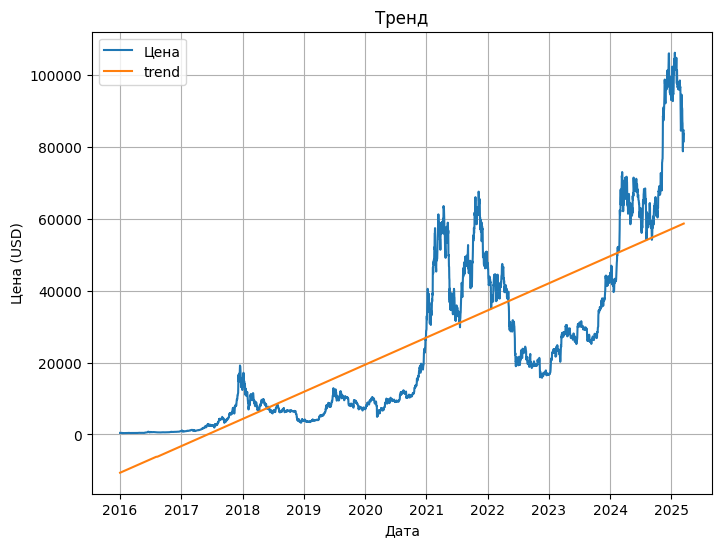

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.86345
❌ Ряд НЕ стационарный (p >= 0.05)


In [22]:
crate_base_research_data('crypt_BTC', crypt_BTC) 

## 📊 Исследование временного ряда Bitcoin

### 1. Общая динамика 📈

На графике временного ряда наблюдается чётко выраженный восходящий тренд ковидного периода, и восходящий высоки тренд 2024-2025 года. В сравнении с Ethereum, биткоин имеет более стабильную структуру графика в виду большего его признания на мировом уровне как универсальной монеты.

---

### 2. Автокорреляция признаков 🔁

График демонстрирует медленно убывающую автокорреляцию с увеличением лага. Начальные значения близки к 1, что говорит о сильной зависимости текущих значений от предыдущих. Начиная примерно с 1300 лага наблюдается отрицательная автокорреляция которая постепенно стремиться к нулю.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента: тренд, сезонность, остаток (шум)
- **Тренд**: чётко выражен рост стоимости BTC с 2020 по 2022, затем фаза падения и новый рост в 2024–2025.
- **Сезонность**: регулярные колебания, трудно различима какая-либо сезонность
- **Остаток**: содержит шум и сильные аномалии (2021 2022 и 2024-2025).

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены:
- **SMA** — простое скользящее среднее за 7 и 30 дней
- **EMA** — экспоненциальное среднее с той же длиной окна

Сглаживание показывает нам что цена после резкого скачка не возвращается к исходным значения, что говорит о постоянном тренде роста.

---

### 5. Волатильность (шумность ряда) 🌪

Волатильность BTC достигает пиков во времена резкого роста или падения цен — особенно в 2017, 2021 и конце 2024 года.

---

### 6. Аномалии (Z-score & IQR) ⚠️

Таблица содержит даты и значения выбросов, обнаруженных по **Z-оценке**. Все значения имеют Z > 3, что подтверждает наличие статистически значимых отклонений. Особенно это касается участков в конце 2024 и начале 2025 года — в периоды резкого роста. Так же отколнения в значениях были найдены методом квантилей.

---

### 7. Сезонность ACF 🔁

График автокорреляционной функции демонстрирует **стабильно высокие значения** на протяжении первых 50 лагов. Все значения значительно выше доверительного интервала.

---
### 8. Линейный тренд 📈

Линейный тренд показывает нам высокую динамику рсота на протяжении вссех 7 лет.

---

### 9. ADF-тест на стационарность 📉

- **p-значение = 0.86345**
- Гипотеза о нестационарности **не отвергается**


### 🧾 Вывод

У временного ряда BTC ярко выражена инерционность и долгосрочная зависимость, что говорит о наличии тренда и делает ряд нестационарным. BTC обладает трендовой и сезонной структурой.  BTC — высоковолатильный актив, подверженный резким ценовым скачкам с присутствующими явными вбросовыми значениями. Необходимо использовать преобразования (например, дифференцирование) перед применением моделей.



<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: futures_WTI_CLJ5</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2421.000000  2421.000000  2421.000000  2421.000000
mean     63.524965    63.532214    64.543577    62.469331
std      17.599804    17.597990    17.866363    17.295033
min      11.570000    18.010000    19.660000     6.500000
25%      50.350000    50.340000    50.980000    49.720000
50%      63.670000    63.650000    64.450000    62.910000
75%      75.320000    75.330000    76.500000    74.010000
max     119.780000   120.660000   126.420000   118.520000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

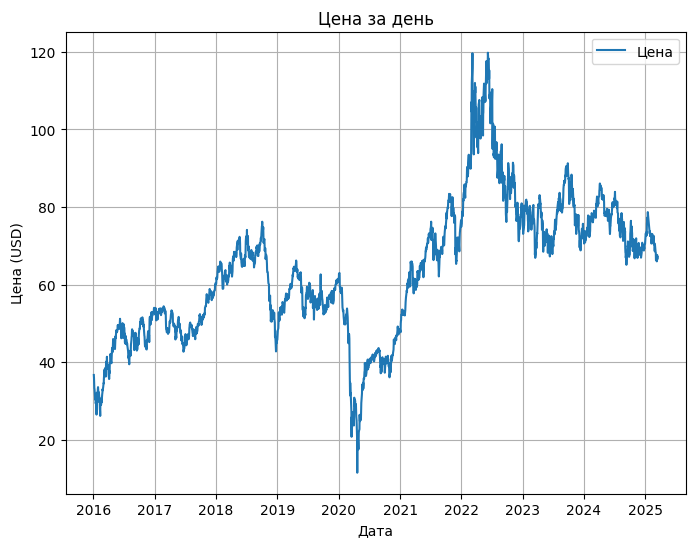

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

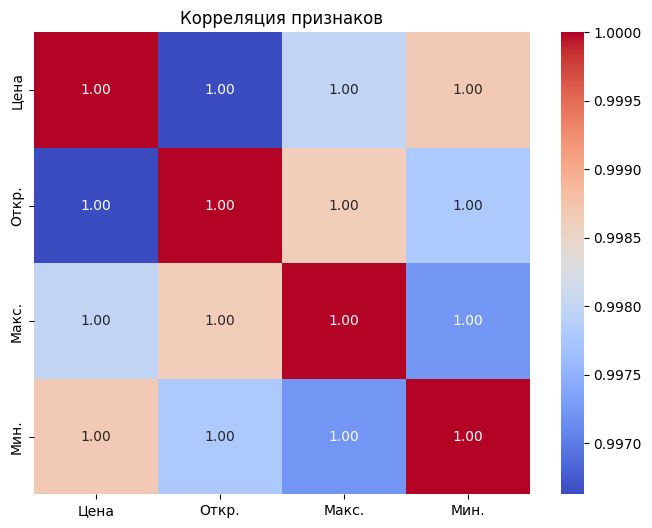

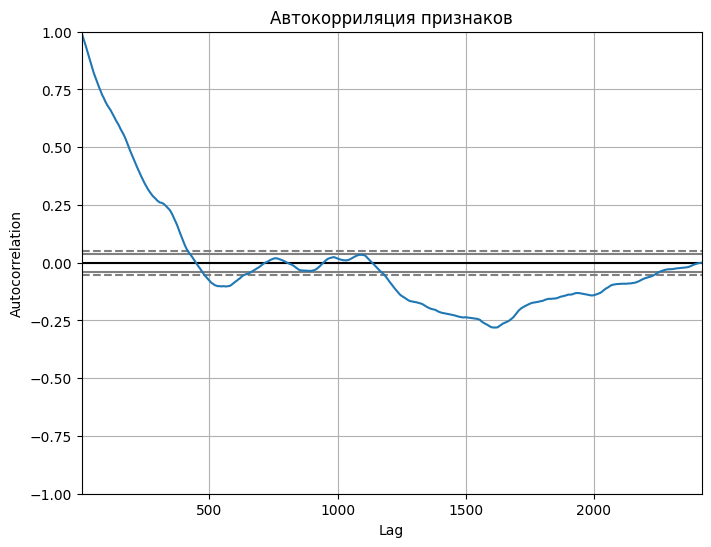

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

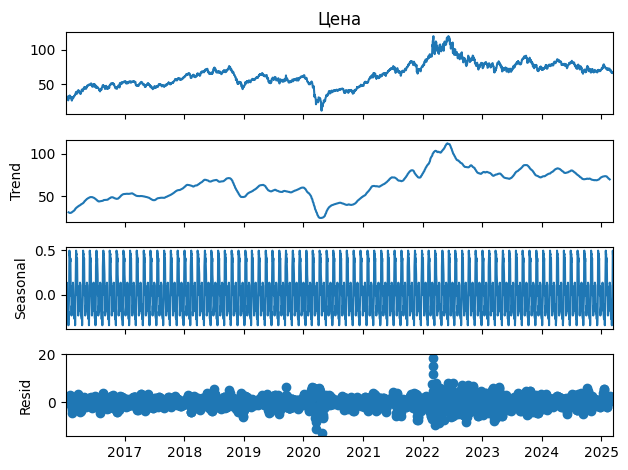

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

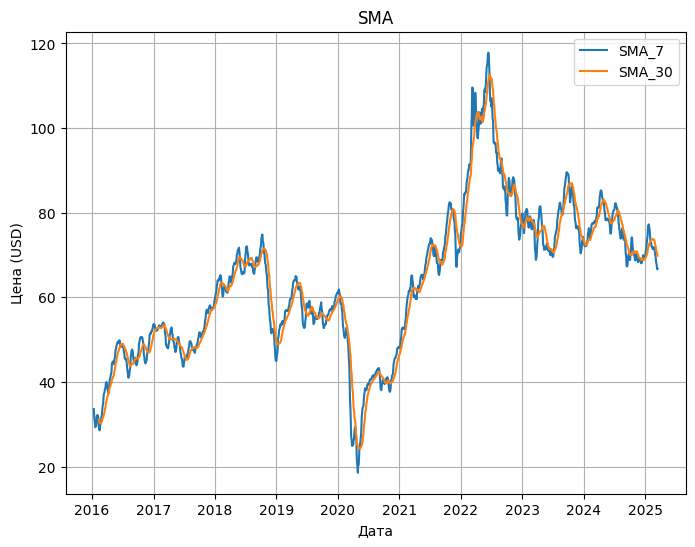

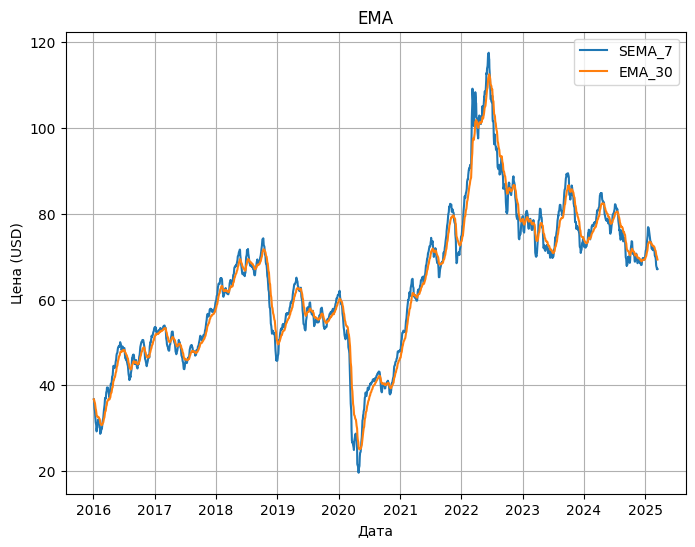

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

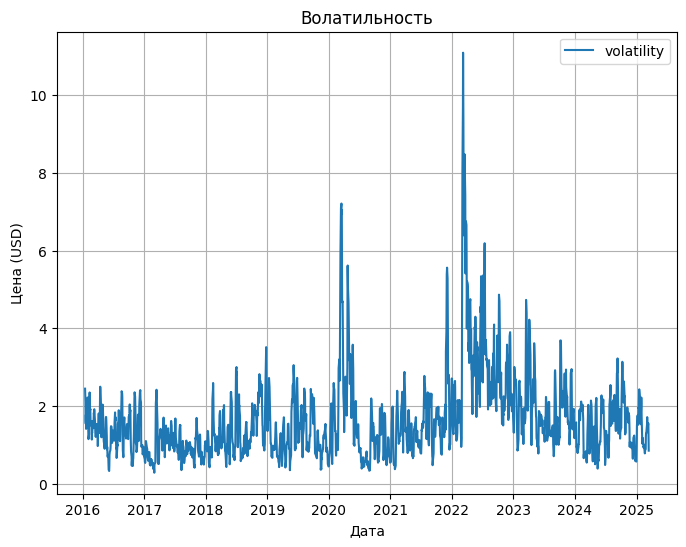

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7 entries, 2022-03-08 to 2022-06-13
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        7 non-null      float64
 1   Откр.       7 non-null      float64
 2   Макс.       7 non-null      float64
 3   Мин.        7 non-null      float64
 4   SMA_7       7 non-null      float64
 5   SMA_30      7 non-null      float64
 6   EMA_7       7 non-null      float64
 7   EMA_30      7 non-null      float64
 8   volatility  7 non-null      float64
 9   Z-score     7 non-null      float64
dtypes: float64(10)
memory usage: 616.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16 entries, 2020-04-21 to 2022-06-16
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        16 non-null     float64
 1   Откр.       16 non-null     float64
 2   Макс.       

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

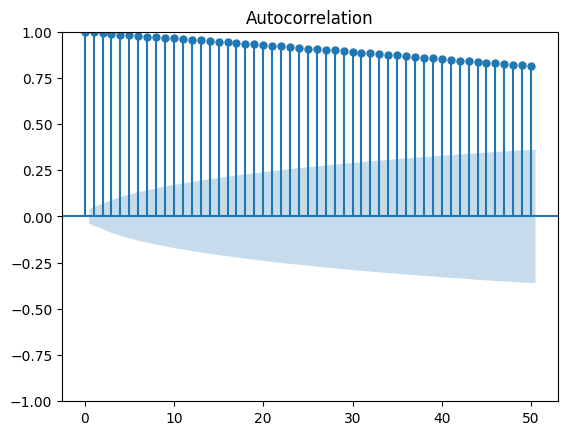

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

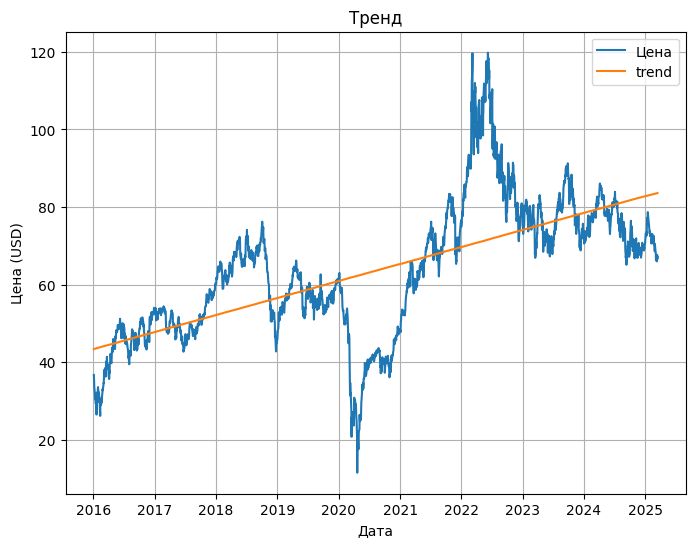

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.19477
❌ Ряд НЕ стационарный (p >= 0.05)


In [23]:
crate_base_research_data('futures_WTI_CLJ5', futures_WTI_CLJ5) 

## 📊 Исследование временного ряда фьючерса нефти WTI

### 1. Общая динамика 📈

Ряд выглядит более стабильным по сравнению с криптовалютами, но в нём присутствуют сильные падения цены связанные с изменением в энергетической политике различных государств закупающих нефть.

### 2. Автокорреляция признаков 🔁

Автокорреляция на малых лагах очень высокая (близка к 1), что указывает на сильную зависимость от предыдущих значений. Далее она быстро затухает, переходит в зону отрицательных значений.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента: **тренд**, **сезонность**, **остаток (шум)**:
- **Тренд**: хорошо выраженный рост с 2020 до середины 2022 года, затем снижение и консолидация.
- **Сезонность**: слабо выражена, амплитуда около ±0.5, что ожидаемо для сырьевых активов но можно утверждать что она присутствует.
- **Остаток (resid)**: содержит выбросы, особенно в 2020–2022 — вероятно, реакция на мировые события, но в целом шума меньше чем в криптовалютных операциях.

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены:
- **SMA** — простое скользящее среднее за 7 и 30 дней
- **EMA** — экспоненциальное среднее с той же длиной окна

Скользящие средние в обоих случая показывают плавное движение цен, с присутствием явных фиксаций цен на пиках и стремлением к продолжительному удержанию цен на одном значении.

---

### 5. Волатильность (шумность ряда) 🌪

Волатильность держиться практически в одном диапазоне, за исключением моментов с резким падением или возрастанием цен.

---

### 6. Аномалии (Z-score & IQR) ⚠️

- **Z-score выявил всплески в 2022 году**, когда цена превысила порог в 3 стандартных отклонения.
- **IQR подтвердил те же участки как выбросы** — особенно в марте–июне 2022 года.

---

### 7. Сезонность ACF 🔁

Все значения ACF выше доверительного интервала — наблюдается **устойчивая положительная автозависимость** до 50 лагов. Это подтверждает, что прошлые значения полезны при прогнозировании.

---

### 8. Линейный тренд 📈

График демонстрирует положительный линейный тренд, несмотря на сильные краткосрочные колебания. Оранжевая линия тренда указывает на **общий рост стоимости WTI** с 2016 по 2025.

---

### 9. ADF-тест на стационарность 📉

- **p-значение = 0.19477**
- Гипотеза о нестационарности не отвергается

---

### 🧾 Вывод
Ряд нестационарен, но обладает циклической структурой и значительной инерцией.Ряд комбинирует трендовую структуру с малой сезонностью и умеренным шумом. Период весны–лета 2022 года для нефти был аномальным и нестабильным. Сильная автозависимость свидетельствует о высокой предсказуемости актива.
Долгосрочная тенденция восходящая. Ряд нестационарный, следует применять дифференцирование перед использованием моделей.



<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: futures_Brent_LCOK5</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2376.000000  2376.000000  2376.000000  2376.000000
mean     68.036667    68.030703    69.062841    66.958880
std      18.558671    18.550856    18.839486    18.240055
min      19.330000    19.900000    21.290000    15.980000
25%      54.017500    54.117500    54.807500    53.325000
50%      69.270000    69.195000    70.010000    68.330000
75%      79.982500    80.077500    81.472500    79.055000
max     127.980000   130.280000   139.130000   122.500000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

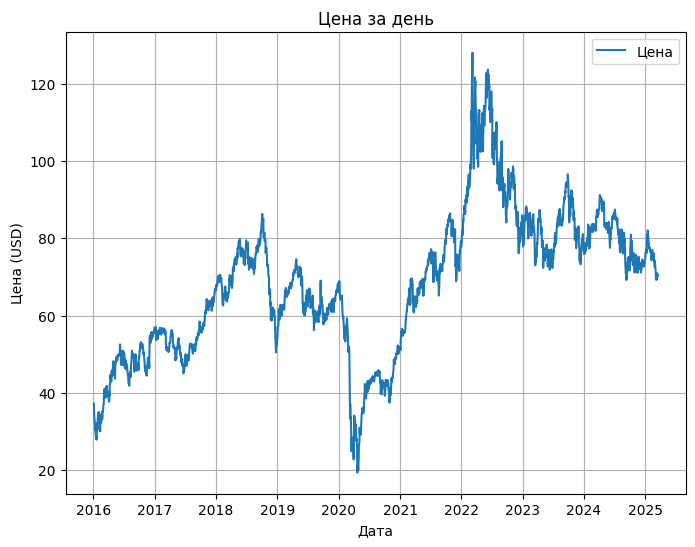

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

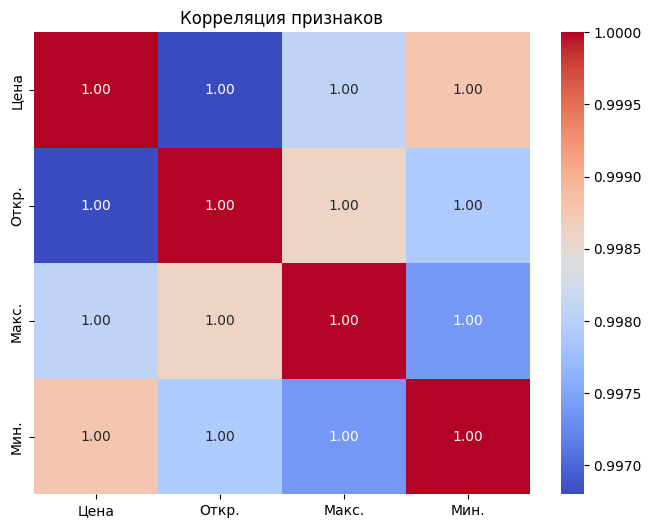

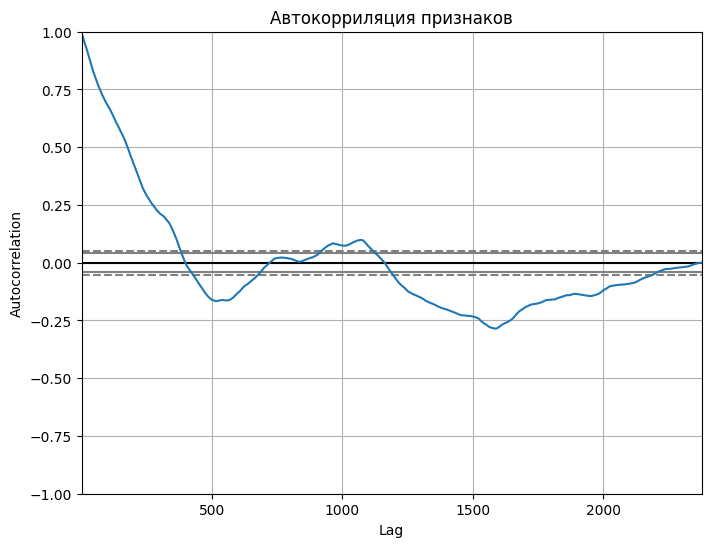

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

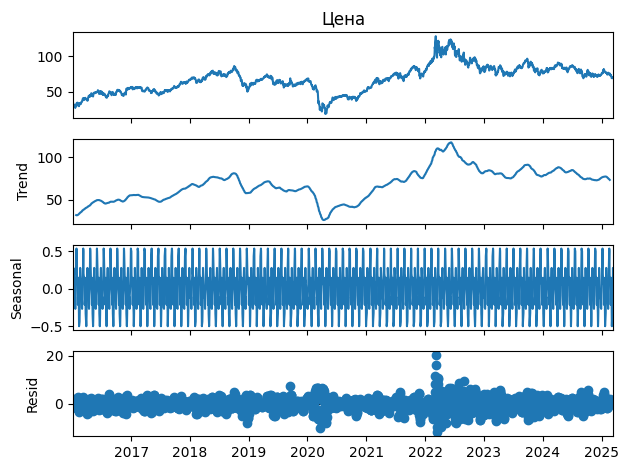

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

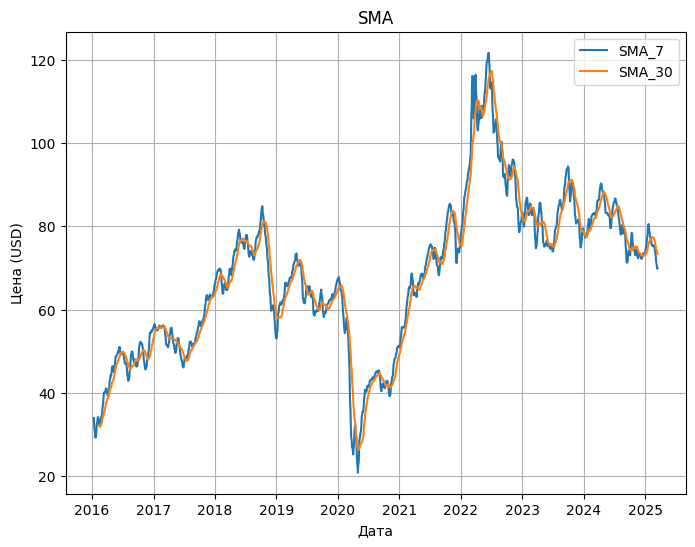

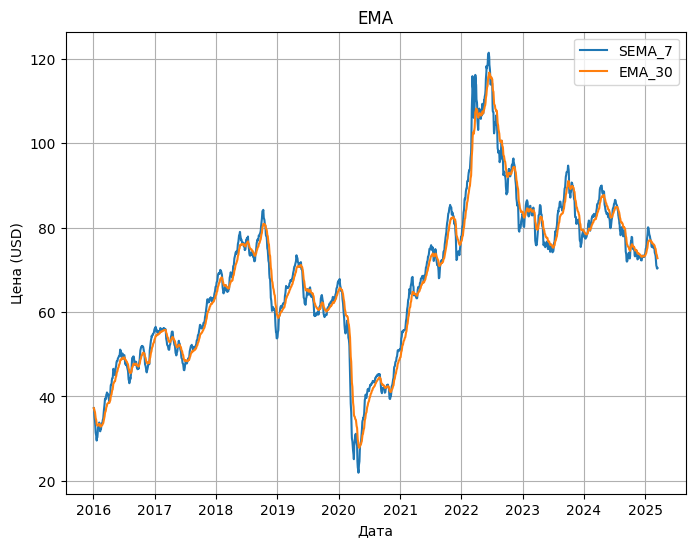

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

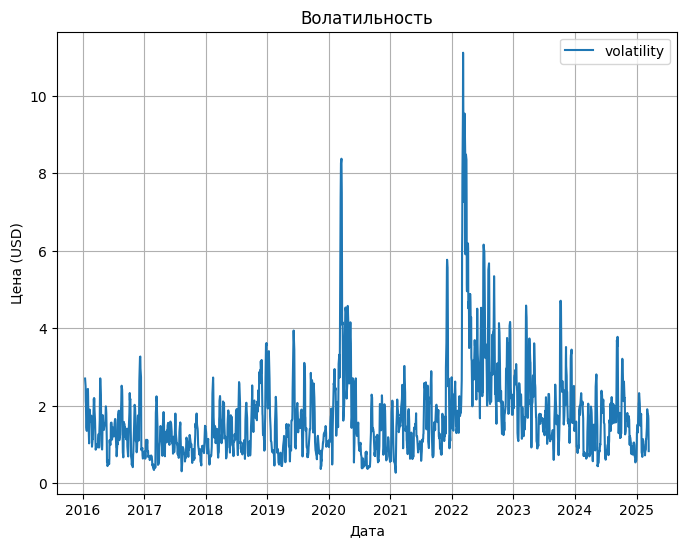

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1 entries, 2022-03-08 to 2022-03-08
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        1 non-null      float64
 1   Откр.       1 non-null      float64
 2   Макс.       1 non-null      float64
 3   Мин.        1 non-null      float64
 4   SMA_7       1 non-null      float64
 5   SMA_30      1 non-null      float64
 6   EMA_7       1 non-null      float64
 7   EMA_30      1 non-null      float64
 8   volatility  1 non-null      float64
 9   Z-score     1 non-null      float64
dtypes: float64(10)
memory usage: 88.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17 entries, 2022-03-07 to 2022-06-16
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        17 non-null     float64
 1   Откр.       17 non-null     float64
 2   Макс.       1

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

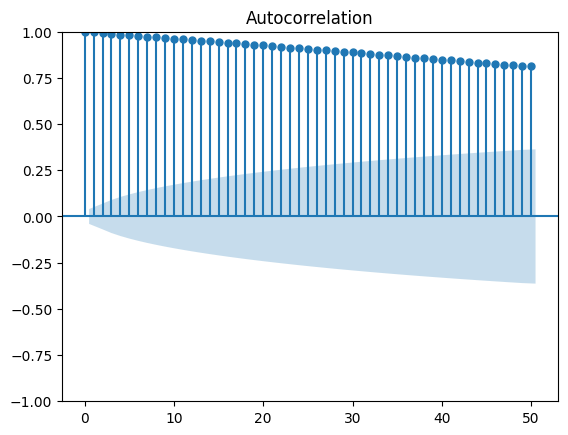

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

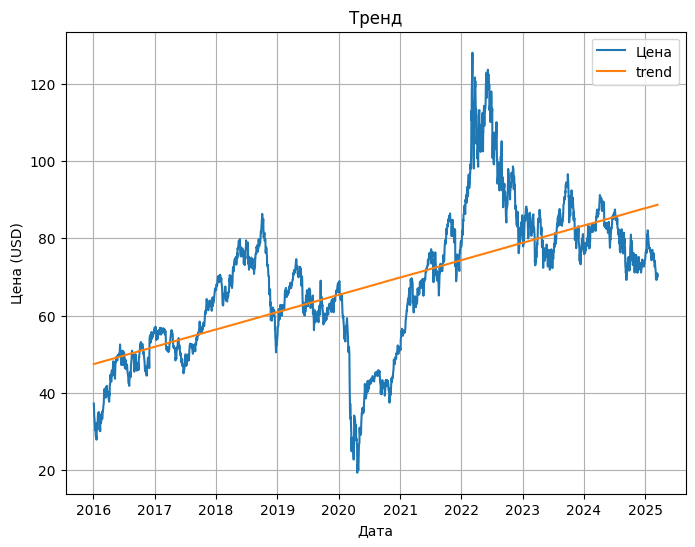

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.15445
❌ Ряд НЕ стационарный (p >= 0.05)


In [24]:
crate_base_research_data('futures_Brent_LCOK5', futures_Brent_LCOK5) 

## 📊 Исследование временного ряда фьючерса нефти Brent (LCOK5)

### 1. Общая динамика 📈

Общая динамика практически идентично другой марке нефти WTI, это характерезуется особеннсотями рынка энергоресусров

---

### 2. Автокорреляция признаков 🔁

Автокорреляция высока на малых лагах и постепенно затухает. Наблюдается отрицательная зона после ~500 лага, что характерно для рядов с трендом.

---

### 3. Декомпозиция временного ряда 🧩

График декомпозиции показывает:
- **Тренд** — ярко выраженный рост в 2021–2022 году, далее постепенное снижение и стабилизация.
- **Сезонность** — выражена слабо, но периодическая структура сохраняется.
- **Остаток (Resid)** — особенно сильные колебания в начале 2022 года, указывающие на рыночные выбросы.

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены:
- **SMA** — простое скользящее среднее за 7 и 30 дней
- **EMA** — экспоненциальное среднее с той же длиной окна

Скользящие средние в обоих случая показывают плавное движение цен, с присутствием явных фиксаций цен на пиках и стремлением к продолжительному удержанию цен на одном значении.

---

### 5. Волатильность (шумность ряда) 🌪

Волатильность резко увеличивается в пиковые периоды (2022 год) затем снижается. Ситуация аналогична как и у WTI бренда нефти

---

### 6. Аномалии (Z-score & IQR) ⚠️

- Z-score выявил выбросы (значения > 3) в начале марта 2022 года.
- IQR-метод подтвердил эти выбросы.

---

### 7. Сезонность ACF 🔁

ACF показывает **высокую автокорреляцию** на всём интервале (до 50 лагов), что подтверждает **регулярность и наличие сезонных паттернов**.

---

### 8. Линейный тренд 📈

Линейный тренд показывает **общую тенденцию роста**.

---

### 9. ADF-тест на стационарность 📉
- ADF-тест: `p = 0.15445` → ряд **нестационарный**

---

### 🧾 Вывод
Ситуация с данным датасетам аналогична с WTI, имеются абсолютно такие же зависимости и закономерности.
Имеется **долгосрочная зависимость** и **нестационарность**, что следует учитывать при выборе модели и трансформации данных. Ряд имеет чёткий тренд, небольшую сезонность и шум. Ряд содержит участки высокой рыночной нестабильности. Период март–июнь 2022 года содержит **значимые рыночные скачки**, возможно связанные с геополитикой и мировой экономикой. ACF указывает на возможность использования лаговых признаков при построении регрессионных моделей. Временной ряд нефти Brent обладает сильной трендовой структурой, умеренной сезонностью и временными выбросами.


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: share_metal_RUAL</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2300.000000  2300.000000  2300.000000  2300.000000
mean     36.765748    36.781565    37.385785    36.115052
std      12.646604    12.625821    12.963993    12.289654
min      18.710000    18.480000    18.990000    15.040000
25%      27.690000    27.723750    28.093750    27.247500
50%      34.560000    34.560000    35.067500    34.040000
75%      41.202500    41.261250    41.646250    40.651250
max      89.000000    89.000000    89.250000    85.625000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

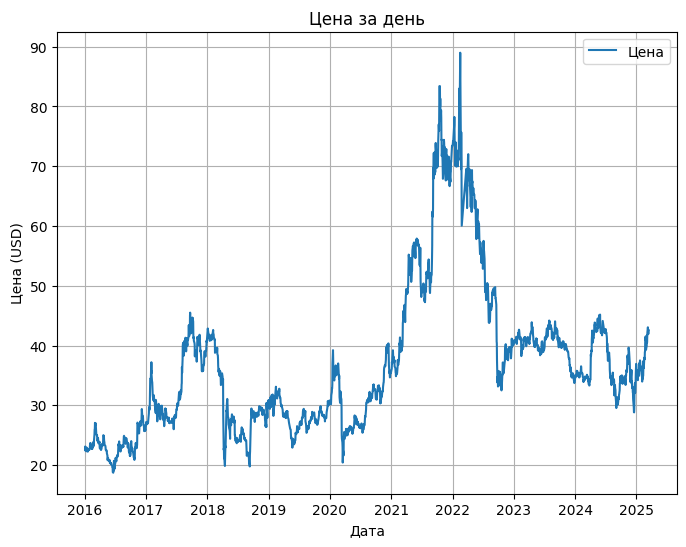

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

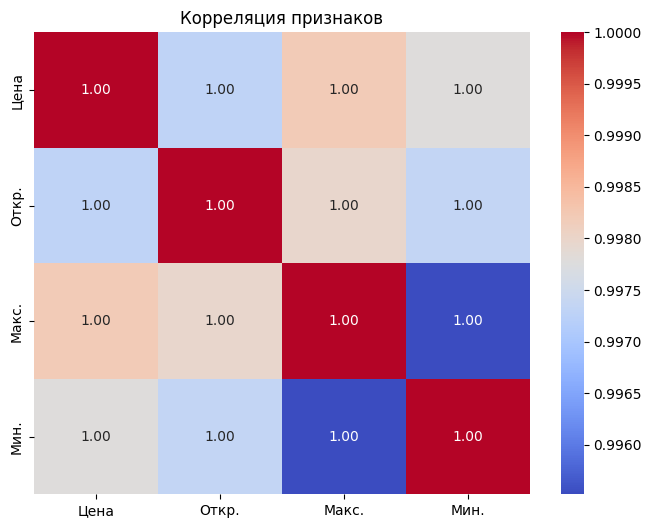

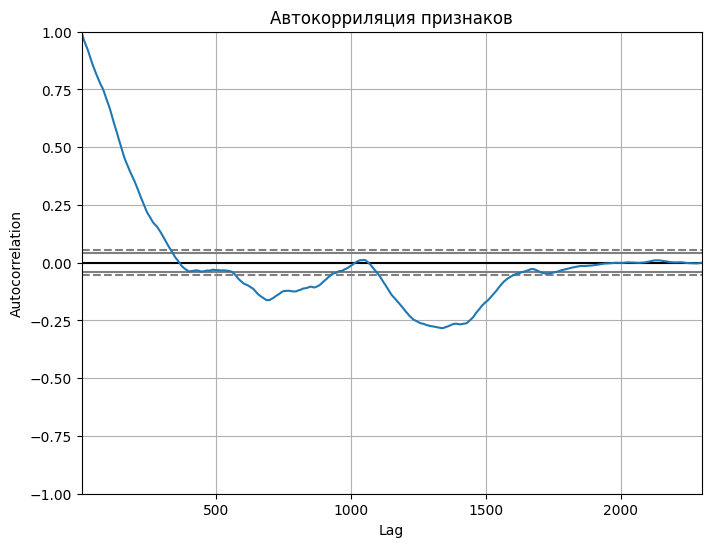

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

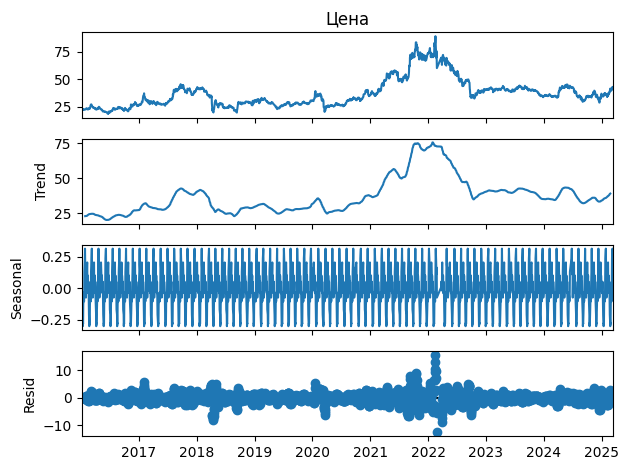

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

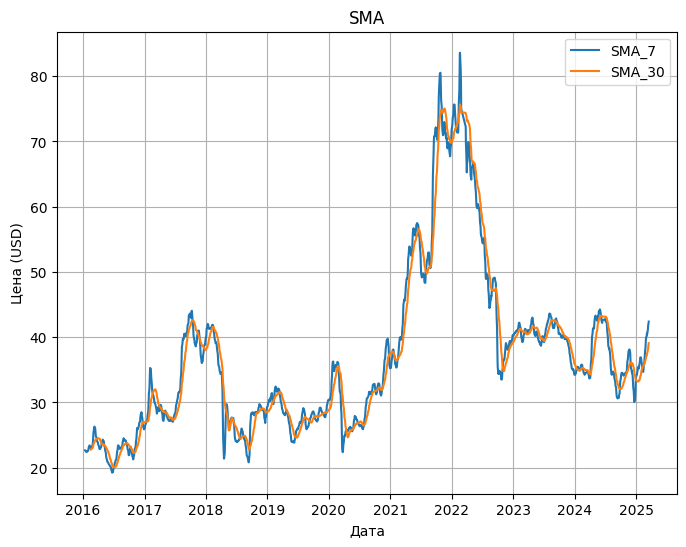

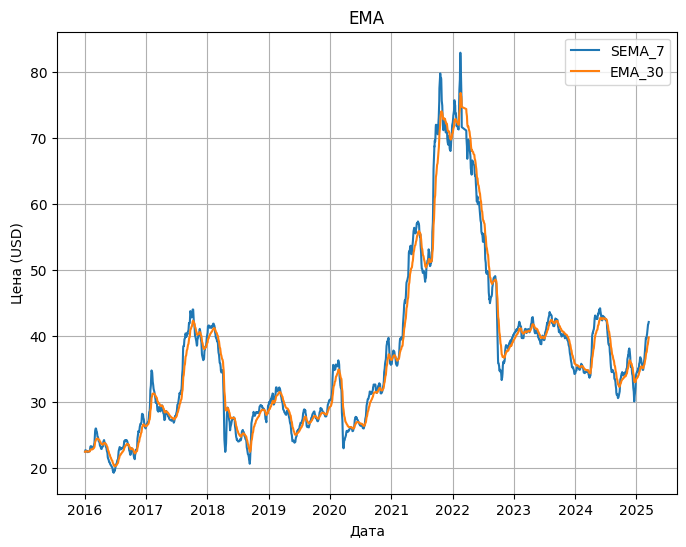

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

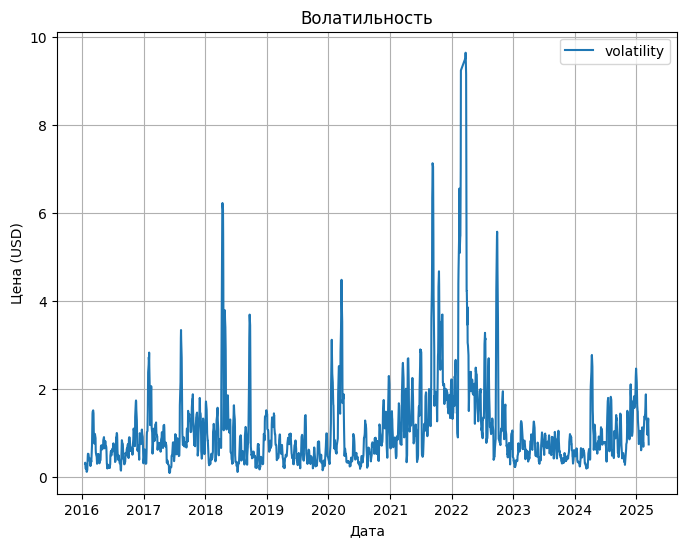

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26 entries, 2021-10-11 to 2022-02-22
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        26 non-null     float64
 1   Откр.       26 non-null     float64
 2   Макс.       26 non-null     float64
 3   Мин.        26 non-null     float64
 4   SMA_7       26 non-null     float64
 5   SMA_30      26 non-null     float64
 6   EMA_7       26 non-null     float64
 7   EMA_30      26 non-null     float64
 8   volatility  26 non-null     float64
 9   Z-score     26 non-null     float64
dtypes: float64(10)
memory usage: 2.2 KB
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 159 entries, 2021-09-03 to 2022-05-30
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        159 non-null    float64
 1   Откр.       159 non-null    float64
 2   Макс.       159

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

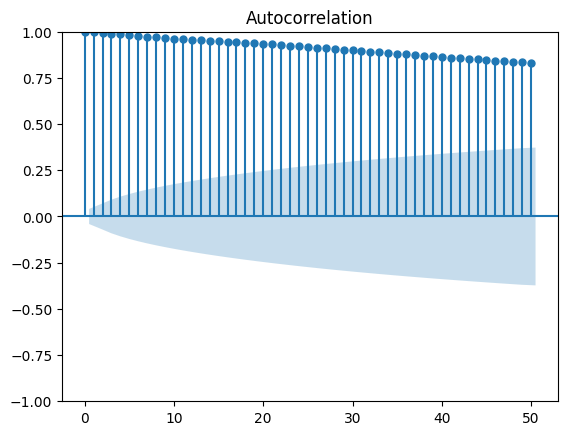

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

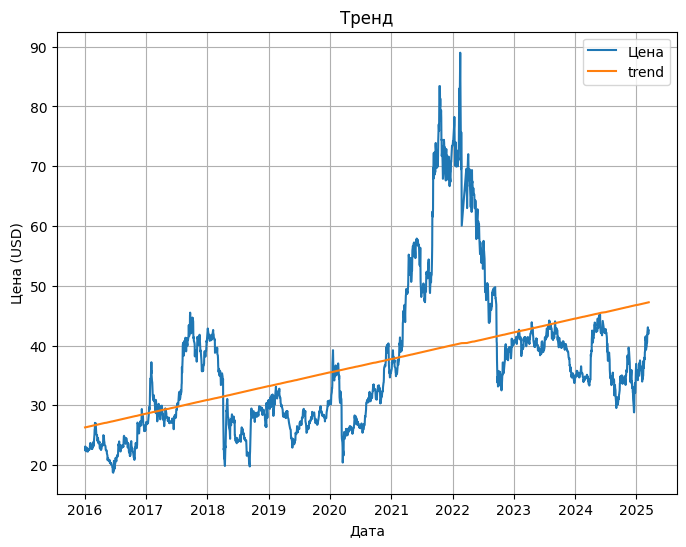

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.21693
❌ Ряд НЕ стационарный (p >= 0.05)


In [25]:
crate_base_research_data('share_metal_RUAL', share_metal_RUAL) 

## 📊 Исследование временного ряда: акции компании RUAL

### 1. Общая динамика 📈

Динамика в целом была относительно стабильной, с резким ростом и падением стоимости акций, в 2022 году замечен резкий рост стоимости акций

---

### 2. Автокорреляция признаков 🔁

Автокорреляция высока на малых лагах и резко затухаект к 400 лагам. Наблюдается отрицательная зона после ~1000 лага, но она так же быстро затухает и сводиться к 0.

---

### 3. Декомпозиция временного ряда 🧩

График состоит из:
- **Trend**: Тренд подтверждает рост акций до 2022 года и спад после.
- **Seasonal**: Наблюдается выраженная сезонность с регулярными колебаниями.
- **Residual**: Остатки содержат выбросы в районе 2022 года, вероятно, связанные с внешними событиями или рыночными шоками

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены:

SMA — простое скользящее среднее за 7 и 30 дней
EMA — экспоненциальное среднее с той же длиной окна

Скользящие средние достаточно подробно повторяют исходну динамику цен, что говорит нам о минимальном наличии шума и наличии стационарносте в данном временном ряде.

---

### 5. Волатильность (шумность ряда) 🌪

Волатильность возрастает в периоды резких рыночных движений. Пик волатильности наблюдается в 2022 году — период нестабильности. Так же стоит заметить очень частые скачки волатильности.

---

### 6. Аномалии (Z-score & IQR) ⚠️

Выявлено множество выбросов, указывающих на аномальные рыночные колебания. С 2021 года число выбросов снизилось, что может говорить о стабилизации стоимости акций.

---

### 7. Сезонность ACF 🔁

Почти все значения ACF выше зоны значимости. Это говорит о наличии устойчивой сезонности: закономерные повторы в ценовой динамике.

---

### 8. Линейный тренд 📈

Линейная регрессия визуализирует общий тренд ряда и показывает нам положительный тренд стоимости акций.

---

### 9. ADF-тест на стационарность 📉

- **p-значение = 0.21693**
- Гипотеза о нестационарности **не отвергается**

---

### 🧾 Вывод

Ряд не является стационарным. Это значит, что статистические свойства ряда (среднее, дисперсия) изменяются со временем.Наличие сезонности подтверждается как декомпозицией ряда, так и автокорреляционной функцией (ACF). Общий тренд положительный, несмотря на колебания и спад после 2022 года.
Волатильность показала периоды рыночной нестабильности, особенно ярко выраженные в 2022 году.
Скользящие средние (SMA и EMA) хорошо описывают структуру цен. Аномалии (выбросы) выявлены в ключевые периоды рыночных колебаний, особенно до 2022 года, что может свидетельствовать о влиянии внешних событий.Ряд требует преобразования (например, дифференцирования) для использования в моделях.


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: share_metal_ALRS</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2306.000000  2306.000000  2306.000000  2306.000000
mean     82.728964    82.745516    83.820646    81.541739
std      19.948848    19.938406    20.190531    19.666947
min      45.600000    45.500000    46.030000    45.000000
25%      68.500000    68.502500    69.507500    67.502500
50%      78.210000    78.230000    78.990000    77.115000
75%      94.477500    94.490000    95.580000    93.347500
max     150.300000   151.000000   153.730000   149.100000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

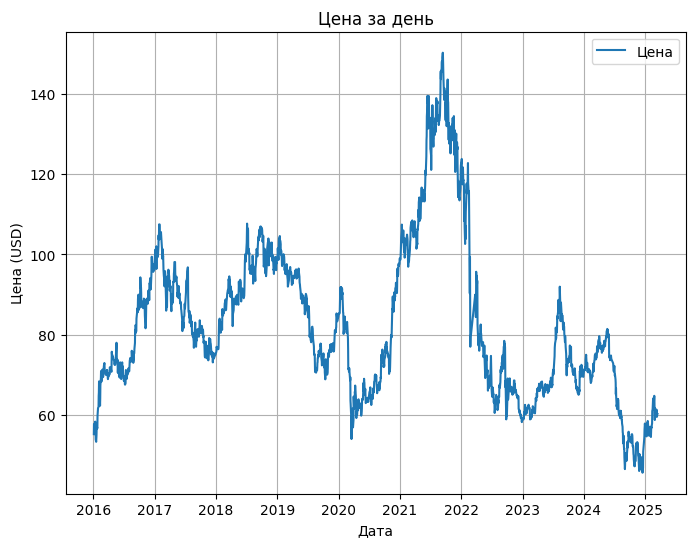

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

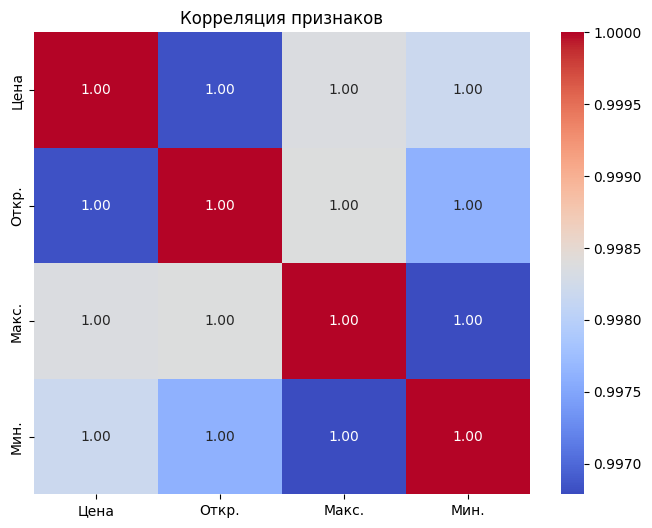

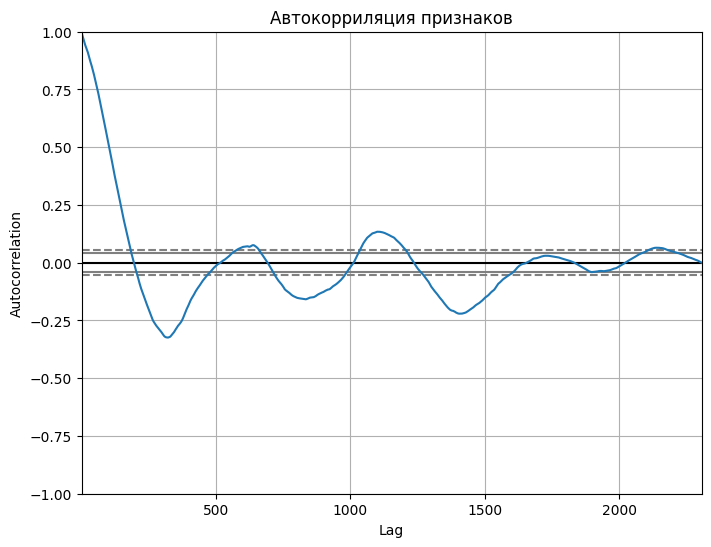

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

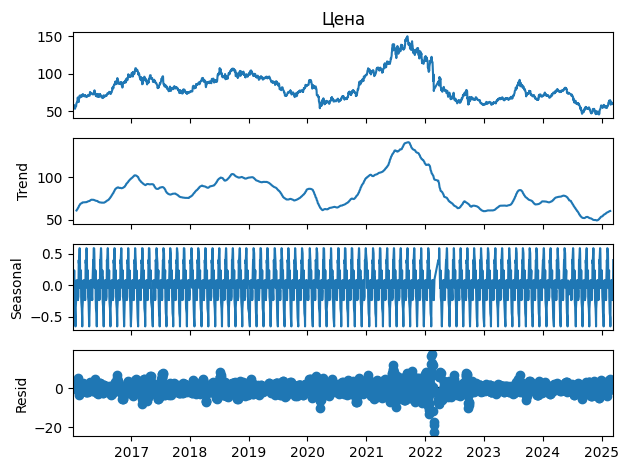

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

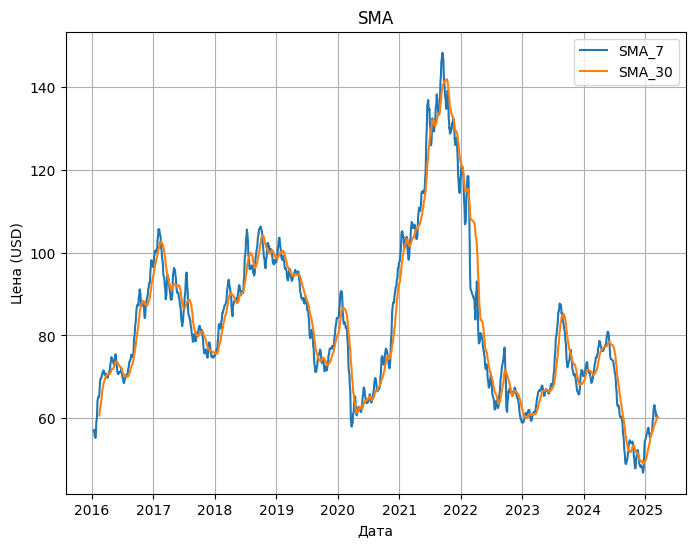

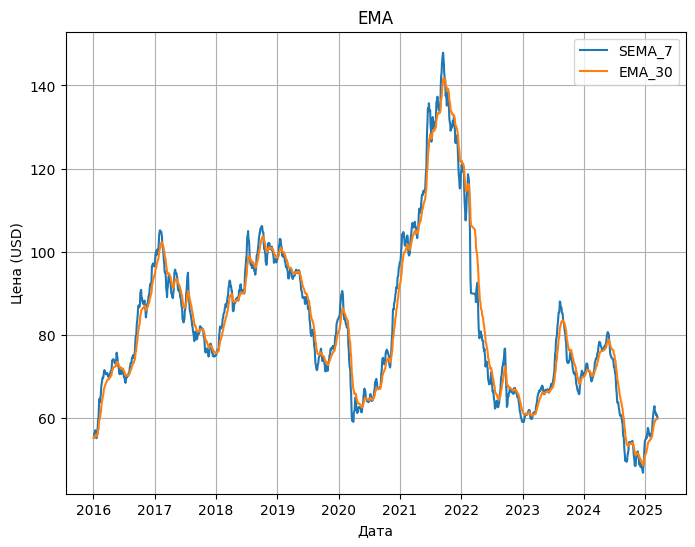

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

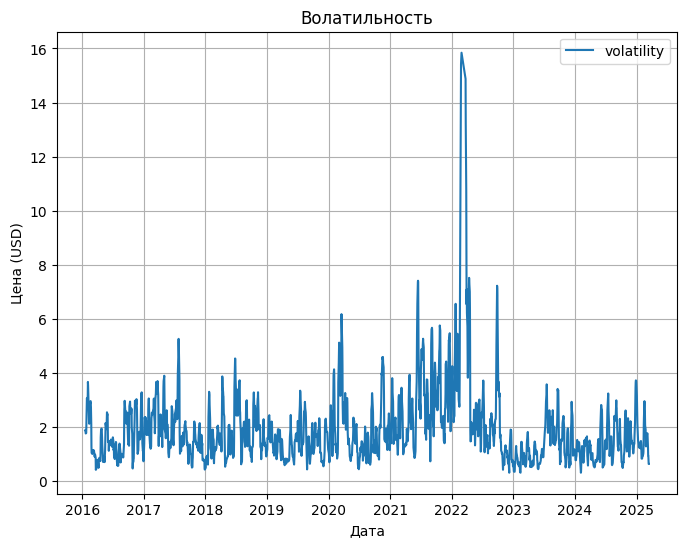

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15 entries, 2021-08-31 to 2021-10-12
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        15 non-null     float64
 1   Откр.       15 non-null     float64
 2   Макс.       15 non-null     float64
 3   Мин.        15 non-null     float64
 4   SMA_7       15 non-null     float64
 5   SMA_30      15 non-null     float64
 6   EMA_7       15 non-null     float64
 7   EMA_30      15 non-null     float64
 8   volatility  15 non-null     float64
 9   Z-score     15 non-null     float64
dtypes: float64(10)
memory usage: 1.3 KB
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 65 entries, 2021-06-10 to 2021-11-18
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        65 non-null     float64
 1   Откр.       65 non-null     float64
 2   Макс.       65 n

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

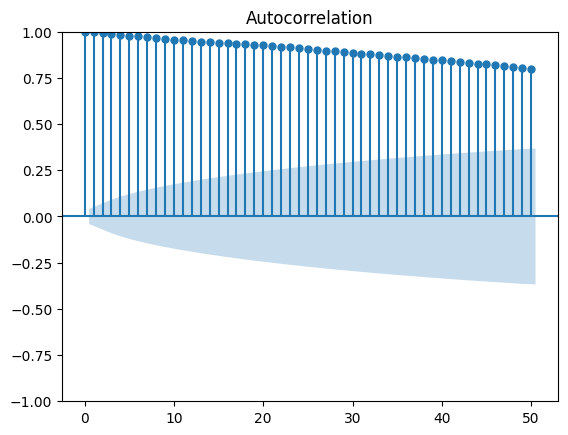

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

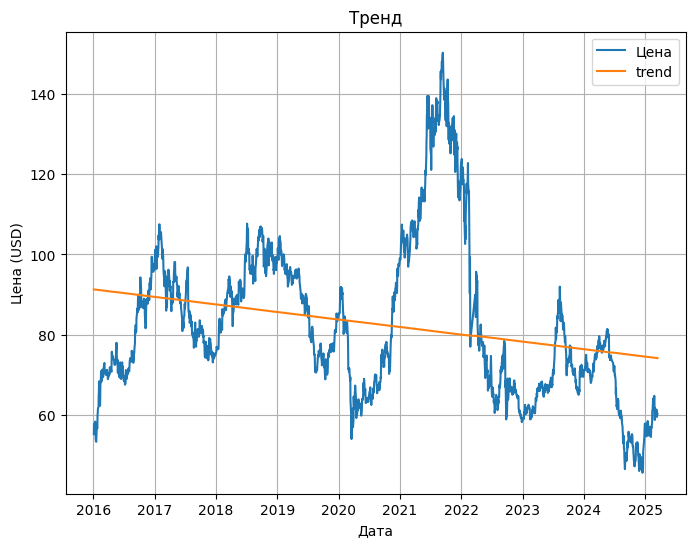

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.33501
❌ Ряд НЕ стационарный (p >= 0.05)


In [26]:
crate_base_research_data('share_metal_ALRS', share_metal_ALRS) 

## 📊 Исследование временного ряда: стоимости акций компании ALRS

### 1. Общая динамика 📈

Динамика явно имеет цикличнось, но начиная с 2023 года виднеется постоянный спад стоимости акций компаний до наблюдаемого минимума.

---

### 2. Автокорреляция признаков 🔁

График автокорреляции демонстрирует высокую положительную корреляцию на малых лагах, что говорит о наличии памяти в ряде: текущие значения тесно связаны с предыдущими. Далее автокорреляция затухает, колеблясь около нуля, но не исчезает полностью — наблюдаются волнообразные всплески и спады, что указывает на возможную слабую цикличность.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента:

- **Тренд**  общий тренд восходящий до конца 2021 года, затем наблюдается устойчивое снижение.
- **Сезонность** компонент сезонности имеет чёткую повторяющуюся форму. Это говорит о наличии регулярных паттернов (например, недельных или месячных колебаний).
- **Остаток** после 2021 года остатки становятся более волатильными и содержат явные выбросы.

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены два типа скользящих средних:

- SMA — простое скользящее среднее за 7 и 30 дней
- EMA — экспоненциальное среднее с той же длиной окна

Обе кривые демонстрируют близкое сходство к изначальному графику, что говорит о малом содержании шумовых данных и низкой волатильностью.

---

### 5. Волатильность (шумность ряда) 🌪

На графике видно:

- Рост волатильности в пиковые периоды, особенно в 2021 году.
- После этого периода волатильность постепенно снижается, но не исчезает полностью.

---

### 6. Аномалии (Z-score & IQR) ⚠️

- **Z-score:** обнаруживает выбросы, которые сильно отклоняются от среднего значения. Большинство выбросов приходятся на 2021 год — время ценового пика.
- **IQR (межквартильный размах):** подтверждает аномалии в аналогичных временных интервалах.

---

### 7. Сезонность ACF 🔁

ACF показывает, что автокорреляция сохраняется на протяжении значительного количества лагов. Постепенное снижение амплитуды, но наличие регулярных пиков указывает на устойчивую сезонность. Это может быть, например, связано с календарными эффектами или цикличностью финансовой отчётности.

---

### 8. Линейный тренд 📈

Прямая линия тренда, построенная с помощью линейной регрессии, показывает **снижение** средней цены акций ALRS.

---

### 9. ADF-тест на стационарность 📉

Результаты теста Дики-Фуллера:

- **p-значение = 0.33501**
- ❌ Ряд **НЕ является стационарным** (p >= 0.05)

---

### 🧾 Вывод

Ряд не является стационарным, что подтверждается результатами ADF-теста (p-значение > 0.05). Это указывает на изменчивость средней и дисперсии с течением времени.Общий тренд снижается с начала 2023 года, что визуально подтверждается графиками линейного тренда и декомпозиции. Наблюдается фаза устойчивого падения стоимости акций. Сезонность выражена, что видно как в компоненте seasonal декомпозиции, так и в ACF-графике. Это указывает на циклические повторы, возможно, связанные с квартальной отчётностью или календарными эффектами.Скользящие средние (SMA и EMA) хорошо отражают ценовую динамику, сглаживая краткосрочные колебания и подтверждая цикличность и снижение стоимости. Аномалии (выбросы) по Z-score и IQR приходятся в основном на пики ценового роста, что подтверждает нестабильность в отдельные периоды.



<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: share_metal_GMKN</div>

Статистика по данным:
              Цена        Откр.        Макс.        Мин.
count  2300.000000  2300.000000  2300.000000  2300.00000
mean    150.887652   150.915130   152.694130   148.90413
std      49.981189    50.034796    50.664125    49.27868
min      77.900000    78.000000    78.900000    76.80000
25%     108.000000   108.000000   109.075000   106.50000
50%     145.450000   145.500000   146.900000   143.80000
75%     189.325000   189.200000   192.225000   186.42500
max     281.300000   278.700000   282.200000   273.00000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

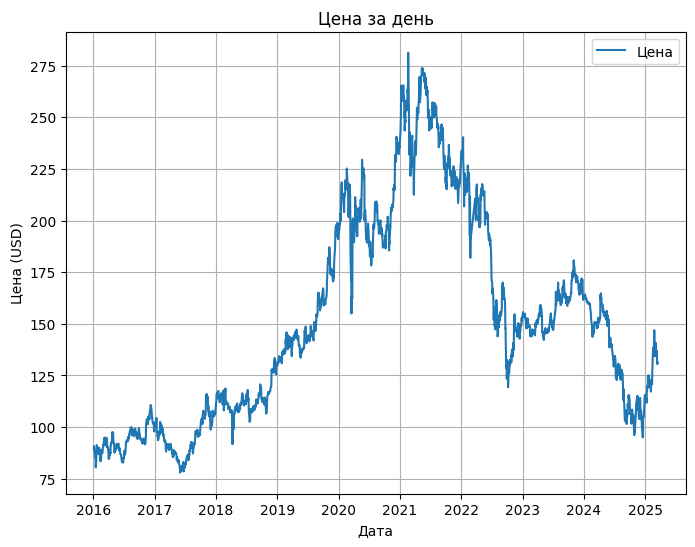

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

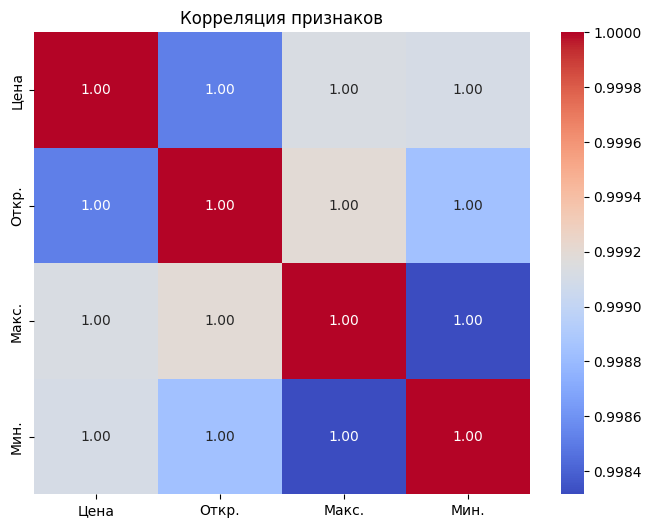

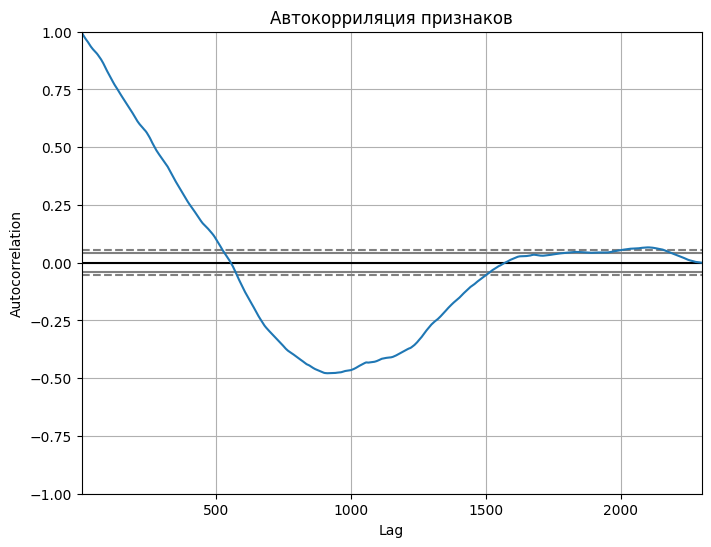

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

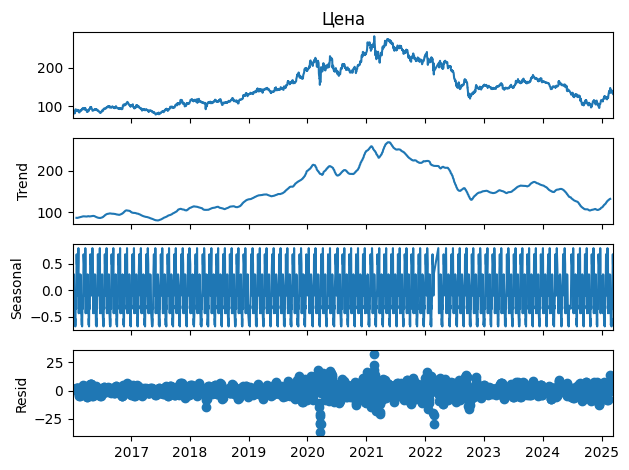

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

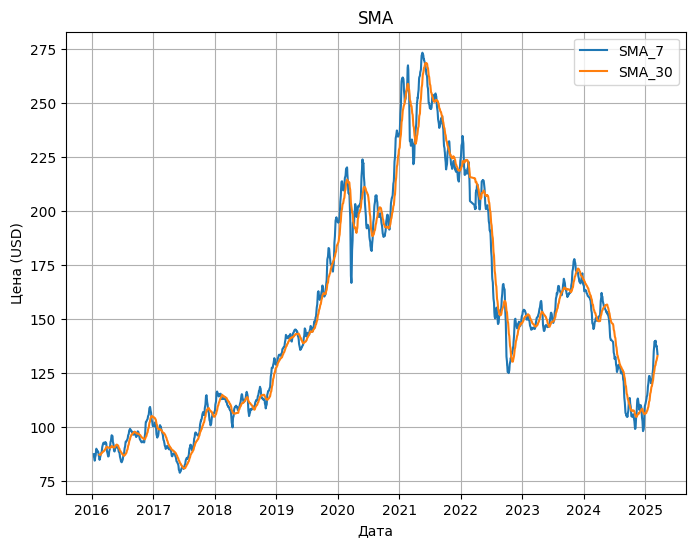

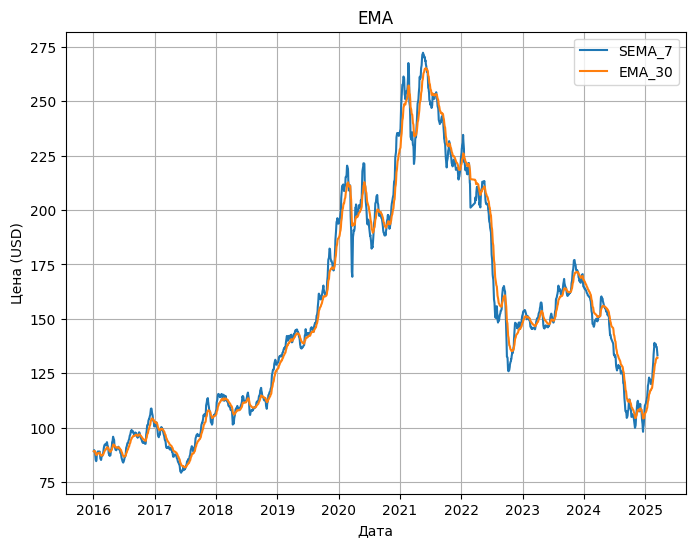

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

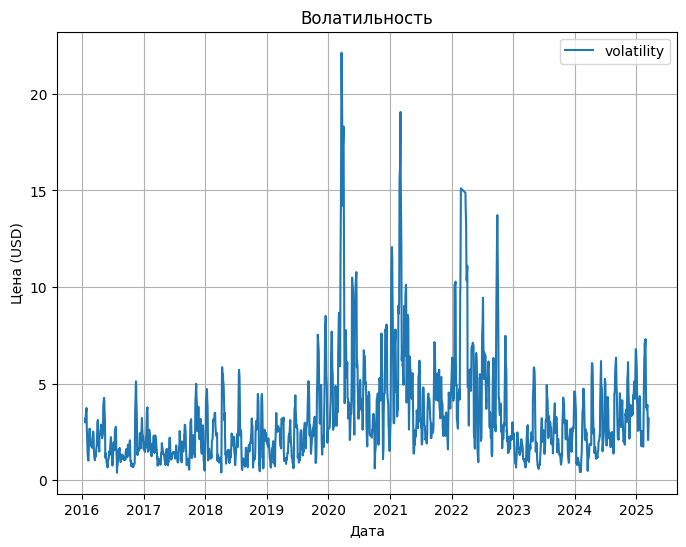

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null      float64
 4   SMA_7       0 non-null      float64
 5   SMA_30      0 non-null      float64
 6   EMA_7       0 non-null      float64
 7   EMA_30      0 non-null      float64
 8   volatility  0 non-null      float64
 9   Z-score     0 non-null      float64
dtypes: float64(10)
memory usage: 0.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null    

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

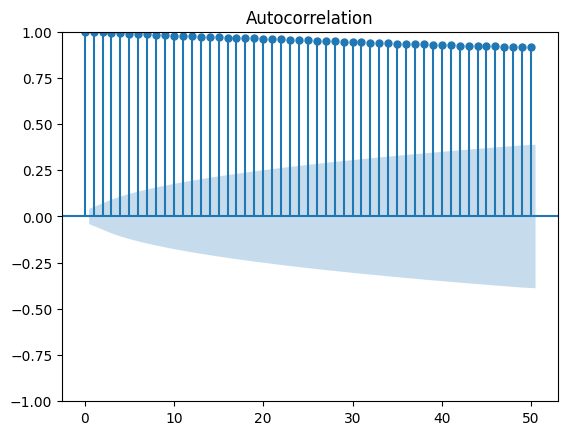

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

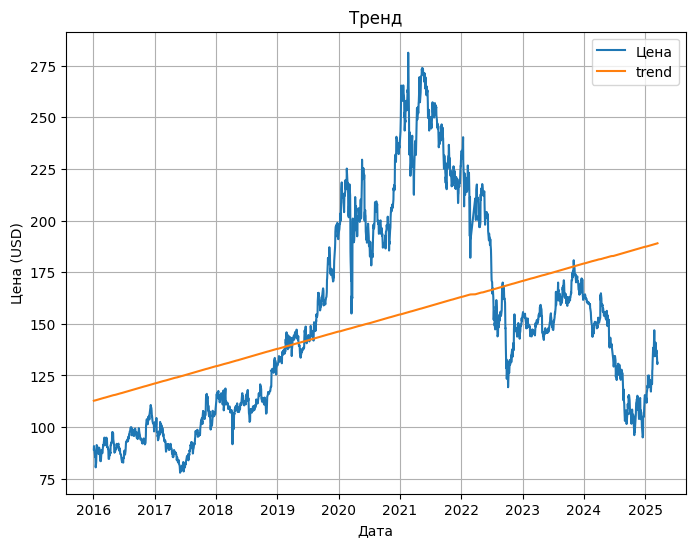

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.45460
❌ Ряд НЕ стационарный (p >= 0.05)


In [27]:
crate_base_research_data('share_metal_GMKN', share_metal_GMKN) 

## 📊 Исследование временного ряда: стоимости акций GMKN

### 1. Общая динамика 📈

до 2022 года виден стаблильный и постоянный рост акций компаний, но после появился абсолютно обратный тренд развития стоимости

---

### 2. Автокорреляция признаков 🔁

Начальные лага показывают сильную положительную автокорреляцию. Затем автокорреляция убывает и переходит в отрицательные значения, но сохраняет периодический характер. Явные признаки сезонности и тренда, что согласуется с результатами декомпозиции.

---

### 3. Декомпозиция временного ряда 🧩

График декомпозиции показывает:
- **Тренд**: наблюдается длительный восходящий тренд с 2016 по 2021 год, затем — резкое снижение до конца 2022 и последующая боковая динамика.
- **Сезонность** : отчетливая регулярная сезонность с коротким циклом, вероятно дневного или недельного масштаба.
- **Остаток (Resid)**: в 2020 и 2022 годах наблюдаются сильные всплески остаточной компоненты, указывающие на резкие изменения.

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены два типа скользящих средних:

- SMA — простое скользящее среднее за 7 и 30 дней
- EMA — экспоненциальное среднее с той же длиной окна

В периоды роста 2019–2021 и падения после 2022 кривые сильно расходятся, что может сигнализировать о волатильных изменениях.

---

### 5. Волатильность (шумность ряда) 🌪

- Основные всплески волатильности приходятся на 2020–2021 годы — время значительного роста и пика цен.
- После 2022 года волатильность снижается, но остаётся нестабильной

---

### 6. Аномалии (Z-score & IQR) ⚠️

Аномальных и вбросовых данных не обраужено

---

### 7. Сезонность ACF 🔁

- ACF показывает высокую автокорреляцию даже на больших лагах, что свидетельствует о наличии долгосрочной зависимости.
- Это подтверждает наличие сезонности и нестационарности в ряде.

---

### 8. Линейный тренд 📈

В данном случае линейный тренд всё таки показывает динамику росста, ввиду то го что по временной линии рост цен ещё занимает большее кол-ва места, чем её поадение

---

### 9. ADF-тест на стационарность 📉
- **p-значение = 0.45460**
- ❌ Ряд НЕ является стационарным (p >= 0.05)

---

### 🧾 Вывод

Нестационарность ряда подтверждается ADF-тестом, что означает нестабильные средние и дисперсии во времени. Это затрудняет моделирование без предварительного преобразования ряда.Ярко выраженный тренд: с 2016 по 2021 год наблюдался устойчивый рост цен, который сменился резким спадом после 2022 года и последующей консолидацией (боковым движением).Сезонность хорошо выражена, подтверждена декомпозицией и автокорреляцией. Это указывает на повторяющиеся паттерны, возможно, связанные с рыночными циклами.Скользящие средние (SMA и EMA) эффективно отображают изменение трендов и помогают визуализировать фазы роста и падения. В периоды высокой динамики наблюдаются расхождения между SMA_7 и SMA_30, что говорит о росте волатильности.
Волатильность особенно усилилась в 2020–2021 годах на фоне рыночного роста и нестабильности. В дальнейшем волатильность снизилась, но полностью не исчезла.Линейный тренд показывает общий рост, несмотря на падение после 2022 года — это объясняется тем, что более длинный период роста оказывает большее влияние на регрессию.



<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: share_oil_gaz_NVTK</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2304.000000  2304.000000  2304.000000  2304.000000
mean   1090.358767  1090.784983  1105.069618  1074.369748
std     331.602744   332.180764   336.386245   326.927212
min     543.700000   540.100000   555.600000   535.100000
25%     769.375000   768.000000   777.975000   757.775000
50%    1078.000000  1077.600000  1092.000000  1060.800000
75%    1310.350000  1312.250000  1325.400000  1295.850000
max    1993.000000  1996.000000  2025.800000  1946.000000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

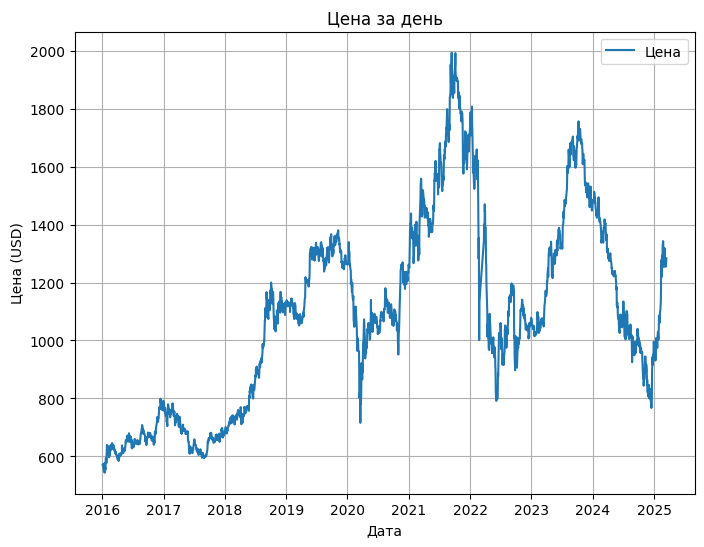

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

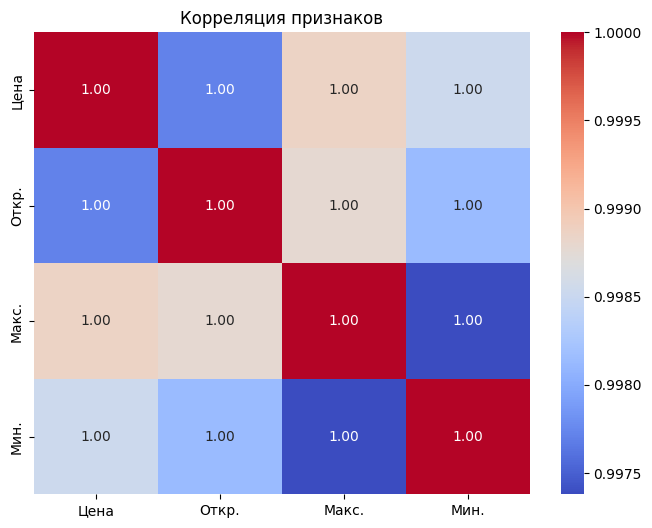

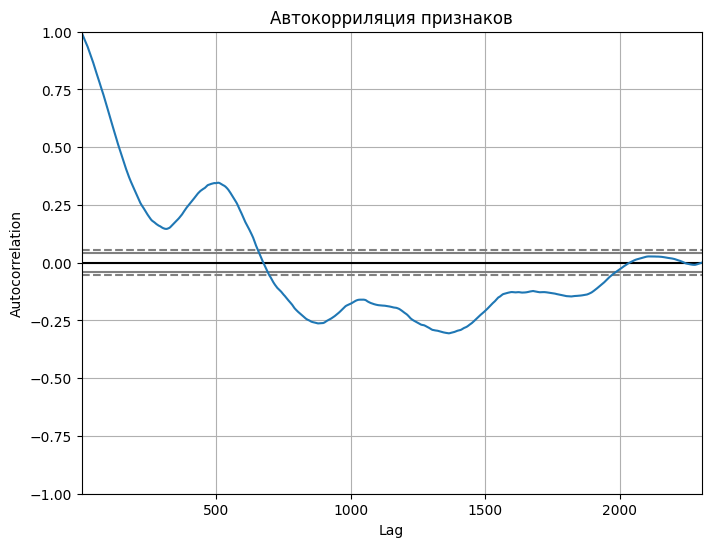

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

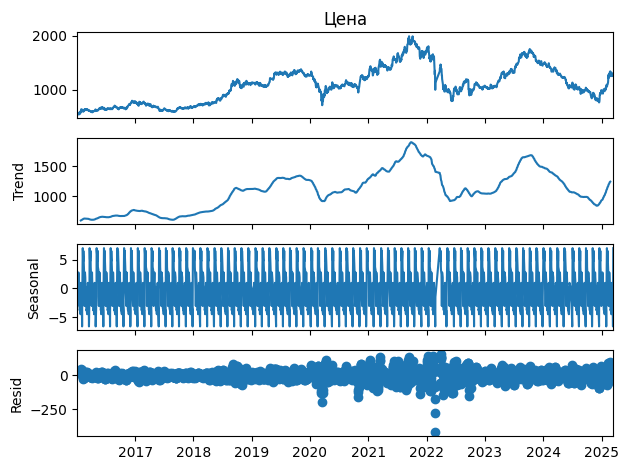

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

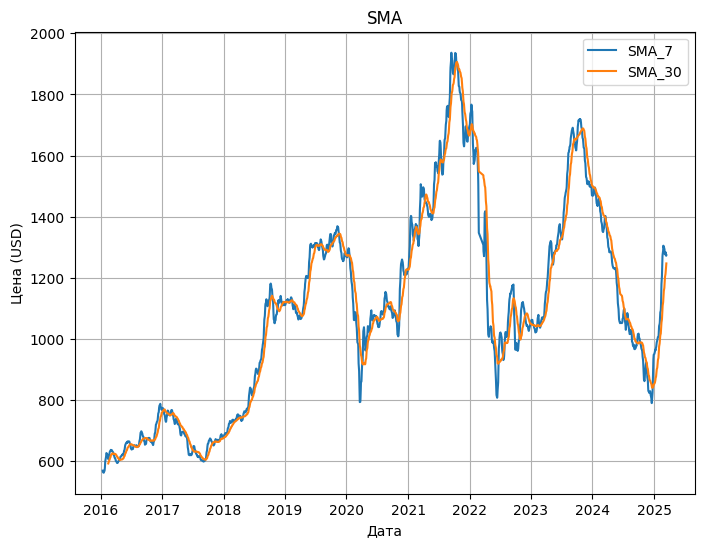

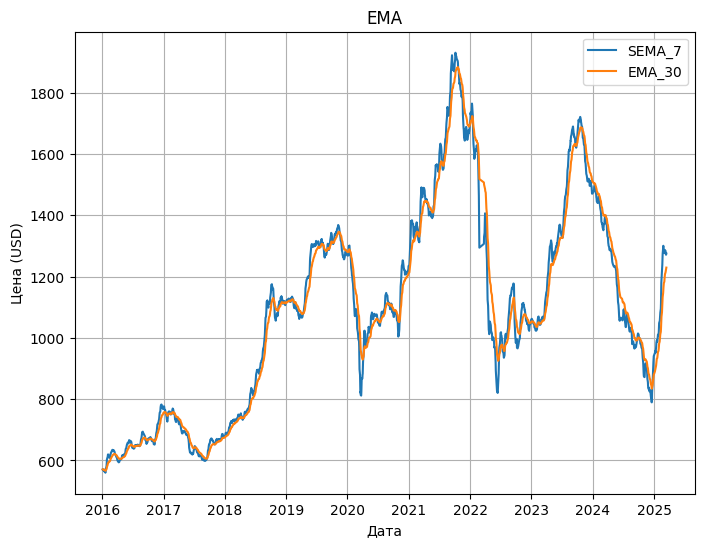

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

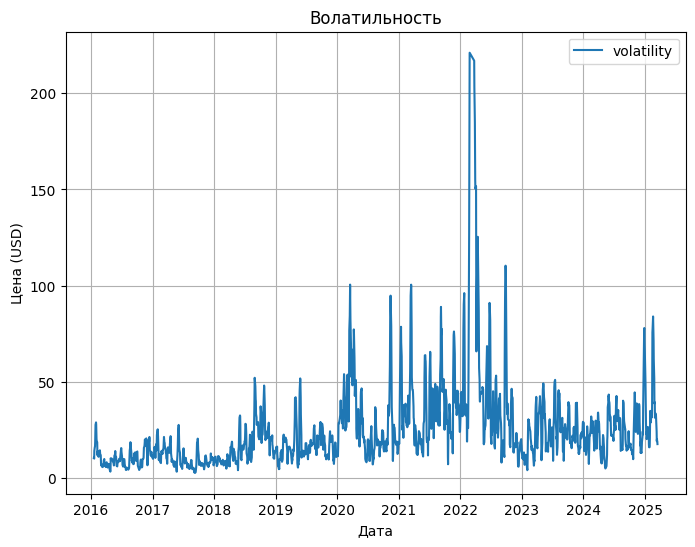

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null      float64
 4   SMA_7       0 non-null      float64
 5   SMA_30      0 non-null      float64
 6   EMA_7       0 non-null      float64
 7   EMA_30      0 non-null      float64
 8   volatility  0 non-null      float64
 9   Z-score     0 non-null      float64
dtypes: float64(10)
memory usage: 0.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null    

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

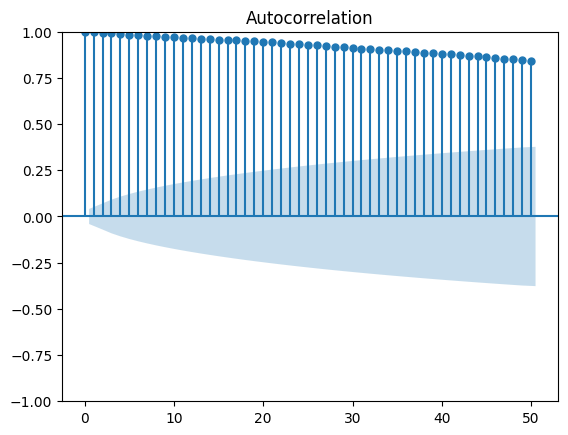

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

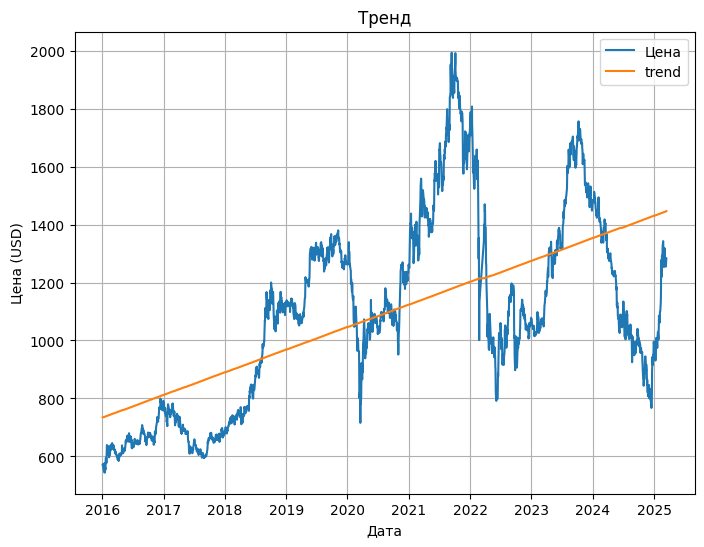

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.30890
❌ Ряд НЕ стационарный (p >= 0.05)


In [28]:
crate_base_research_data('share_oil_gaz_NVTK', share_oil_gaz_NVTK) 

## 📊 Исследование временного ряда: стоимости акций компании NVTK

### 1. Общая динамика 📈

На графике видны большие пики роста цен, видно что цены на акции растут сильными скачками.

---

### 2. Автокорреляция признаков 🔁

На графике автокорреляции наблюдается высокая положительная автокорреляция на малых лагах, которая постепенно убывает и переходит в отрицательную область, что говорит о наличии сезонности и трендов. Автокорреляция сохраняется на длительных лагах, что указывает на долгосрочную зависимость.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента:
- **Тренд**:  Явно выраженный восходящий тренд до начала 2022 года, далее наблюдается снижение.
- **Сезонность**: Сезонность выражена — колебания имеют регулярную структуру.
- **Resid**: Остатки указывают на выбросы, особенно в начале 2022 года — возможно, это реакция на внешние экономические или политические события.

---

### 4. Скользящее среднее (SMA и EMA)📊
На графиках представлены два типа скользящих средних:

- SMA — простое скользящее среднее за 7 и 30 дней
- EMA — экспоненциальное среднее с той же длиной окна

График скользящих близко потворяет реальную структуру цен, что говорит о малом кол-ве шумовых данных и о стабильной волатильности

---

### 5. Волатильность (шумность ряда) 🌪

Волатильность низкая до 2020 года, затем возрастающая нестабильность, с пиком в 2022 году. В целом динамика волатильности за исключением пика - стабильна

---

### 6. Аномалии (Z-score & IQR) ⚠️

Аномальные и вбросовые данные отсутствуют

---

### 7. Сезонность ACF 🔁

ACF график демонстрирует длительную автокорреляцию.Почти все лаги значительно выше доверительного интервала — это подтверждает наличие сезонных колебаний.

---

### 8. Линейный тренд 📈

Линейная регрессия показывает общий восходящий тренд, несмотря на резкие колебания.

---

### 9. ADF-тест на стационарность 📉

Результаты теста Дики-Фуллера:

- **p-значение = 0.30890**
- ❌ Ряд **НЕ является стационарным** (p >= 0.05)

---

### 🧾 Вывод

Ряд является нестационарным. Цены акций демонстрируют сильные скачкообразные изменения, особенно в 2020–2022 годах, что сопровождается увеличением волатильности. Долгосрочная автокорреляция и выраженная сезонность указывают на наличие устойчивых повторяющихся паттернов. Скользящие средние (SMA и EMA) эффективно сглаживают ряд и подтверждают трендовые участки. Пик волатильности и остаточные выбросы в 2022 году, вероятно, связаны с внешними шоками, влияющими на рынок. В целом, акции компании демонстрируют трендовое поведение с периодическими всплесками волатильности и выраженной сезонностью.


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: share_oil_gaz_GAZ</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2318.000000  2318.000000  2318.000000  2318.000000
mean    181.021035   181.088978   183.234331   178.660569
std      56.843382    56.915908    57.894789    55.692873
min     107.160000   107.160000   108.570000   105.220000
25%     140.522500   140.500000   141.835000   139.132500
50%     163.000000   163.005000   164.415000   161.655000
75%     207.950000   208.007500   211.985000   201.900000
max     389.820000   395.000000   397.640000   378.020000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

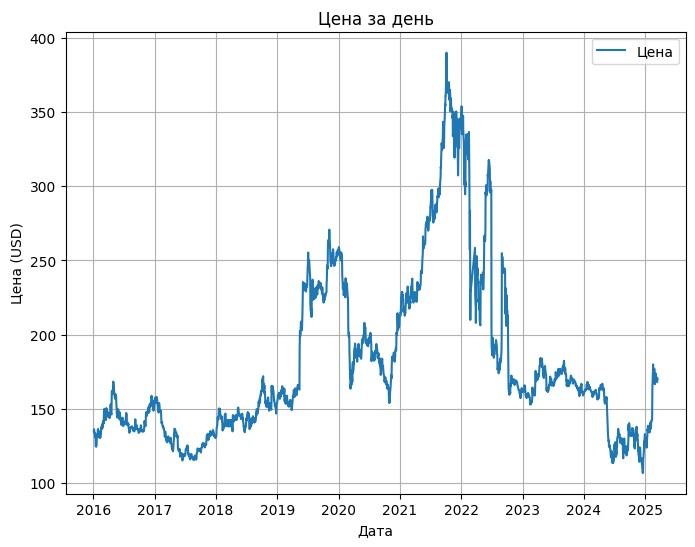

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

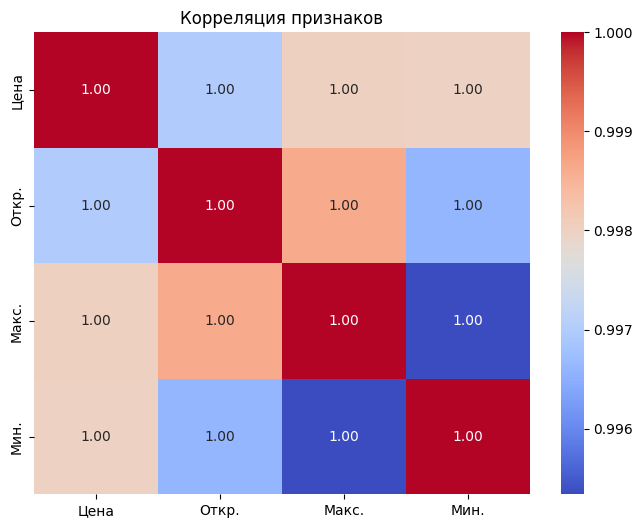

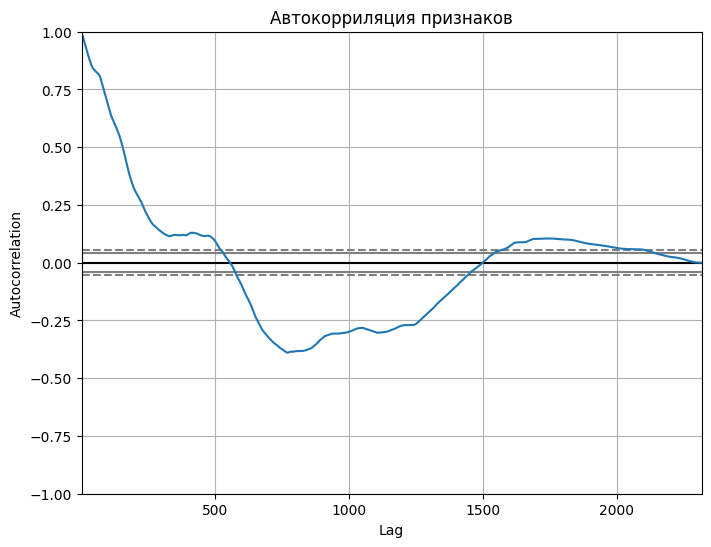

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

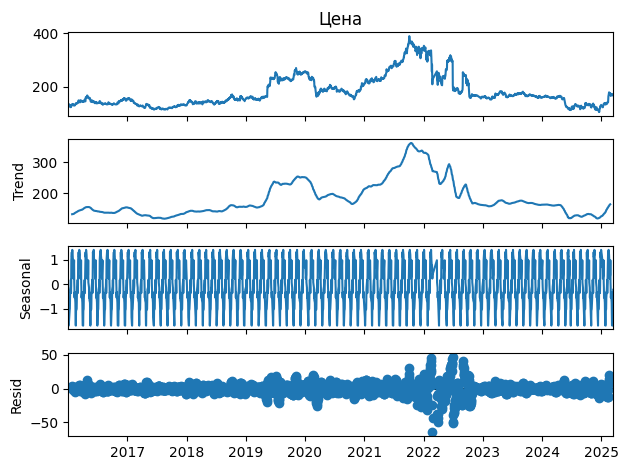

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

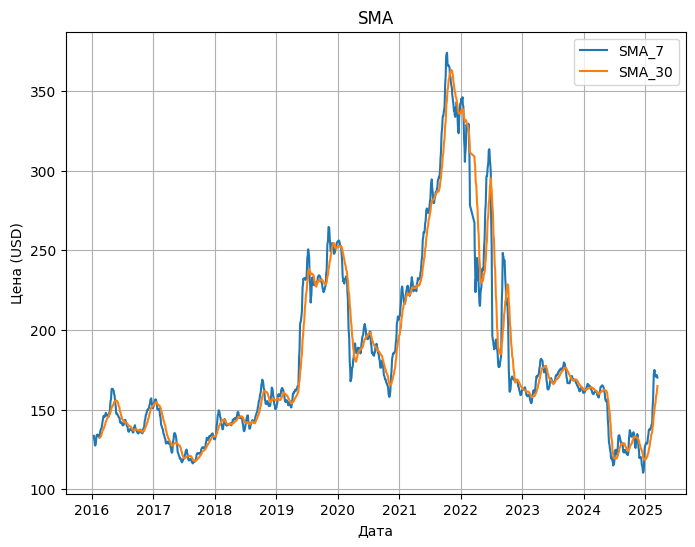

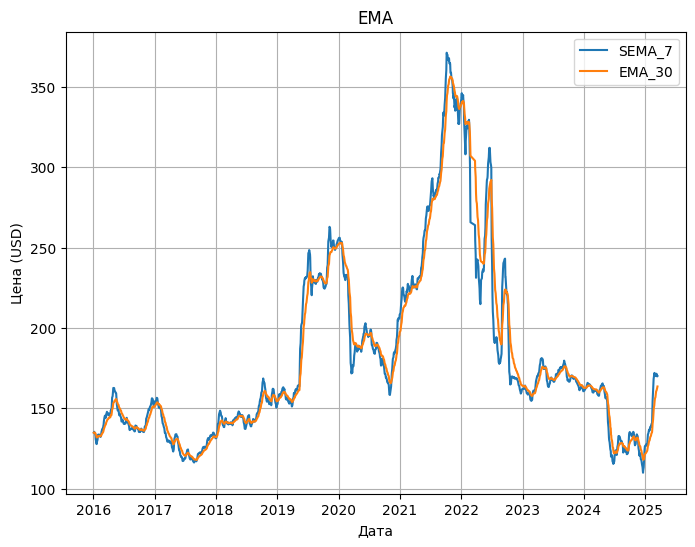

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

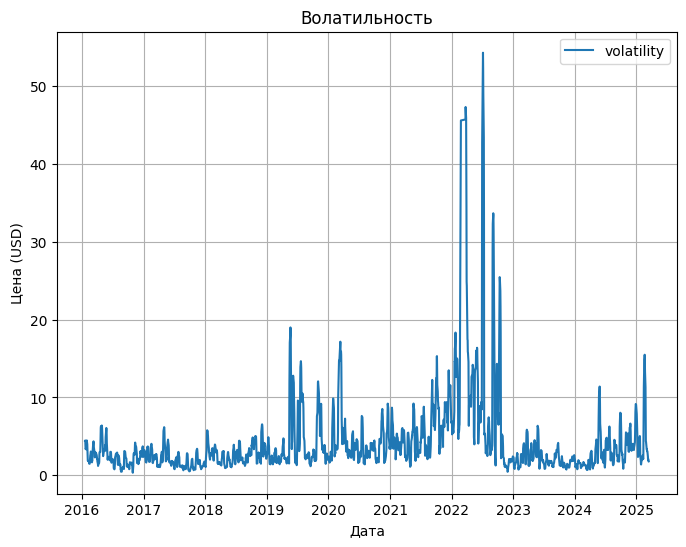

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29 entries, 2021-09-27 to 2022-01-04
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        29 non-null     float64
 1   Откр.       29 non-null     float64
 2   Макс.       29 non-null     float64
 3   Мин.        29 non-null     float64
 4   SMA_7       29 non-null     float64
 5   SMA_30      29 non-null     float64
 6   EMA_7       29 non-null     float64
 7   EMA_30      29 non-null     float64
 8   volatility  29 non-null     float64
 9   Z-score     29 non-null     float64
dtypes: float64(10)
memory usage: 2.5 KB
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 121 entries, 2021-09-01 to 2022-06-20
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        121 non-null    float64
 1   Откр.       121 non-null    float64
 2   Макс.       121

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

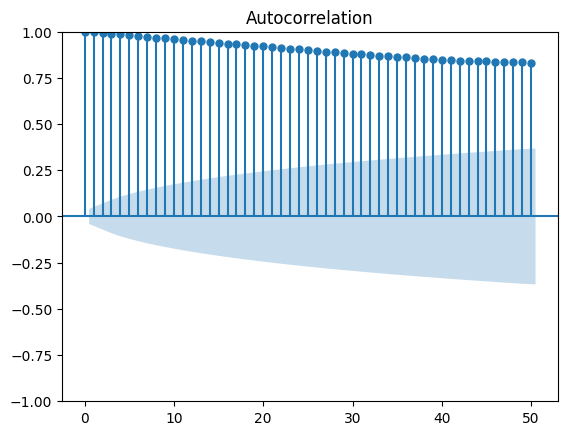

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

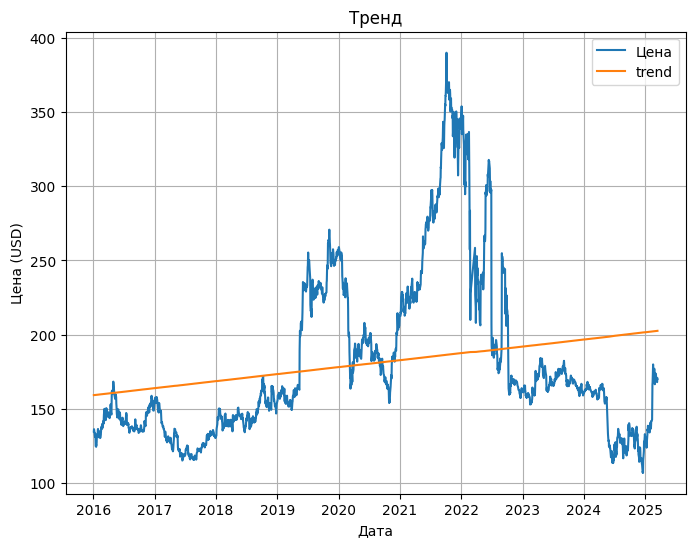

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.22040
❌ Ряд НЕ стационарный (p >= 0.05)


In [29]:
crate_base_research_data('share_oil_gaz_GAZ', share_oil_gaz_GAZP) 

## 📊 Исследование временного ряда: стоимости акций компании  GAZ

### 1. Общая динамика 📈

В графике цен явно присутствует 2 аномальных годовых скачка, в целом которые явно трудно соотносимы с динамикой с 2016 по 2019 и с 2023 по 2025 годы.

---

### 2. Автокорреляция признаков 🔁

Автокорреляционная функция (ACF) показывает высокую положительную автокорреляцию на малых лагах, что говорит о сильной зависимости текущих значений от предыдущих. Также присутствуют колебания в отрицательную стороны на лагах с 550 по 1400, указывающие на сезонную природу ряда.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента:
- **Trend**: выраженный рост с 2019 по 2022 год, затем сильное снижение.
- **Seasonal**: отчетливая сезонность, выраженная в регулярных колебаниях.
- **Resid**: остатки показывают значительные выбросы и шум, особенно в районе 2022 года.

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены два типа скользящих средних:

- SMA — простое скользящее среднее за 7 и 30 дней
- EMA — экспоненциальное среднее с той же длиной окна

Скользящие среднии отчетлево сглаживают пиковые цены по дням, что может говорить о скачкообразной волатильности.

--- 

### 5. Волатильность (шумность ряда) 🌪

Волатильность заметно возрастает в периоде 2021–2022 гг., что соответствует резкому росту и последующему падению цен.

---

### 6. Аномалии (Z-score & IQR) ⚠️

Выбросы зафиксированы в 2021–2022 гг. — период резких рыночных движений.
- **Z-score** показывает высокие значения вблизи пиков цен и резких падений.
- **IQR** также фиксирует аномалии в эти периоды, подтверждая нестабильность.

---

### 7. Сезонность ACF 🔁

ACF график подтверждает регулярную сезонность: автокорреляция долго сохраняется высокой.Это свидетельствует о наличии повторяющихся паттернов в движении цен.

---

### 8. Линейный тренд 📈

Линейный тренд положительный, но не отражает нестабильности и спада последних лет. Несмотря на рост до 2022 года, последние годы демонстрируют нисходящую динамику.

---

### 9. ADF-тест на стационарность 📉

- **p-значение: 0.22040**
- ряд **не является стационарным** (p > 0.05).

---

### 🧾 Выводы:

Ряд нестационарный**, и имеет выраженные тренды и сезонность. Период 2021–2022 годов характеризуется резкими скачками и падениями, что сопровождается пиками волатильности и большим количеством выбросов. Скользящие средние (SMA, EMA) эффективно сглаживают цену, подчёркивая нестабильные участки — особенно в аномальных зонах. Автокорреляция сохраняется на больших лагах, подтверждая наличие долгосрочной зависимости и цикличности.
Декомпозиция ряда показала чёткую сезонность и сильное влияние внешних факторов на структуру остаточной компоненты.

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: spot_preciouse_metal_XPT</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2388.000000  2388.000000  2388.000000  2388.000000
mean    946.928643   950.407048   963.593497   937.306662
std      93.659998    93.832129    95.147496    92.378123
min     586.510000   591.020000   640.540000   562.250000
25%     893.655000   896.487500   908.895000   885.687500
50%     941.515000   944.480000   957.340000   932.250000
75%     993.772500   996.987500  1009.900000   982.362500
max    1302.790000  1306.000000  1341.000000  1263.150000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

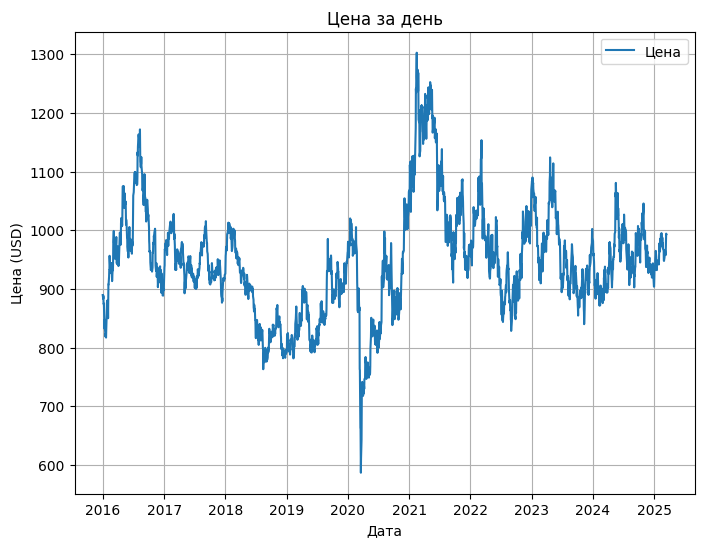

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

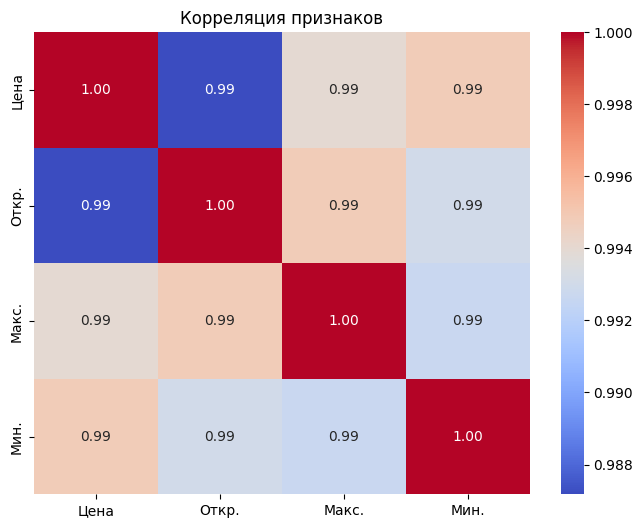

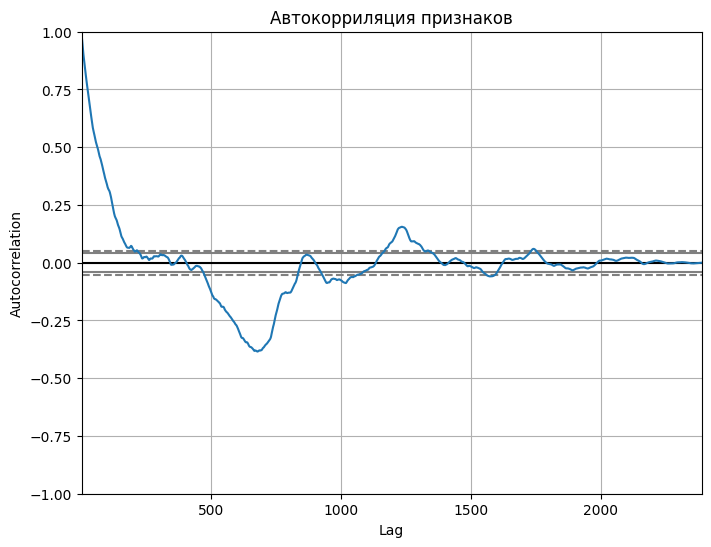

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

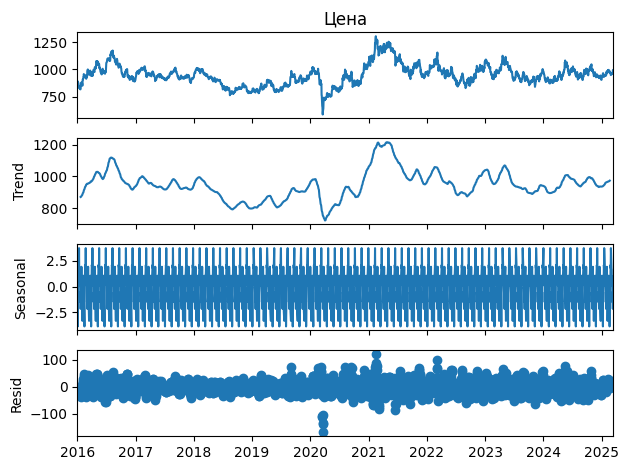

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

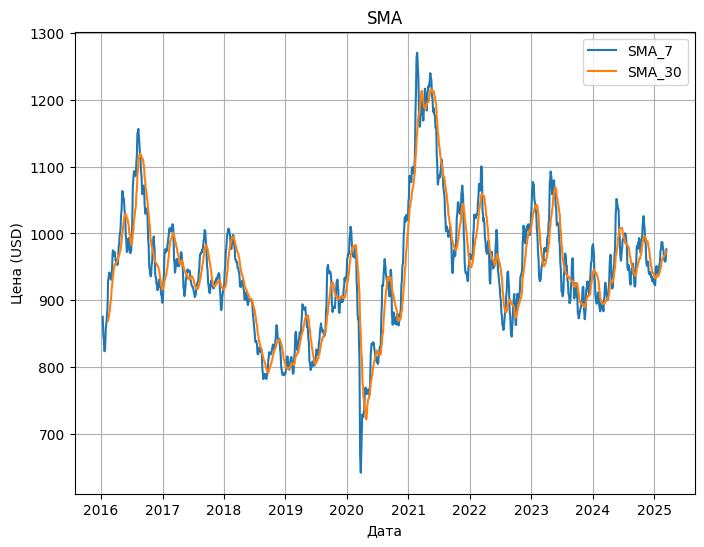

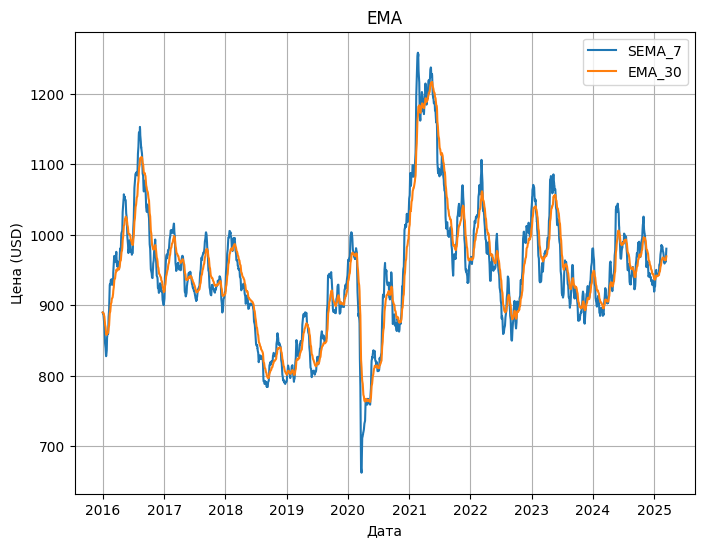

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

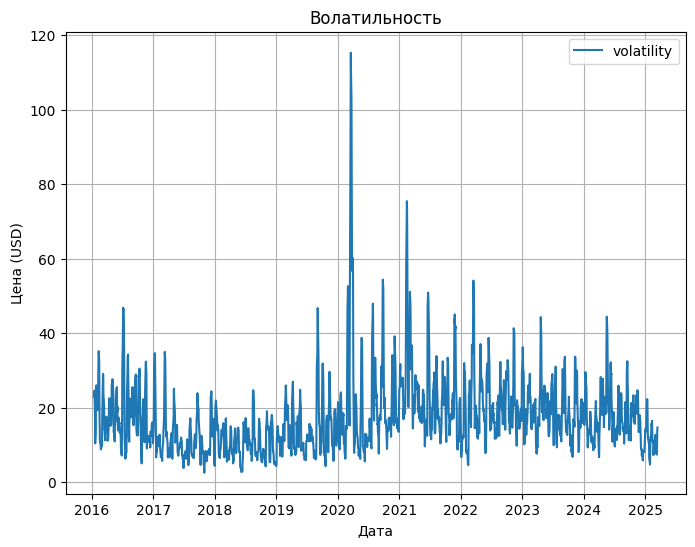

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29 entries, 2020-03-16 to 2021-05-17
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        29 non-null     float64
 1   Откр.       29 non-null     float64
 2   Макс.       29 non-null     float64
 3   Мин.        29 non-null     float64
 4   SMA_7       29 non-null     float64
 5   SMA_30      29 non-null     float64
 6   EMA_7       29 non-null     float64
 7   EMA_30      29 non-null     float64
 8   volatility  29 non-null     float64
 9   Z-score     29 non-null     float64
dtypes: float64(10)
memory usage: 2.5 KB
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 115 entries, 2016-08-01 to 2022-03-08
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        115 non-null    float64
 1   Откр.       115 non-null    float64
 2   Макс.       115

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

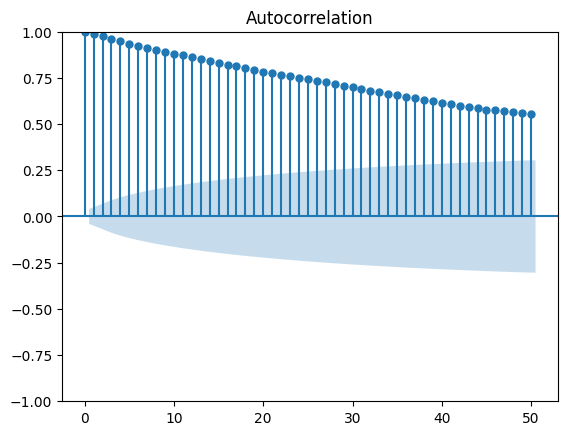

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

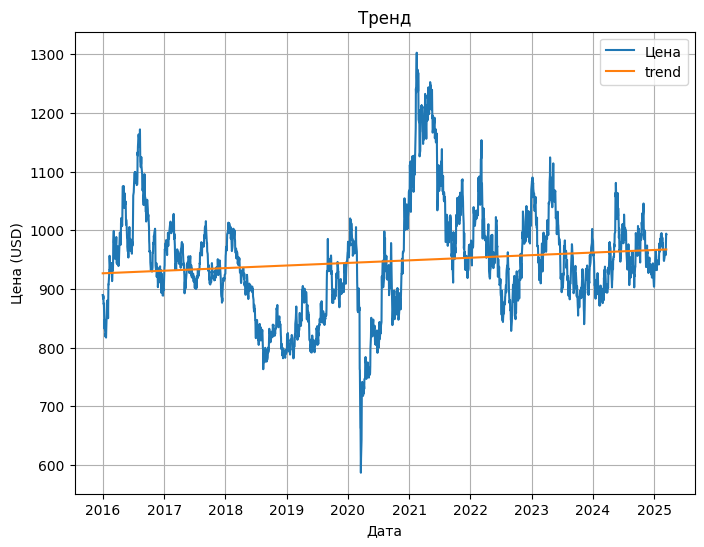

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.00176
✅ Ряд стационарный (p < 0.05)


In [30]:
crate_base_research_data('spot_preciouse_metal_XPT', spot_preciouse_metal_XPT) 

## 📊 Исследование временного ряда: спотовая стоимость платины

### 1. Общая динамика 📈

На текущий момент видно что за 7 лет спотовая стоимость данного метталла подверглась заметным колебаниям, но по итогу вернулась в изначальные цены 2016 года.

### 2. Автокорреляция признаков 🔁

График автокорреляции показывает значительную автозависимость во временном ряду, особенно на начальных лагах. В остальноми корреляция сразу затухает после 100-150 лагов.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента:

- **Trend (тренд)**: с 2016 года наблюдается рост цены до 2021 года с последующим снижением. В последние периоды структура становится более стабильной.
- **Seasonal (сезонность)**: наблюдаются устойчивые сезонные колебания.
- **Residual (остатки)**: в районе 2020–2021 года увеличилась дисперсия, что может быть связано с рыночной турбулентностью.

---

### 4. Скользящее среднее (SMA и EMA)📊

На графиках представлены два типа скользящих средних:

- SMA — простое скользящее среднее за 7 и 30 дней
- EMA — экспоненциальное среднее с той же длиной окна

Скользящие кривые явно обрезают пики цен по каждому дню, что говорит нам о наличии высокой волатильности.

---

### 5. Волатильность (шумность ряда) 🌪

Всплески волатильности приходятся на 2020–2021 годы, что может быть связано с глобальными экономическими событиями (например, пандемия). В целом, платина демонстрирует умеренный уровень волатильности.

---

### 6. Аномалии (Z-score & IQR) ⚠️

- **Z-score** выявил выбросы как в период резкого падения (март 2020), так и роста (февраль–май 2021).
- **IQR** метод также выявил выбросы на исторических пиках и минимумах цен.

---

### 7. Сезонность ACF 🔁

Значения ACF остаются высокими даже при больших лагах, подтверждая наличие сезонности и циклических компонентов в ряду.

---

### 8. Линейный тренд 📈

Линейный тренд слабо выражен, но имеет положительный наклон. Наблюдаются сильные колебания вокруг трендовой линии.

---

### 9. ADF-тест на стационарность 📉

Результаты теста Дики-Фуллера:

- **p-значение: 0.00176**
- ✅ Ряд стационарный (p < 0.05)

---

### 🧾 Вывод

Спотовая стоимость платины демонстрирует высокую волатильность цикличность, характерные для сырьевых активов. Декомпозиция показала чёткую сезонную структуру и временные периоды нестабильности, Автокорреляционный анализ подтверждает наличие краткосрочной зависимости, а также устойчивой сезонности(по ACF). Волатильность умеренная в целом, но резко возрастает в период кризисных событий.
Аномалии, выявленные через Z-score и IQR, подтверждают наличие экстремальных отклонений в периоды ценовых пиков и спадов. ADF-тест показал, что ряд является стационарным, что является положительным фактором для применения большинства методов прогнозирования.
В целом, платина как актив обладает признаками сезонной стационарности с умеренной волатильностью, и может быть объектом анализа и моделирования без необходимости приведения ряда к стационарному виду.



<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: spot_preciouse_metal_AU</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2394.000000  2394.000000  2394.000000  2394.000000
mean   1677.948521  1677.425677  1688.832339  1666.716997
std     415.452192   414.946383   418.625368   411.638646
min    1060.740000  1061.210000  1061.410000  1060.740000
25%    1290.730000  1290.352500  1296.062500  1283.497500
50%    1716.020000  1716.000000  1728.610000  1704.405000
75%    1910.680000  1911.027500  1923.525000  1897.195000
max    2987.750000  2988.380000  3005.080000  2978.410000


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

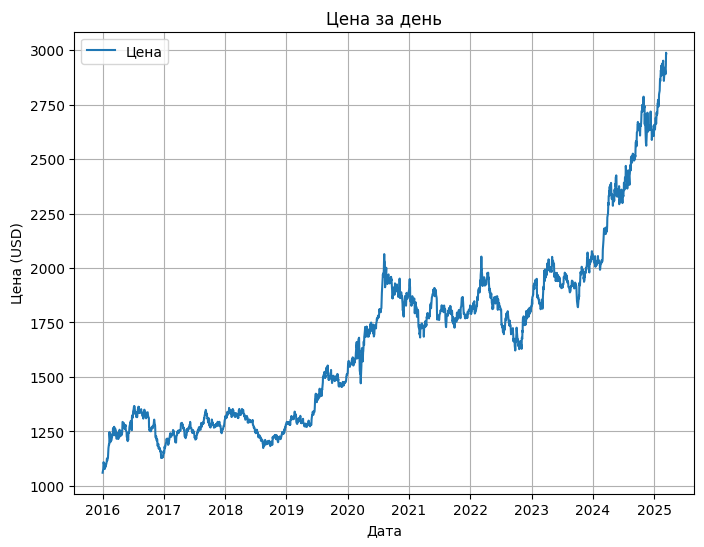

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

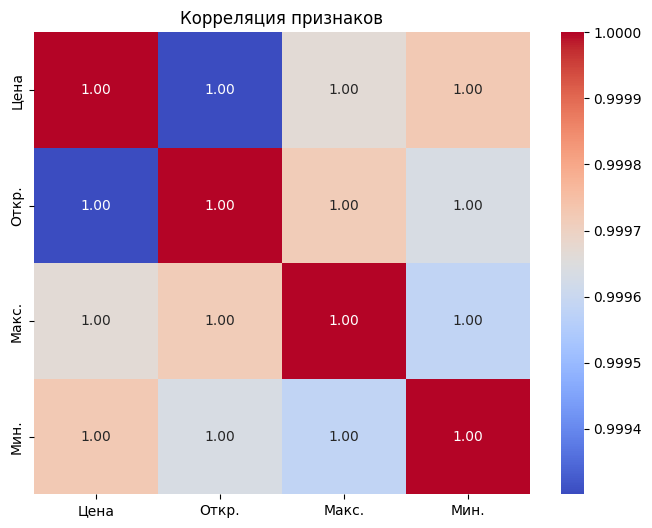

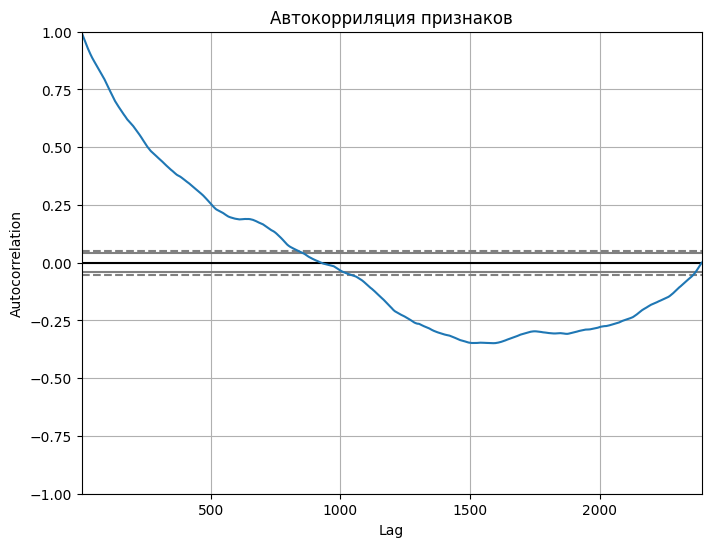

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

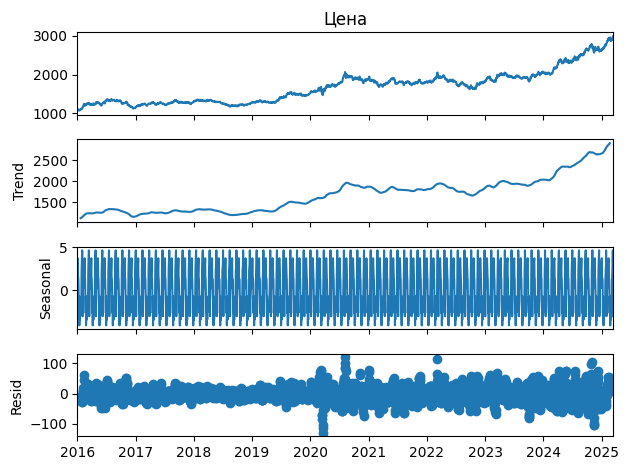

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

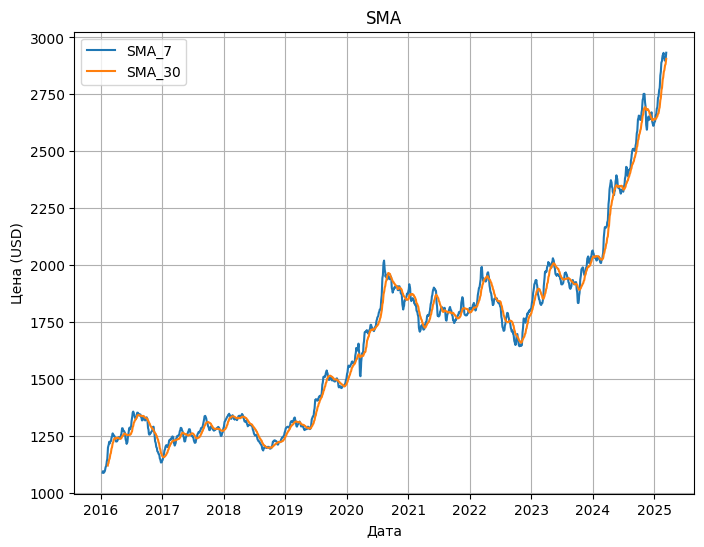

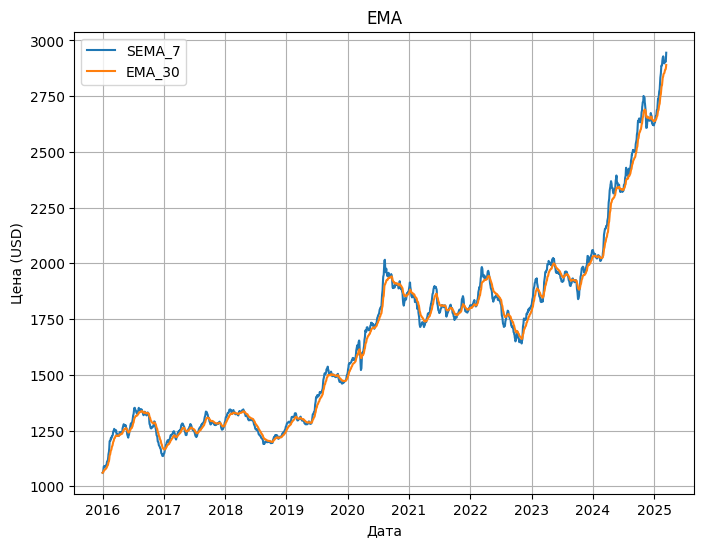

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

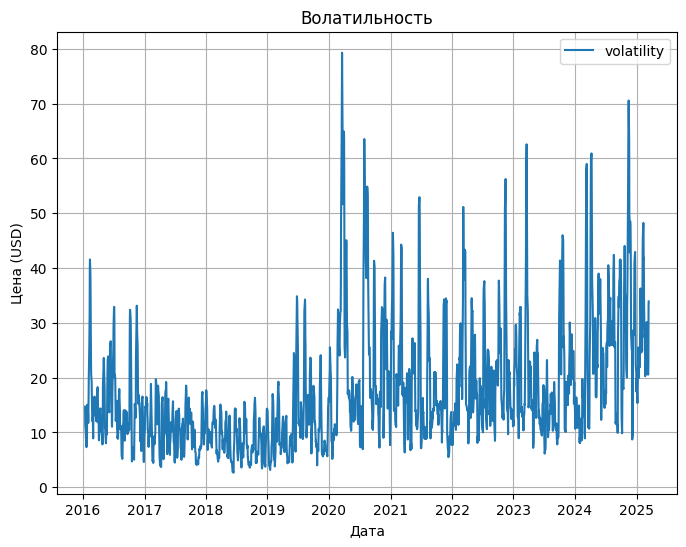

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9 entries, 2025-02-13 to 2025-03-14
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        9 non-null      float64
 1   Откр.       9 non-null      float64
 2   Макс.       9 non-null      float64
 3   Мин.        9 non-null      float64
 4   SMA_7       9 non-null      float64
 5   SMA_30      9 non-null      float64
 6   EMA_7       9 non-null      float64
 7   EMA_30      9 non-null      float64
 8   volatility  9 non-null      float64
 9   Z-score     9 non-null      float64
dtypes: float64(10)
memory usage: 792.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29 entries, 2025-02-04 to 2025-03-14
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        29 non-null     float64
 1   Откр.       29 non-null     float64
 2   Макс.       

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

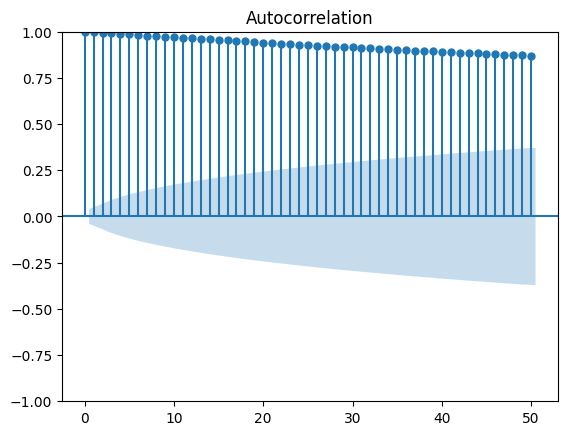

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

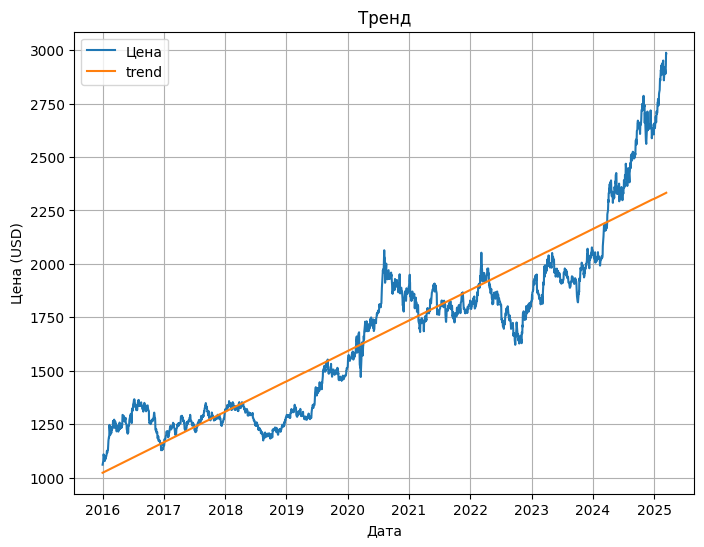

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.99585
❌ Ряд НЕ стационарный (p >= 0.05)


In [31]:
crate_base_research_data('spot_preciouse_metal_AU', spot_preciouse_metal_AU) 

## 📊 Исследование временного ряда: спотовая стоимость золота

### 1. Общая динамика 📈
На графике временного ряда наблюдается чётко выраженный восходящий тренд. С 2016 по 2025 год стоимость золота устойчиво росла, особенно начиная с 2023 года, где рост становится экспоненциальным.

---

### 2. Автокорреляция признаков 🔁

ACF показывает значимую автокорреляцию на протяжении большого кол-ва лагов. Это говорит о предсказуемости и памяти временного ряда.

---

### 3. Декомпозиция временного ряда 🧩

Ряд был разложен на 3 компонента:

- **Trend**: Подтверждает долгосрочный рост цен на золото.
- **Seasonal**: Присутствует стабильная сезонность с колебаниями.
- **Resid**: Остатки демонстрируют выбросы, особенно в последние годы.

---

### 4. Скользящее среднее (SMA и EMA)📊

Скользящие средние следуют за трендом. EMA и SMA показывают, что рост был плавным и устойчивым.

---

### 5. Волатильность (шумность ряда) 🌪

- Уровень волатильности остаётся сравнительно стабильным на фоне всех наблюдений.
- Сильных всплесков шума наблюдается часто.

---

### 6. Аномалии (Z-score & IQR) ⚠️

- Последние значения (февраль–март 2025) сильно выделяются по Z-оценке: наблюдаются положительные выбросы, соответствующие резкому росту цены.
- IQR-анализ также фиксирует эти значения как выбросы, что подтверждает экстремальность ситуации.
  
---

### 7. Сезонность ACF 🔁

Значения ACF остаются высокими даже при больших лагах, подтверждая наличие сезонности и циклических компонентов в ряду.

---

### 8. Линейный тренд 📈

Линейный тренд имеет стаблиную возрастающую динамику.

---

### 9. ADF-тест на стационарность 📉
- **p-значение: 0.99585**
- ❌ Ряд НЕ стационарный (p >= 0.05)

---

### 🧾 Вывод
Спотовая стоимость золота демонстрирует устойчивый рост с выраженным трендом, низкой волатильностью и сезонностью. Временной ряд нестационарный. Последние месяцы характеризуются аномально высоким ростом, что требует внимания и может сигнализировать о перегретости рынка или внешних макроэкономических факторах.


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Анализ датасета: spot_preciouse_metal_AG</div>

Статистика по данным:
              Цена        Откр.        Макс.         Мин.
count  2395.000000  2395.000000  2395.000000  2395.000000
mean     20.814301    20.815601    21.086875    20.539001
std       4.952535     4.949895     5.044305     4.845935
min      11.980000    11.959800    12.311000    11.640200
25%      16.647500    16.648500    16.859000    16.505000
50%      19.450000    19.426900    19.727000    19.097500
75%      24.273850    24.290000    24.594400    23.958750
max      34.830000    34.874900    34.895000    33.772200


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Временной ряд цены</div>

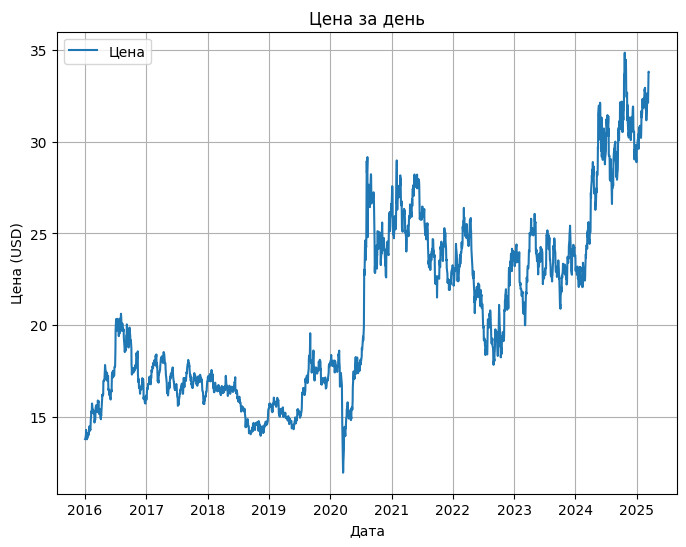

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🔁 Корреляция и автокорреляция</div>

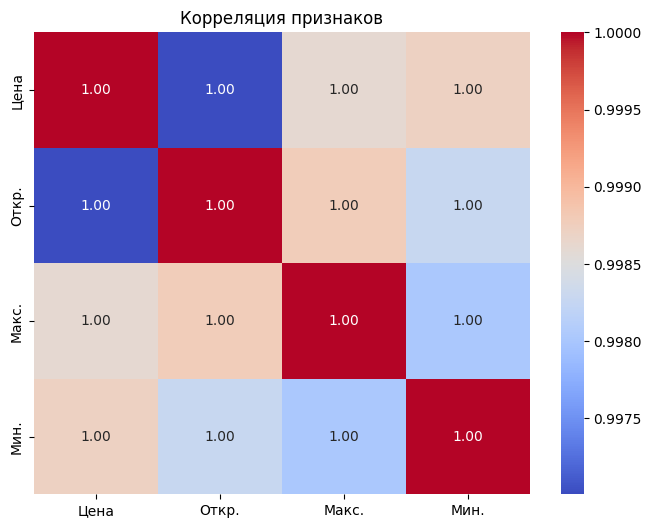

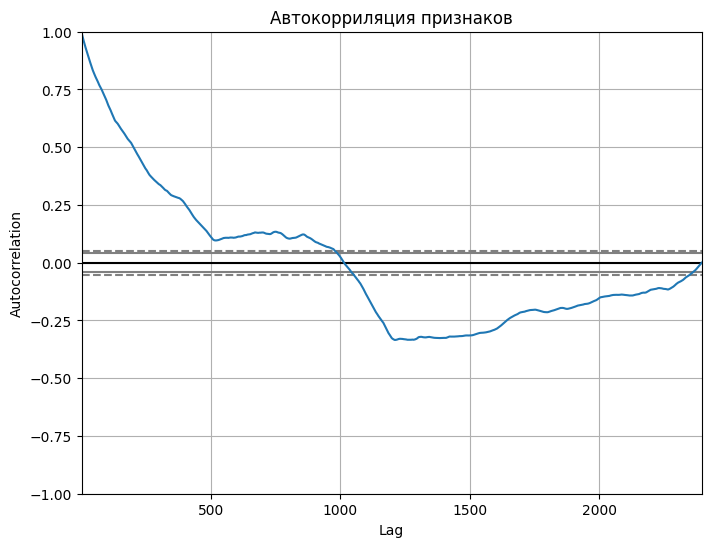

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🧩 Декомпозиция временного ряда</div>

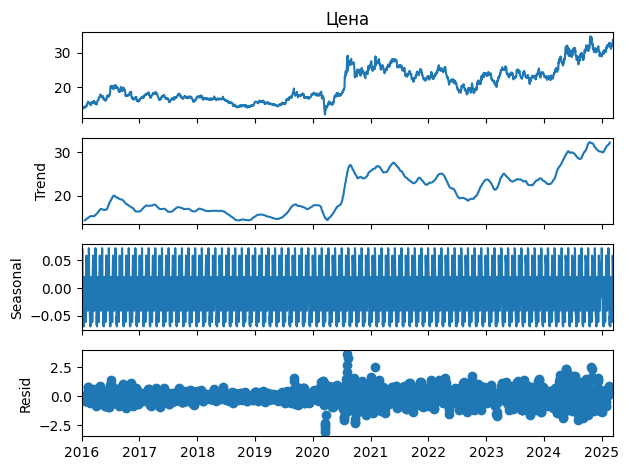

<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📉 Скользящее среднее и EMA</div>

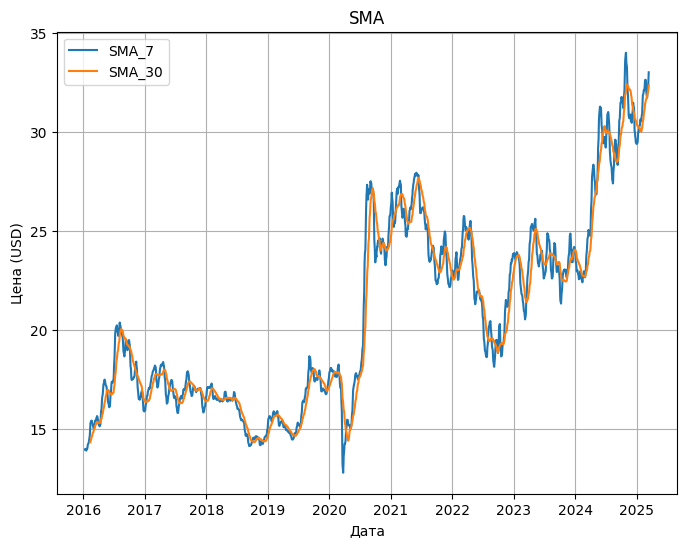

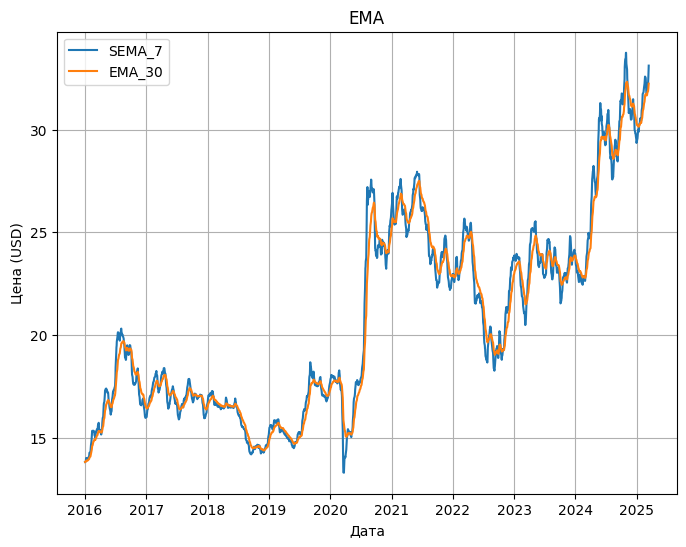

<div style='background-color:#7f7f7f;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📊 Волатильность (Шумность ряда)</div>

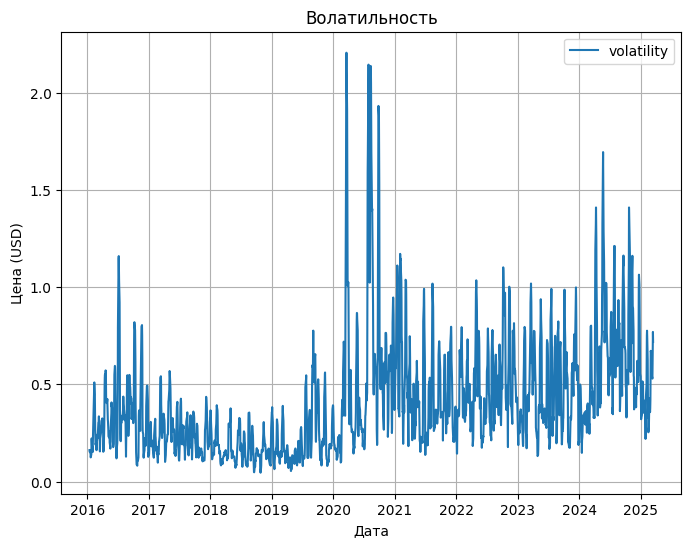

<div style='background-color:#d62728;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚨 Аномалии (Z-score & IQR)</div>

Z-score выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null      float64
 4   SMA_7       0 non-null      float64
 5   SMA_30      0 non-null      float64
 6   EMA_7       0 non-null      float64
 7   EMA_30      0 non-null      float64
 8   volatility  0 non-null      float64
 9   Z-score     0 non-null      float64
dtypes: float64(10)
memory usage: 0.0 bytes
None

IQR выбросы:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 0 entries
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Цена        0 non-null      float64
 1   Откр.       0 non-null      float64
 2   Макс.       0 non-null      float64
 3   Мин.        0 non-null    

<div style='background-color:#ff7f0e;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📅 Сезонность: ACF</div>

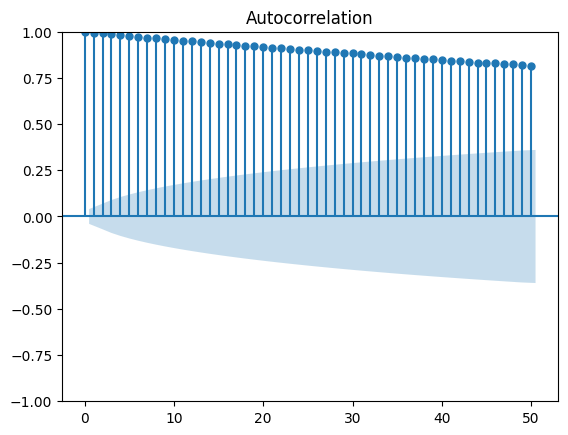

<div style='background-color:#9467bd;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📈 Линейный тренд</div>

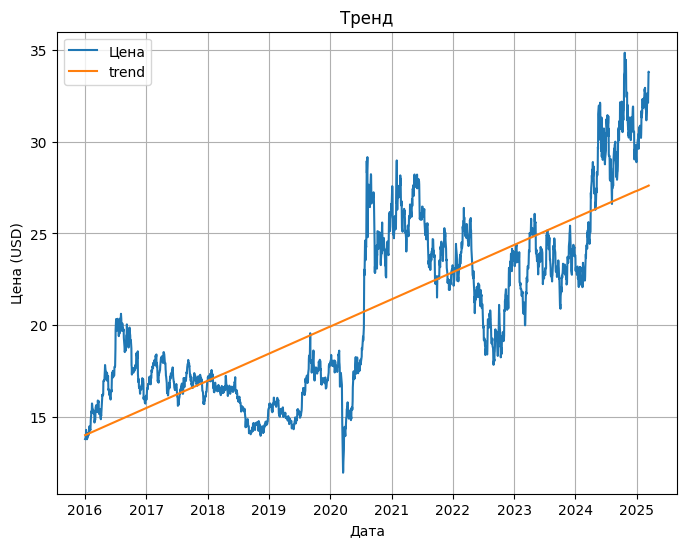

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>📏 ADF тест на стационарность</div>

p-значение: 0.77542
❌ Ряд НЕ стационарный (p >= 0.05)


In [32]:
crate_base_research_data('spot_preciouse_metal_AG', spot_preciouse_metal_AG) 

## 📊 Исследование временного ряда: спотовая стоимость Серебра ПЕРЕДЕЛАТЬ

### 1. Общая динамика 📈

Общая динамика напомниает движение цены на золотов, но тут заметны более резкие пики падение цен.

---

### 2. Автокорреляция признаков 🔁

График показывает постепенное убывание автокорреляции с увеличением лага. Наблюдается высокая положительная автокорреляция при малых лагах, что указывает на сильную зависимость текущих значений от предыдущих. После ~1000 лага автокорреляция становится отрицательной, затем плавно возвращается к нулю.

---

### 3. Декомпозиция временного ряда 🧩

Разложение временного ряда на компоненты:

- **Trend**: отчётливо наблюдается рост стоимости с конца 2019 года, особенно активный в 2023–2025 гг.
- **Seasonal**: присутствует регулярная сезонность с очень малой амплитудой (около ±0.05), вероятно, связанная с короткими колебаниями, например, недельными.
- **Residual (Остаток)**: после 2020 года остатки стали более волатильными, в них фиксируются выбросы (например, резкие падения и рост стоимости).

---

### 4. Скользящие средние (SMA и EMA) 📊

- **SMA (7 и 30 дней)**: простое сглаживание, показывает общую тенденцию без резких колебаний.
- **EMA (7 и 30 дней)**: экспоненциальное сглаживание, реагирует быстрее на изменения цены.

Обе пары кривых хорошо следуют за основной динамикой цен. EMA более чувствительна и показывает колебания быстрее, особенно на пиках и впадинах.

---

### 5. Волатильность (шумность ряда) 🌪

Наибольшие всплески волатильности приходятся на 2020 и 2021 годы — периоды значительных ценовых изменений. После 2022 года волатильность остаётся умеренной, но растёт ближе к 2025 году.

---

### 6. Аномалии (Z-score & IQR) ⚠️

Аномалии и вбросовые значения отсутсвтуею 

---

### 6. Сезонность ACF 🔁

ACF показывает стабильную автокорреляцию на протяжении всех 50 лагов. Это свидетельствует о наличии регулярных повторяющихся закономерностей — устойчивой сезонности. Значения остаются значительно выше доверительного интервала.

---

### 8. Линейный тренд 📈

Аналогично как и с золотом, имеет высокий тренд на рост цены

---

### 9. ADF-тест на стационарность 📉

- **p-значение: 0.77542**
- ❌ Ряд НЕ стационарный (p >= 0.05)

---

### 🧾 Вывод

Присутствует устойчивая сезонность и высокая автокорреляция, особенно на коротких лагах. Волатильность возрастает в периоды бурного роста или резких рыночных изменений. Остатки указывают на наличие отдельных рыночных шоков, особенно в 2020–2021 гг. Ряд показывает признаки трендовости и сезонности, что важно учитывать при прогнозировании.


# 3. Прогнозирование с помощью классических моделей

### 🔹 Классические модели, которые будут использоваться в работе :
- **ARIMA** — классическая модель, учитывающая автокорреляции и тренды
- **Prophet** — модель от Facebook, учитывающая тренд, сезонность, праздники

## 📖 Теоретическая основа

🔹 ARIMA (AutoRegressive Integrated Moving Average)
ARIMA — это одна из самых популярных моделей временных рядов, особенно для данных без ярко выраженной сезонности. Она включает в себя три компонента:

- AR (AutoRegressive) — авторегрессия: модель использует зависимость текущего значения от предыдущих (лагов) значений ряда.
- I (Integrated) — интегрирование: используется для устранения тренда и преобразования нестационарного ряда в стационарный путём дифференцирования.
- MA (Moving Average) — скользящее среднее: учитывает зависимость текущего значения от предыдущих ошибок прогноза.

📌 Пример:
Модель ARIMA(1,1,1) означает:
- 1 лаг по авторегрессии (AR)
- 1 порядок дифференцирования (I)
- 1 лаг по скользящему среднему (MA)

🔹 Prophet (от Facebook)
Prophet — это модель временных рядов, разработанная Facebook для простого и надёжного прогнозирования. Она ориентирована на бизнес-задачи и пользовательские данные, где важны тренды, сезонности и особые события (например, праздники).

📦 Компоненты модели Prophet:

Additive model — модель складывает следующие компоненты:

- Тренд (trend) — долгосрочное направление движения (может быть линейным или логистическим).
- Сезонность (seasonality) — повторяющиеся циклы (день, неделя, год и др.).
- Праздники (holidays) — особые дни, которые могут влиять на поведение ряда.
- Регуляризация и автоматический подбор параметров
- Prophet сам выбирает наиболее подходящие параметры на основе данных.





In [33]:
def arima_learn(data_1):

    data = data_1.copy()

    # деление на train/test по оригинальным данным
    train_size = int(len(data) * 0.8)
    train_orig = data.iloc[:train_size]
    test_orig = data.iloc[train_size:]
    
    # Дифференцирование тренировочных данных (только train!)
    train = train_orig.diff().dropna()

    # обучение модели на стационарных данных
    arima_model = ARIMA(train["Цена"])
    arima_model = arima_model.fit()
    print(arima_model.summary())

    # Прогноз в "разностях"
    forecast_diff = arima_model.forecast(steps=len(test_orig))

    # Обратное дифференцирование
    last_train_value = train_orig["Цена"].iloc[-1]
    preds = forecast_diff.cumsum() + last_train_value

    # расчет RMSE на оригинальном масштабе
    rmse = np.sqrt(mean_squared_error(test_orig["Цена"], preds))

    # График
    plt.figure(figsize=(8, 6))
    plt.plot(test_orig.index, test_orig["Цена"], label="Test (original)", color="black")
    plt.plot(test_orig.index, preds, label="ARIMA Forecast", color="red")
    plt.legend()
    plt.grid()
    plt.show()


    return rmse
    


In [34]:
# Создание датасета для записи результатов обучения
all_reault = pd.DataFrame()

name_ds = []
for i, _ in all_data.items():
    name_ds.append(i)
all_reault['dataset_name'] = name_ds

# фиксация в общем датасете средней цены, для наглядности диапазона цен

mean_ds = []
for i, n in all_data.items():
    mean_ds.append(n.mean()['Цена'])
all_reault['dataset_mean_price'] = mean_ds

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 2628
Model:                          ARIMA   Log Likelihood              -14840.999
Date:                Sun, 30 Mar 2025   AIC                          29685.999
Time:                        12:15:05   BIC                          29697.747
Sample:                             0   HQIC                         29690.253
                               - 2628                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6918      1.371      0.505      0.614      -1.995       3.378
sigma2      4705.9846     36.203    129.988      0.000    4635.027    4776.942
Ljung-Box (L1) (Q):                  16.67   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


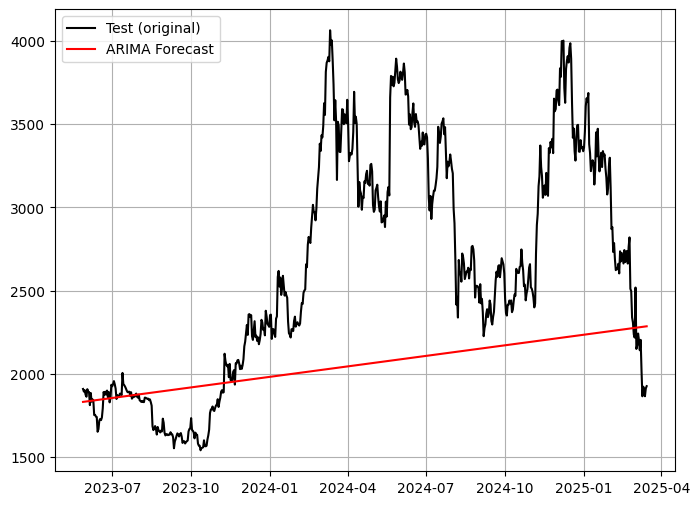

RMSE -------- 844.039192137686


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 2683
Model:                          ARIMA   Log Likelihood              -21936.339
Date:                Sun, 30 Mar 2025   AIC                          43876.678
Time:                        12:15:06   BIC                          43888.467
Sample:                             0   HQIC                         43880.943
                               - 2683                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.8781     16.659      0.593      0.553     -22.773      42.529
sigma2      7.415e+05   7275.247    101.918      0.000    7.27e+05    7.56e+05
Ljung-Box (L1) (Q):                   3.01   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


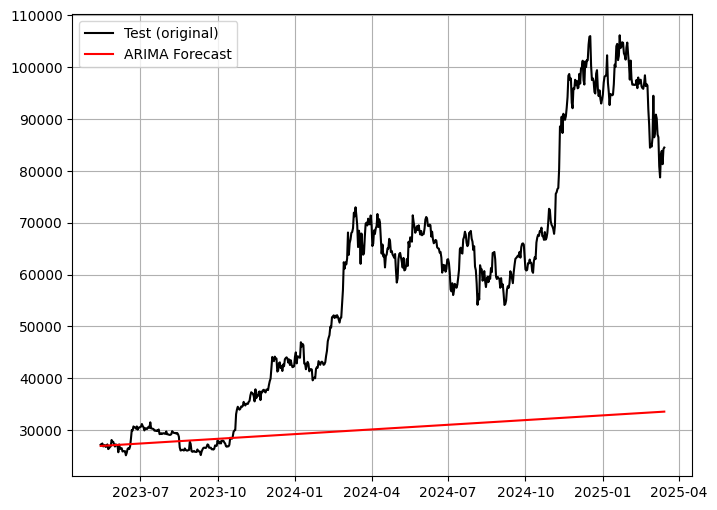

RMSE -------- 34895.018047075864


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1935
Model:                          ARIMA   Log Likelihood               -3669.408
Date:                Sun, 30 Mar 2025   AIC                           7342.816
Time:                        12:15:06   BIC                           7353.952
Sample:                             0   HQIC                          7346.912
                               - 1935                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0164      0.038      0.427      0.669      -0.059       0.092
sigma2         2.5981      0.034     75.948      0.000       2.531       2.665
Ljung-Box (L1) (Q):                   0.24   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


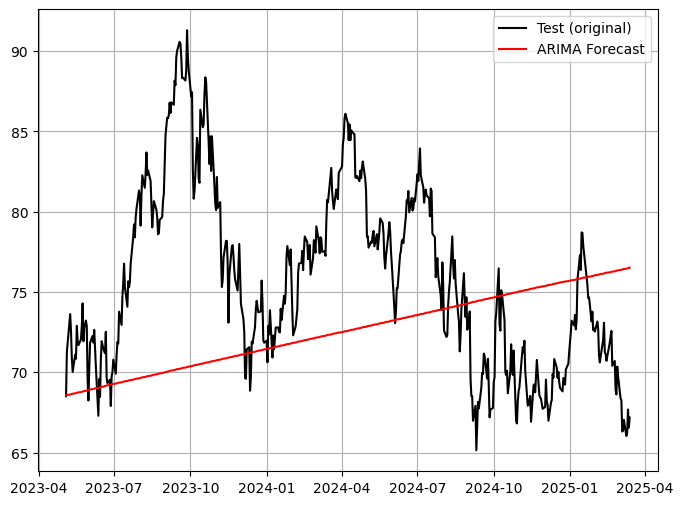

RMSE -------- 7.577570235172961


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1899
Model:                          ARIMA   Log Likelihood               -3635.809
Date:                Sun, 30 Mar 2025   AIC                           7275.617
Time:                        12:15:06   BIC                           7286.716
Sample:                             0   HQIC                          7279.703
                               - 1899                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0199      0.040      0.502      0.616      -0.058       0.098
sigma2         2.6948      0.035     76.913      0.000       2.626       2.763
Ljung-Box (L1) (Q):                   0.25   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


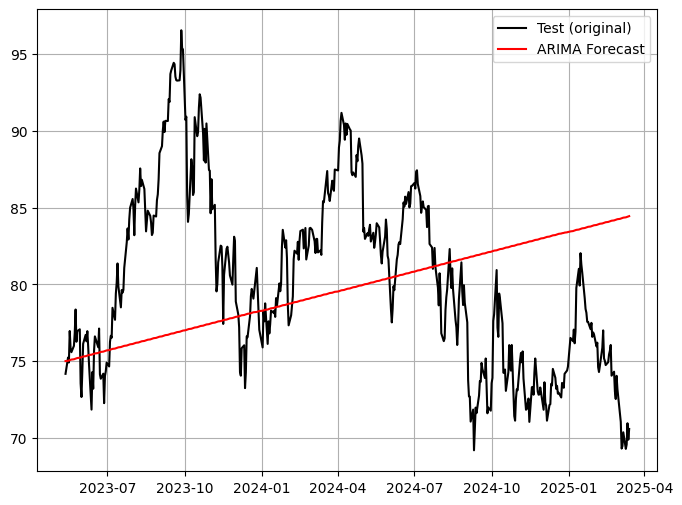

RMSE -------- 7.51640879066882


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1839
Model:                          ARIMA   Log Likelihood               -2751.547
Date:                Sun, 30 Mar 2025   AIC                           5507.095
Time:                        12:15:07   BIC                           5518.129
Sample:                             0   HQIC                          5511.163
                               - 1839                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0096      0.025      0.381      0.703      -0.040       0.059
sigma2         1.1671      0.013     92.286      0.000       1.142       1.192
Ljung-Box (L1) (Q):                   0.02   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


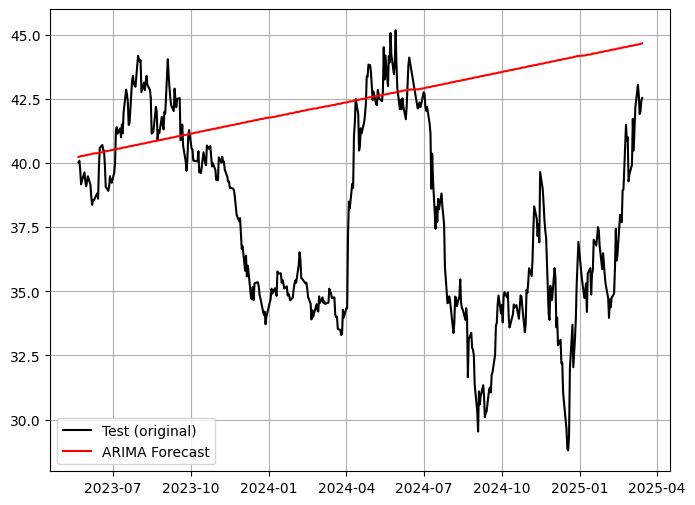

RMSE -------- 6.4289244718639065


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1843
Model:                          ARIMA   Log Likelihood               -3721.113
Date:                Sun, 30 Mar 2025   AIC                           7446.225
Time:                        12:15:07   BIC                           7457.264
Sample:                             0   HQIC                          7450.295
                               - 1843                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0068      0.045      0.151      0.880      -0.081       0.095
sigma2         3.3208      0.038     86.476      0.000       3.246       3.396
Ljung-Box (L1) (Q):                   0.91   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


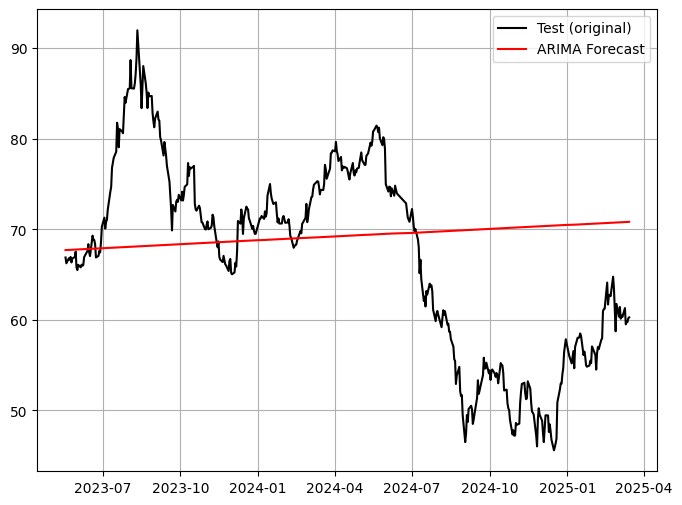

RMSE -------- 11.658282140366644


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1839
Model:                          ARIMA   Log Likelihood               -4741.280
Date:                Sun, 30 Mar 2025   AIC                           9486.561
Time:                        12:15:07   BIC                           9497.595
Sample:                             0   HQIC                          9490.630
                               - 1839                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0318      0.075      0.425      0.671      -0.115       0.178
sigma2        10.1604      0.123     82.922      0.000       9.920      10.401
Ljung-Box (L1) (Q):                   0.23   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


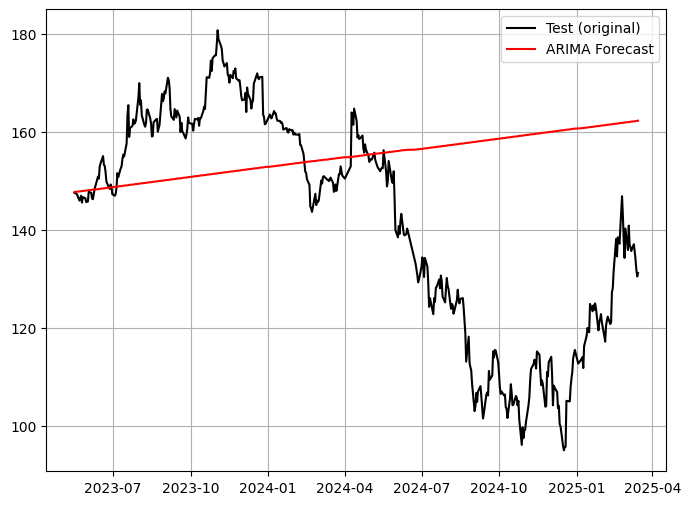

RMSE -------- 29.334151223166355


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1842
Model:                          ARIMA   Log Likelihood               -8495.059
Date:                Sun, 30 Mar 2025   AIC                          16994.117
Time:                        12:15:08   BIC                          17005.154
Sample:                             0   HQIC                         16998.187
                               - 1842                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3839      0.586      0.655      0.513      -0.766       1.533
sigma2       593.4072      4.896    121.209      0.000     583.812     603.003
Ljung-Box (L1) (Q):                   3.49   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


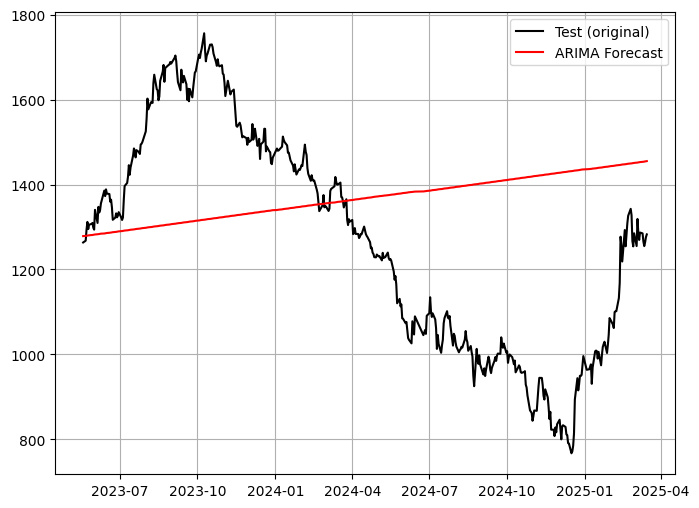

RMSE -------- 320.3510144742103


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1853
Model:                          ARIMA   Log Likelihood               -5698.145
Date:                Sun, 30 Mar 2025   AIC                          11400.291
Time:                        12:15:08   BIC                          11411.340
Sample:                             0   HQIC                         11404.363
                               - 1853                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0149      0.137      0.109      0.913      -0.253       0.283
sigma2        27.4483      0.155    176.629      0.000      27.144      27.753
Ljung-Box (L1) (Q):                   1.13   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


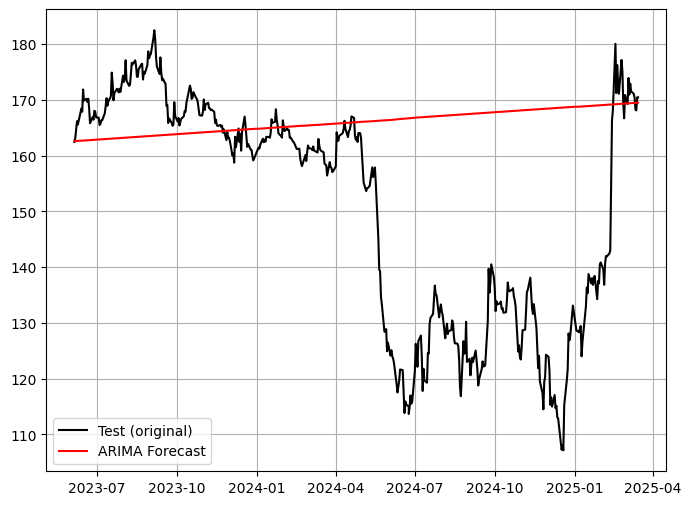

RMSE -------- 27.355865073215902


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1909
Model:                          ARIMA   Log Likelihood               -7915.189
Date:                Sun, 30 Mar 2025   AIC                          15834.379
Time:                        12:15:08   BIC                          15845.487
Sample:                             0   HQIC                         15838.467
                               - 1909                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1127      0.353      0.319      0.750      -0.580       0.805
sigma2       233.8395      4.784     48.879      0.000     224.463     243.216
Ljung-Box (L1) (Q):                   0.10   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


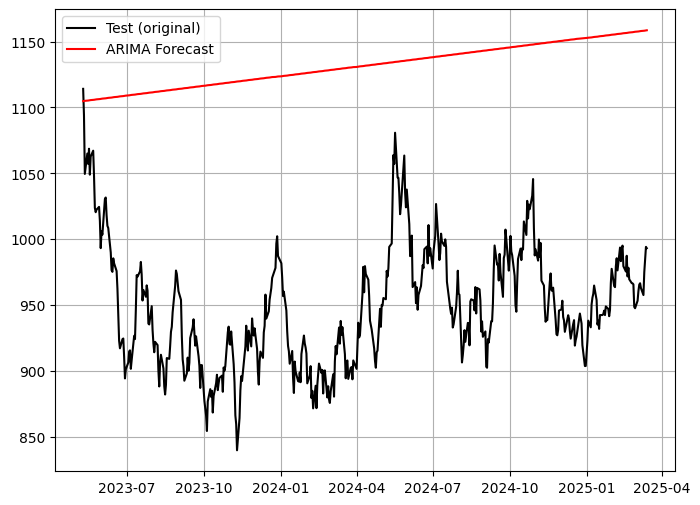

RMSE -------- 188.45195424784174


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1914
Model:                          ARIMA   Log Likelihood               -7783.650
Date:                Sun, 30 Mar 2025   AIC                          15571.301
Time:                        12:15:09   BIC                          15582.414
Sample:                             0   HQIC                         15575.390
                               - 1914                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5061      0.328      1.542      0.123      -0.137       1.150
sigma2       199.4395      3.342     59.669      0.000     192.888     205.991
Ljung-Box (L1) (Q):                   0.87   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


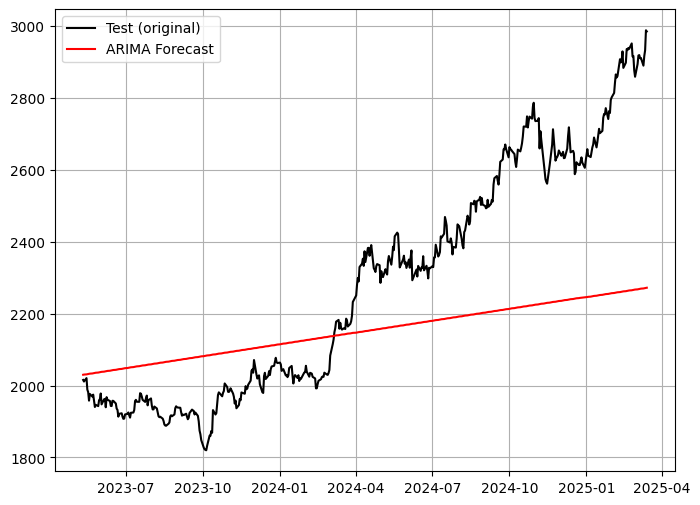

RMSE -------- 289.75714324700976


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1915
Model:                          ARIMA   Log Likelihood                -732.693
Date:                Sun, 30 Mar 2025   AIC                           1469.385
Time:                        12:15:09   BIC                           1480.500
Sample:                             0   HQIC                          1473.475
                               - 1915                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0061      0.008      0.733      0.463      -0.010       0.022
sigma2         0.1259      0.001     94.879      0.000       0.123       0.128
Ljung-Box (L1) (Q):                   0.55   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


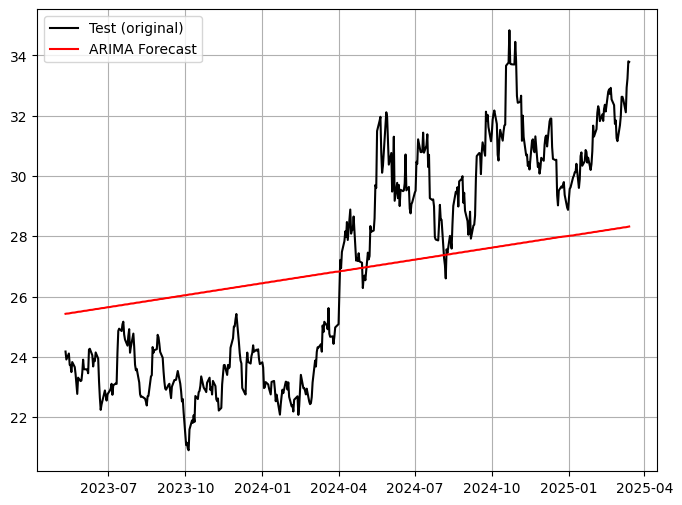

RMSE -------- 2.990255389187584


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [35]:
# Основной цикл для обучения модели ARIMA для каждого датасета
# с записью результатов

result_arima = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = arima_learn(n)
    result_arima.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")

all_reault['arima_result'] = result_arima

In [36]:
all_reault

,dataset_name,dataset_mean_price,arima_result
0,crypt_Ethereum,1264.224518,844.039192
1,crypt_BTC,24007.290015,34895.018047
2,futures_WTI_CLJ5,63.524965,7.577570
3,futures_Brent_LCOK5,68.036667,7.516409
4,share_metal_RUAL,36.765748,6.428924
5,share_metal_ALRS,82.728964,11.658282
6,share_metal_GMKN,150.887652,29.334151
7,share_oil_gaz_NVTK,1090.358767,320.351014
8,share_oil_gaz_GAZ,181.021035,27.355865
9,spot_preciouse_metal_XPT,946.928643,188.451954


In [37]:
def prophet_learn(data_1):

    data = data_1.copy()
    
    # деление датасета на 
    train_size = int(len(data) * 0.8)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]

    print(f"Train: {len(train)}, Test: {len(test)}")

    #Prophet требует колонки "ds" (дата) и "y" (целевая переменная)
    train = train.reset_index()[["Дата", "Цена"]]
    train.columns = ["ds", "y"]
    test = test.reset_index()[["Дата", "Цена"]]
    test.columns = ["ds", "y"]

    #Обучаем модель Prophet
    prophet_model = Prophet()
    prophet_model.fit(train)

    #прогноз на количество дней в тесте
    future = prophet_model.make_future_dataframe(periods=len(test))  
    forecast = prophet_model.predict(future)

    #берем только нужные прогнозы (по размеру теста)
    test_prophet = forecast[-len(test):]  

    #Оценка качества (RMSE)
    rmse_prophet = np.sqrt(mean_squared_error(test["y"].values, test_prophet["yhat"].values))
    print(f"RMSE Prophet: {rmse_prophet:.2f}")

    # График
    plt.figure(figsize=(8, 6))
    # prophet_model.plot(forecast)
    plt.plot(test.index, test["y"].values, label="Original data", color="black")
    plt.plot(test.index,test_prophet["yhat"].values, label="prophet Forecast", color="red")
    plt.legend()
    plt.grid()
    plt.show()

    return rmse_prophet
    

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

Train: 2629, Test: 658


12:15:09 - cmdstanpy - INFO - Chain [1] start processing
12:15:10 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 3469.10


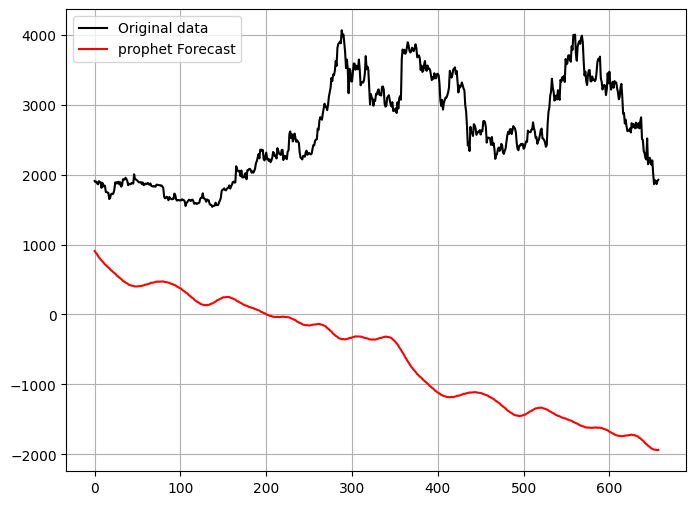

RMSE -------- 3469.0990873392325


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

Train: 2684, Test: 671


12:15:10 - cmdstanpy - INFO - Chain [1] start processing
12:15:11 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 73901.16


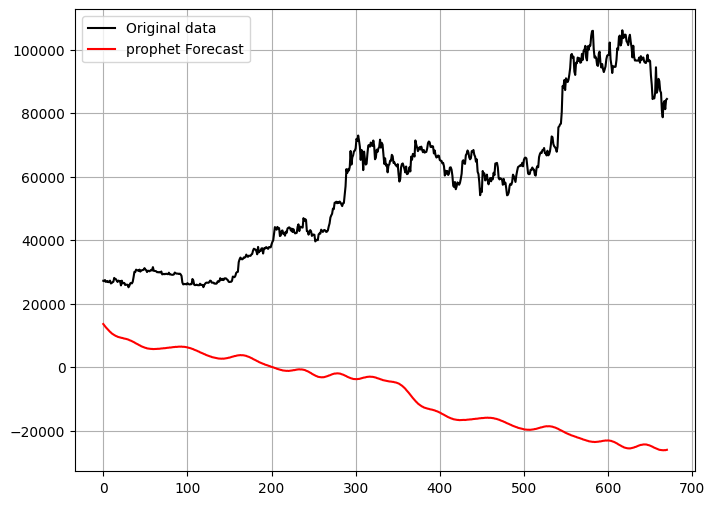

RMSE -------- 73901.15542286752


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

12:15:11 - cmdstanpy - INFO - Chain [1] start processing


Train: 1936, Test: 485


12:15:12 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 10.14


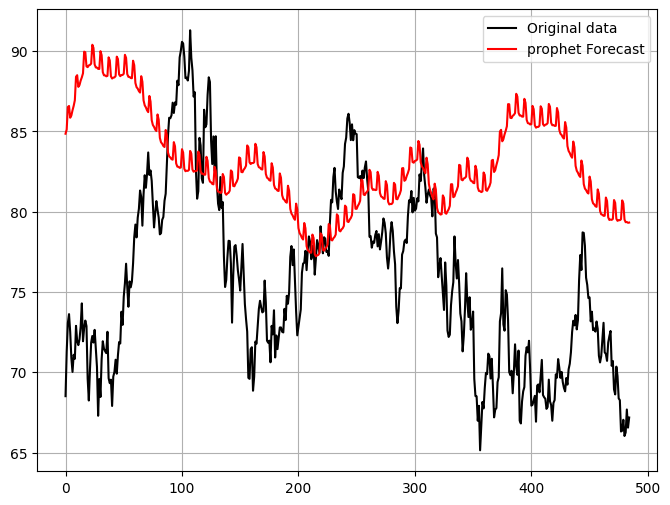

RMSE -------- 10.135416781817058


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

12:15:12 - cmdstanpy - INFO - Chain [1] start processing


Train: 1900, Test: 476


12:15:13 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 11.40


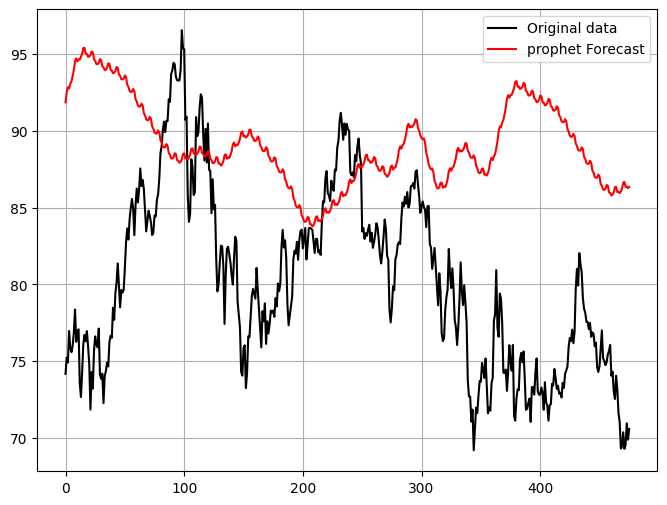

RMSE -------- 11.400878512481267


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

12:15:13 - cmdstanpy - INFO - Chain [1] start processing


Train: 1840, Test: 460


12:15:13 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 26.70


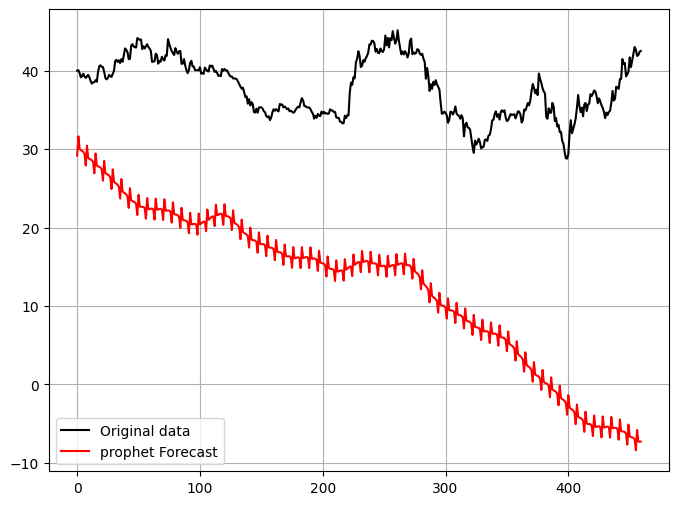

RMSE -------- 26.70381663894175


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

12:15:14 - cmdstanpy - INFO - Chain [1] start processing


Train: 1844, Test: 462


12:15:14 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 61.76


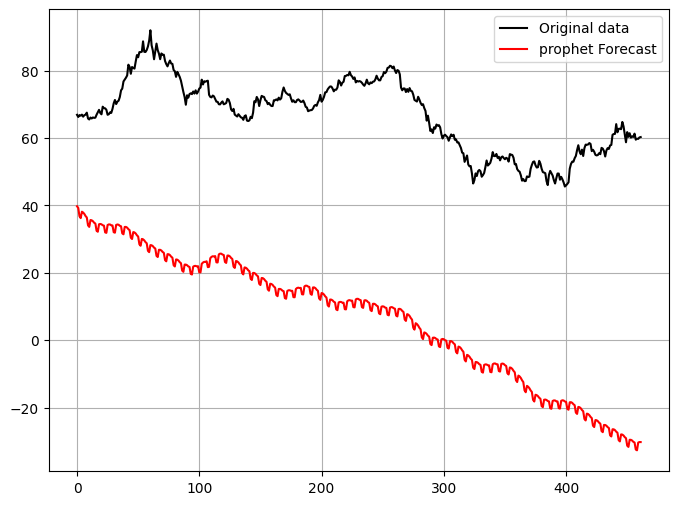

RMSE -------- 61.7587009711877


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

12:15:15 - cmdstanpy - INFO - Chain [1] start processing


Train: 1840, Test: 460


12:15:15 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 67.53


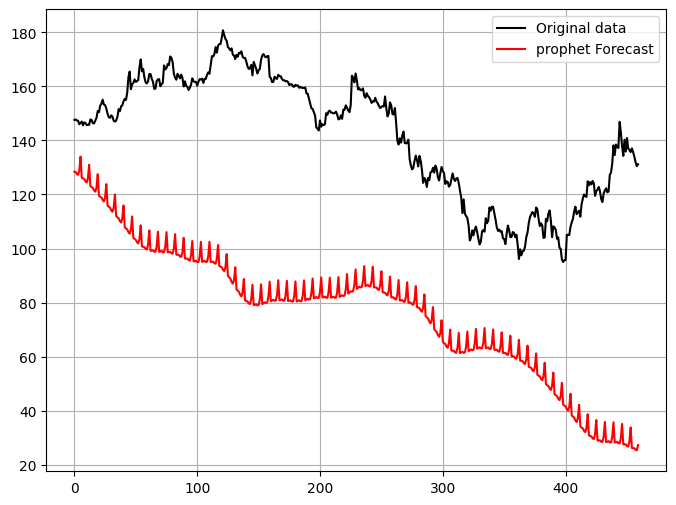

RMSE -------- 67.52575811192304


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

12:15:16 - cmdstanpy - INFO - Chain [1] start processing


Train: 1843, Test: 461


12:15:16 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 697.38


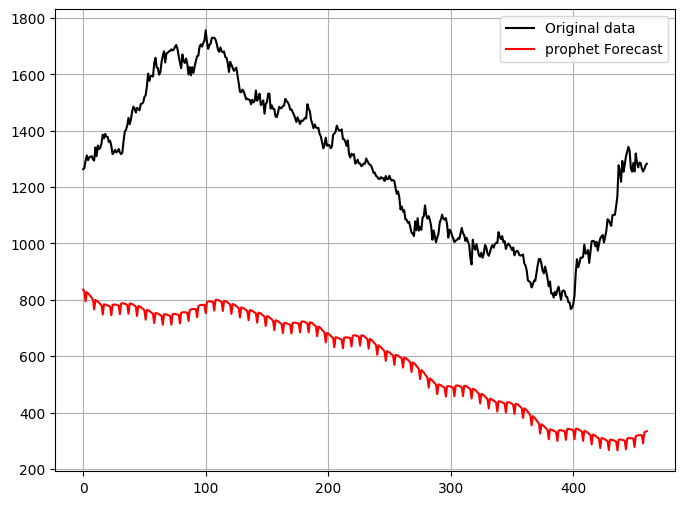

RMSE -------- 697.3772339702857


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

12:15:16 - cmdstanpy - INFO - Chain [1] start processing


Train: 1854, Test: 464


12:15:17 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 116.48


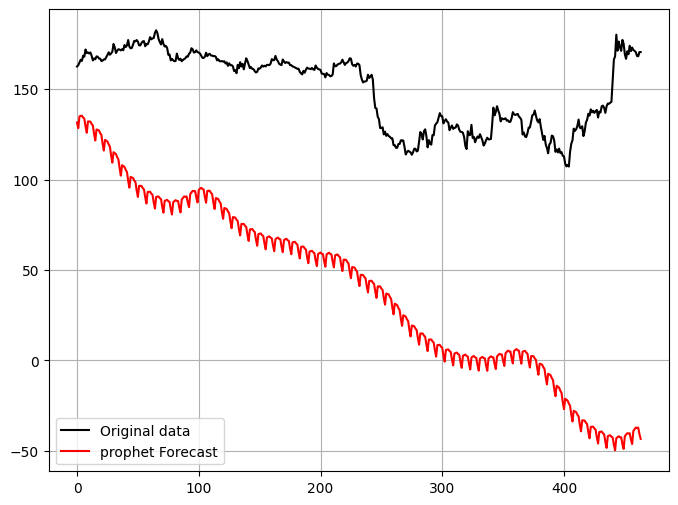

RMSE -------- 116.47864795830381


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

12:15:17 - cmdstanpy - INFO - Chain [1] start processing


Train: 1910, Test: 478


12:15:18 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 46.26


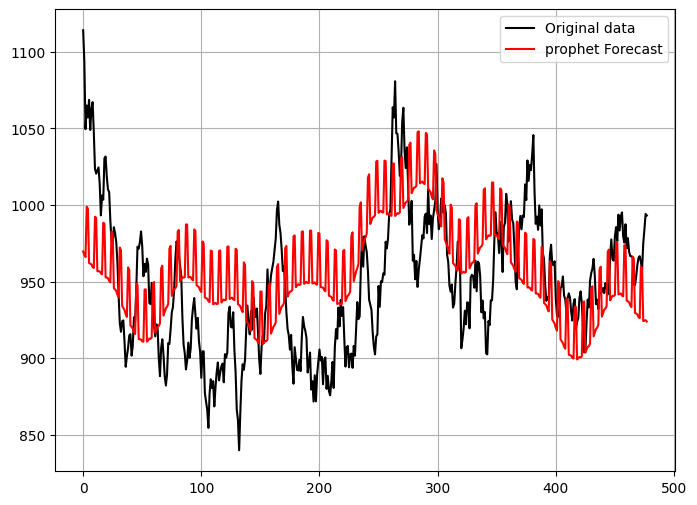

RMSE -------- 46.26262451569608


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

12:15:18 - cmdstanpy - INFO - Chain [1] start processing


Train: 1915, Test: 479


12:15:19 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 535.04


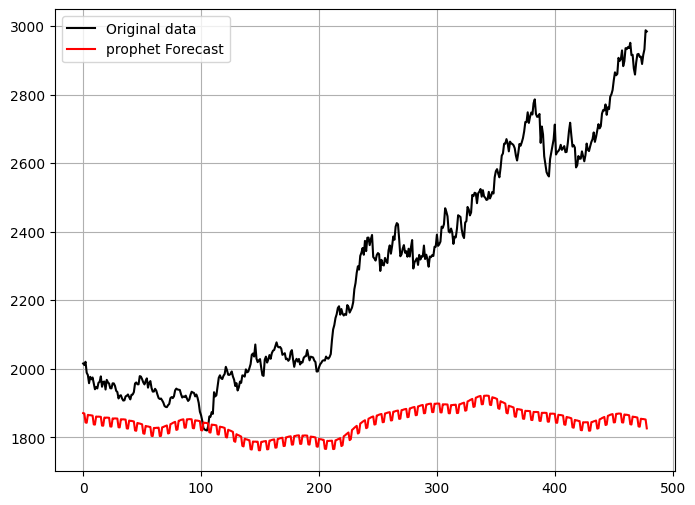

RMSE -------- 535.0393610408843


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

12:15:19 - cmdstanpy - INFO - Chain [1] start processing


Train: 1916, Test: 479


12:15:20 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 7.43


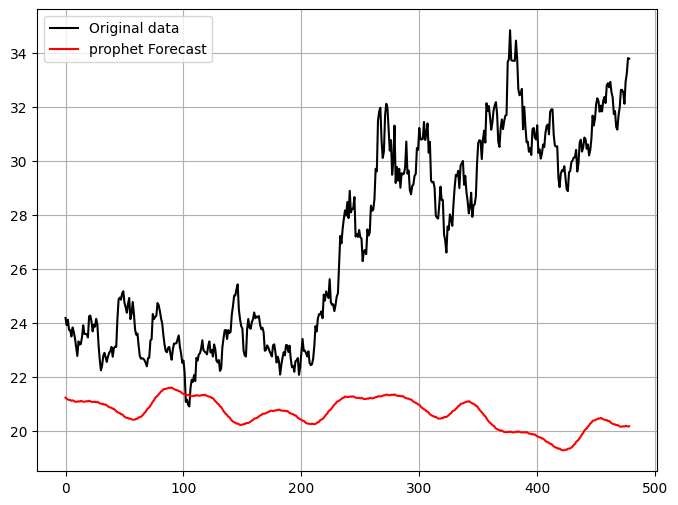

RMSE -------- 7.431600668825285


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [38]:
result_prophet = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = prophet_learn(n)
    result_prophet.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")

all_reault['prophet_result'] = result_prophet

In [39]:
all_reault

,dataset_name,dataset_mean_price,arima_result,prophet_result
0,crypt_Ethereum,1264.224518,844.039192,3469.099087
1,crypt_BTC,24007.290015,34895.018047,73901.155423
2,futures_WTI_CLJ5,63.524965,7.577570,10.135417
3,futures_Brent_LCOK5,68.036667,7.516409,11.400879
4,share_metal_RUAL,36.765748,6.428924,26.703817
5,share_metal_ALRS,82.728964,11.658282,61.758701
6,share_metal_GMKN,150.887652,29.334151,67.525758
7,share_oil_gaz_NVTK,1090.358767,320.351014,697.377234
8,share_oil_gaz_GAZ,181.021035,27.355865,116.478648
9,spot_preciouse_metal_XPT,946.928643,188.451954,46.262625



### 📊 **Обобщение качества моделей ARIMA и Prophet**

#### 🔍 **Сравнение по категориям активов:**

| Категория                     | Средний RMSE (ARIMA) | Средний RMSE (Prophet) | Вывод                         |
|------------------------------|----------------------|-------------------------|-------------------------------|
| 💰 **Криптовалюты**          | ~17 869              | ~38 685                 | ❗ Prophet и Arima не српавились        |
| 🛢 **Фьючерсы на нефть**     | ~7.55                | ~10.76                  | ⚖️ Обе модели работают хорошо, ошибка примерно в 15-20% в среднем |
| 🏗 **Металлургические акции**| ~15.80               | ~52.00                  | ⚖️ Обе модели показали плохие результаты     |
| 🛢 **Нефтегазовые акции**    | ~173.85              | ~406.93                 | ✅ ARIMA справилась лучше, но не достаточно для серьёзного восприятия      |
| 🔩 **Спот-драгметаллы**      | ~160.40              | ~196.91                 | ⚖️ Обе модели показали плохие результаты  |

---

### 🏁 **Итоговая оценка моделей "из коробки":**

Обе модели показали себя достаточно плохо при использовании их прямо из коробки как есть, не делая ни каких преобразований с датасетом. В целом это полностью ожидаемый результат в нашем случае

# 4. Прогнозирование с помощью ML-моделей

### 🔹 ML модели, которые будут использоваться в работе :
- **Random Forest / LightGBM** — деревья решений, работающие с фичами (лагами, скользящими средними и т.д.)
- **LSTM** — нейросеть, запоминающая длинные зависимости во времени

## 📖 Теоретическая основа

🔹 Как работает Random Forest:
Это ансамбль множества деревьев решений, обученных на случайных подвыборках.

Каждый отдельный дерево строится независимо (в отличие от градиентного бустинга).

Прогноз — это среднее по всем деревьям.

➕ Преимущества:
Устойчив к выбросам и переобучению

Не требует масштабирования данных

Прост в настройке

➖ Недостатки:
Может быть медленным при большом числе деревьев

Не учитывает порядок временного ряда напрямую

---

🔹 Как работает LightGBM:
Это градиентный бустинг — деревья строятся последовательно, каждое следующее исправляет ошибки предыдущих.

Использует более быстрый способ построения деревьев (leaf-wise growth, histogram-based split).

Обучение и прогнозирование быстрее, чем у Random Forest.

➕ Преимущества:
Поддерживает обработку больших объёмов данных

Высокая скорость и точность

Встроенная поддержка категориальных признаков

➖ Недостатки:
Чувствителен к переобучению при неправильной настройке

Требует аккуратной настройки гиперпараметров

---

🔹 Как работает LSTM:
LSTM обрабатывает вход поэтапно, по одному временному шагу.

У неё есть внутреннее состояние (memory cell), которое "помнит" важную информацию из прошлого.

Использует три "входа" для управления потоком информации:

Forget gate — что забыть

Input gate — что добавить

Output gate — что передать дальше

📦 В отличие от обычной RNN, LSTM может:

запоминать зависимости на десятки/сотни шагов назад

работать с нестабильными рядами (шум, сезонность и т.д.)

In [40]:
def rf_learn(data_1):
    
    # деление датасета на 
    data = data_1.copy()
    train_size = int(len(data) * 0.8)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    
    print(f"Train: {len(train)},  Test: {len(test)}")

    # Деление на фичи и таргет
    train_x = train.drop(columns = ["Цена"])
    train_y = train["Цена"]
    test_x = test.drop(columns = ["Цена"])
    test_y = test["Цена"]
    
    # Обучение модели
    rf_model = RandomForestRegressor(random_state=RANDOM_STATE)
    rf_model.fit(train_x, train_y)
    y_pred_rf = rf_model.predict(test_x)

    # Рассчёт RMSE
    rmse_rf = np.sqrt(mean_squared_error(test_y, y_pred_rf))

    # график предсказания
    plt.figure(figsize=(8, 6))
    plt.plot(test.index, y_pred_rf, label="Forecast", color="red")
    plt.plot(test.index, test_y, label="test")
    plt.legend()
    plt.grid()
    plt.show()

    return rmse_rf


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

Train: 2629,  Test: 658


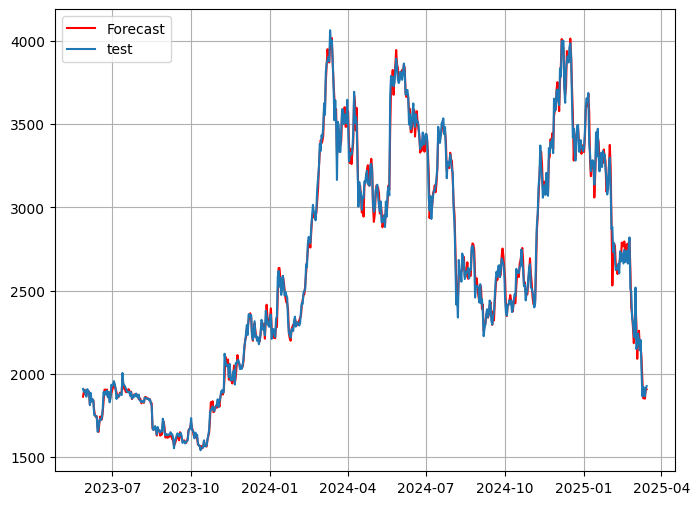

RMSE -------- 46.23141668099982


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

Train: 2684,  Test: 671


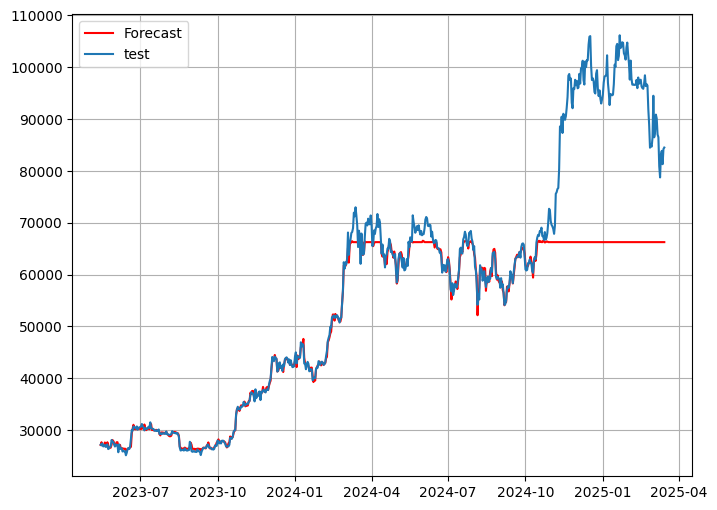

RMSE -------- 13084.720550650562


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

Train: 1936,  Test: 485


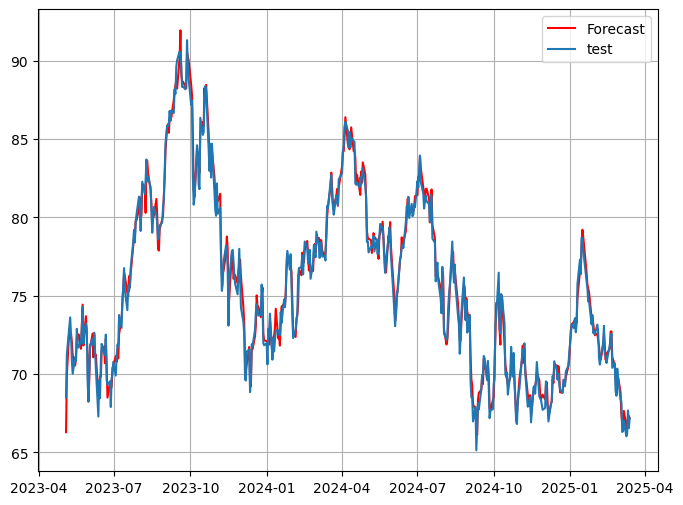

RMSE -------- 0.6728524543614299


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

Train: 1900,  Test: 476


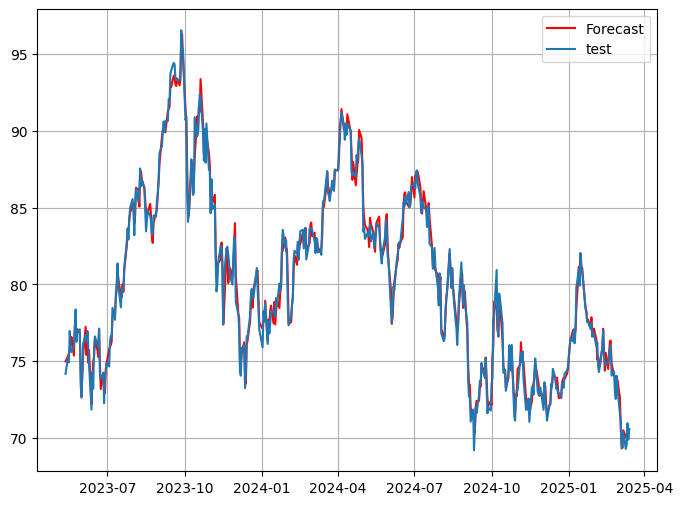

RMSE -------- 0.6648620247177328


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

Train: 1840,  Test: 460


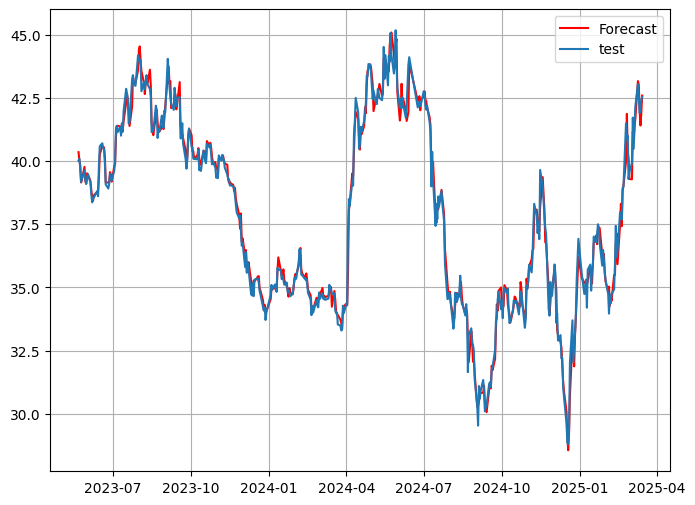

RMSE -------- 0.39512171493621034


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

Train: 1844,  Test: 462


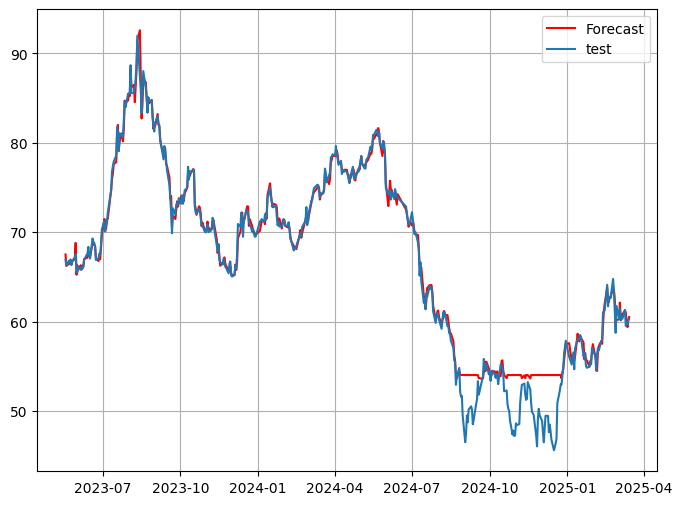

RMSE -------- 1.9234948698473424


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

Train: 1840,  Test: 460


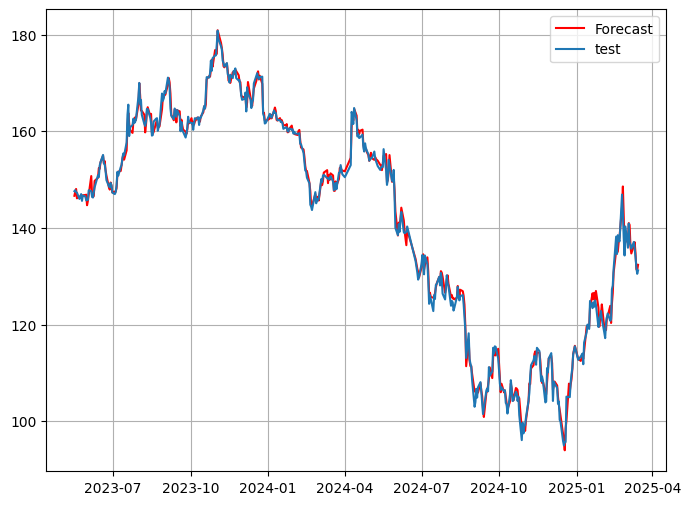

RMSE -------- 1.3103850496174274


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

Train: 1843,  Test: 461


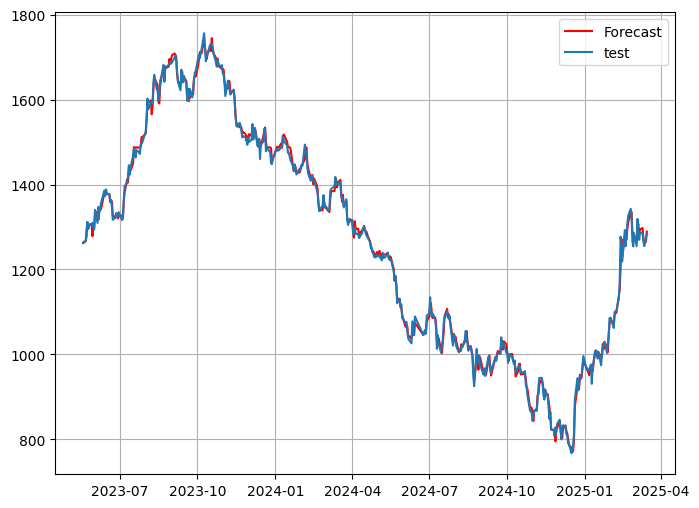

RMSE -------- 11.30898051835025


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

Train: 1854,  Test: 464


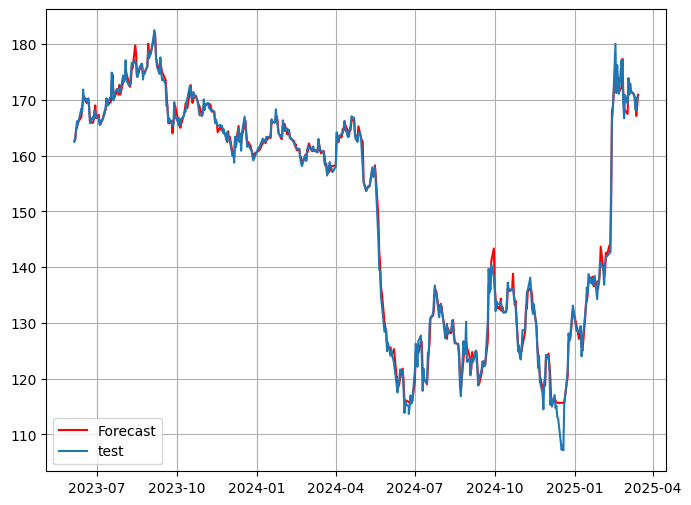

RMSE -------- 1.4692199393535237


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

Train: 1910,  Test: 478


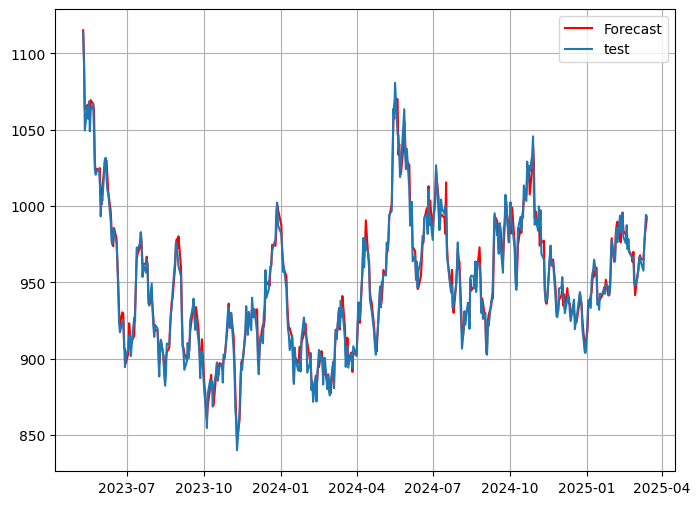

RMSE -------- 6.541619740548781


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

Train: 1915,  Test: 479


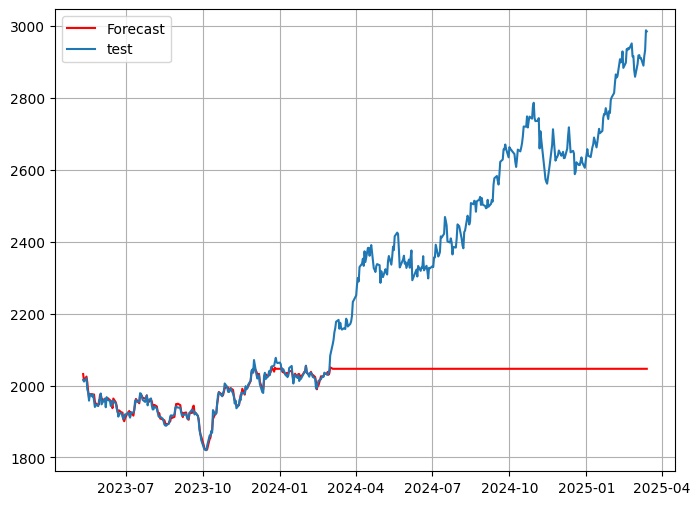

RMSE -------- 396.2984798012991


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

Train: 1916,  Test: 479


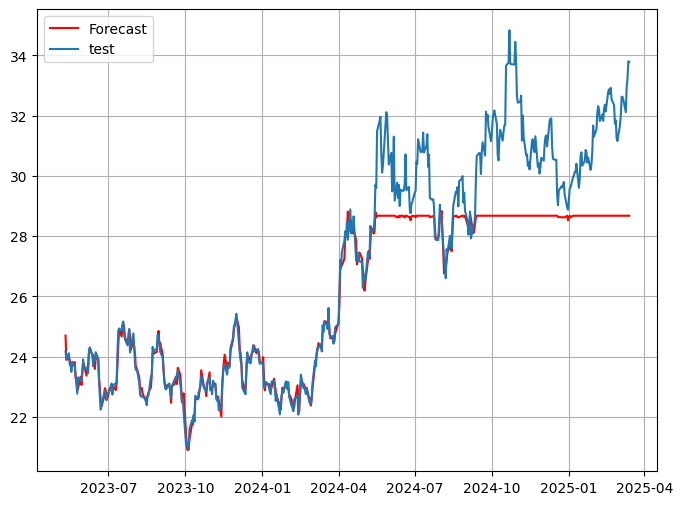

RMSE -------- 1.6661301751494222


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [41]:
result_rf = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = rf_learn(n)
    result_rf.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")
    
all_reault['result_rf'] = result_rf

In [42]:
def lgbm_learn(data_1):
    
    # Добавление новых фичей
    data = data_1.copy()

    # деление датасета на 
    train_size = int(len(data) * 0.8)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    
    print(f"Train: {len(train)}, Validation:, Test: {len(test)}")

    # Деление на таргет и фичи
    train_x = train.drop(columns = ["Цена"])
    train_y = train["Цена"]
    test_x = test.drop(columns = ["Цена"])
    test_y = test["Цена"]

    # Обучение модели
    lgb_model = lgb.LGBMRegressor()
    lgb_model.fit(train_x, train_y)

    # предсказание на тесте
    y_pred_rf = lgb_model.predict(test_x)
    rmse_rf = np.sqrt(mean_squared_error(test_y, y_pred_rf))

    # График предсказания
    plt.figure(figsize=(8, 6))
    plt.plot(test.index, y_pred_rf, label="Forecast", color="red")
    plt.plot(test.index, test_y, label="test")
    plt.legend()
    plt.grid()
    plt.show()

    return rmse_rf


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

Train: 2629, Validation:, Test: 658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 2629, number of used features: 3
[LightGBM] [Info] Start training from score 923.035252


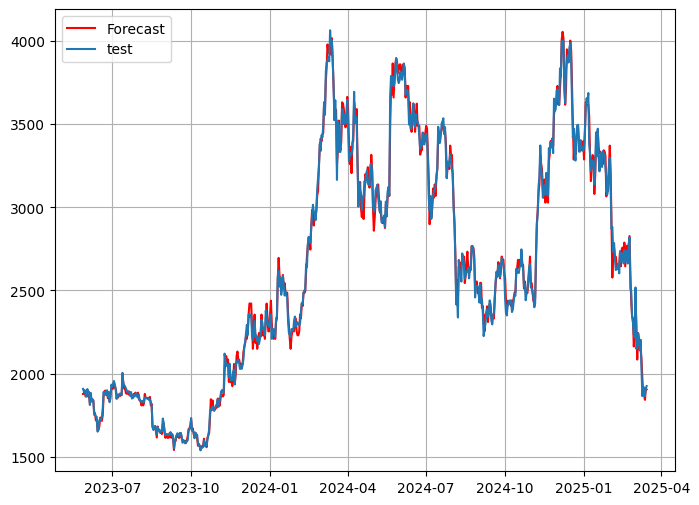

RMSE -------- 46.39217828485212


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

Train: 2684, Validation:, Test: 671
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 2684, number of used features: 3
[LightGBM] [Info] Start training from score 15685.211628


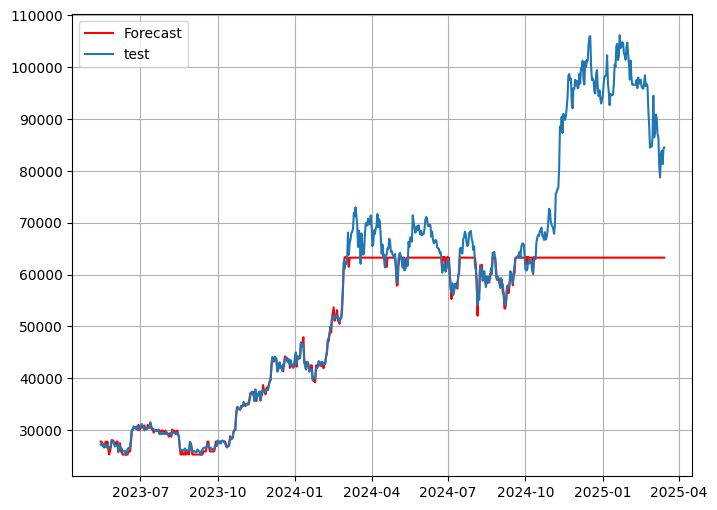

RMSE -------- 14490.792731726417


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

Train: 1936, Validation:, Test: 485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1936, number of used features: 3
[LightGBM] [Info] Start training from score 60.460785


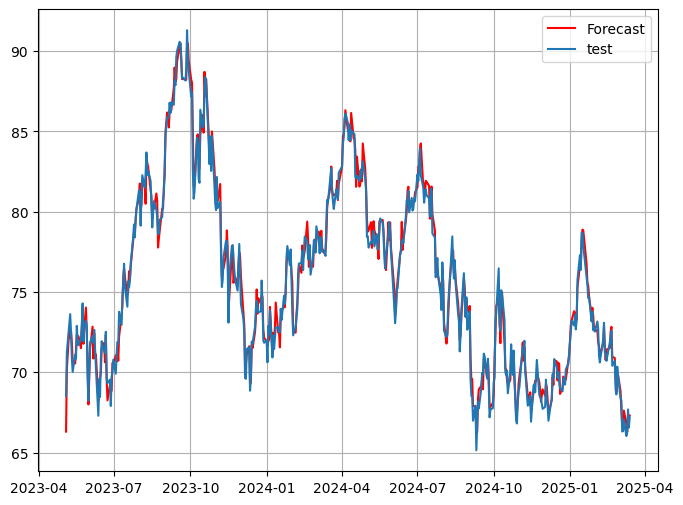

RMSE -------- 0.6734602621024585


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

Train: 1900, Validation:, Test: 476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1900, number of used features: 3
[LightGBM] [Info] Start training from score 64.977068


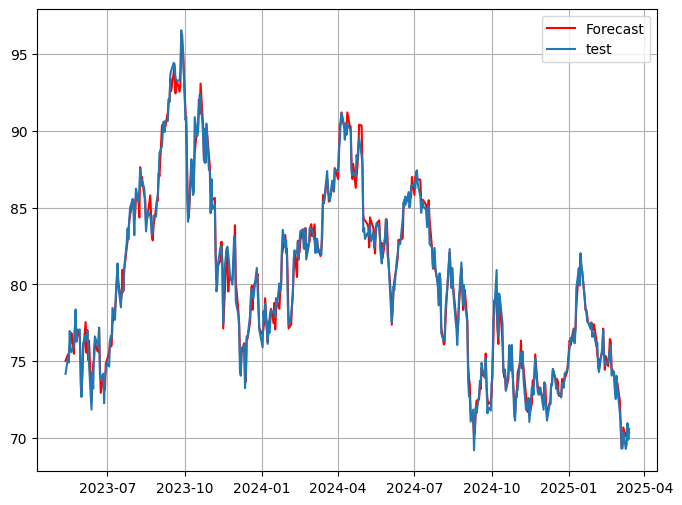

RMSE -------- 0.6646886743273216


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

Train: 1840, Validation:, Test: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1840, number of used features: 3
[LightGBM] [Info] Start training from score 36.508130


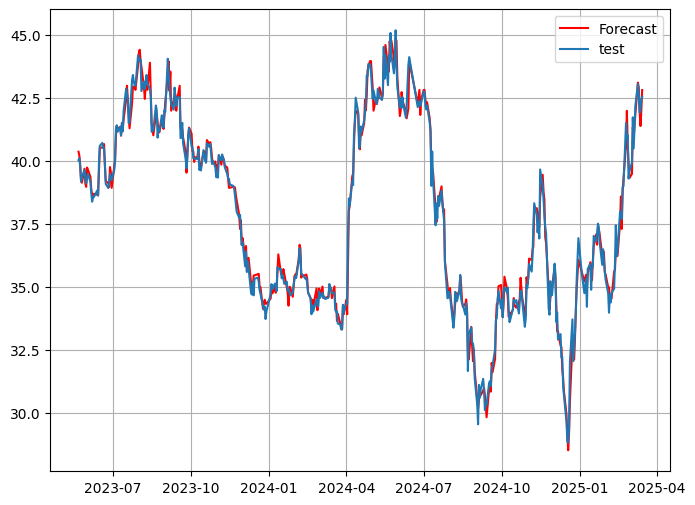

RMSE -------- 0.38123866982566207


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

Train: 1844, Validation:, Test: 462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1844, number of used features: 3
[LightGBM] [Info] Start training from score 86.713248


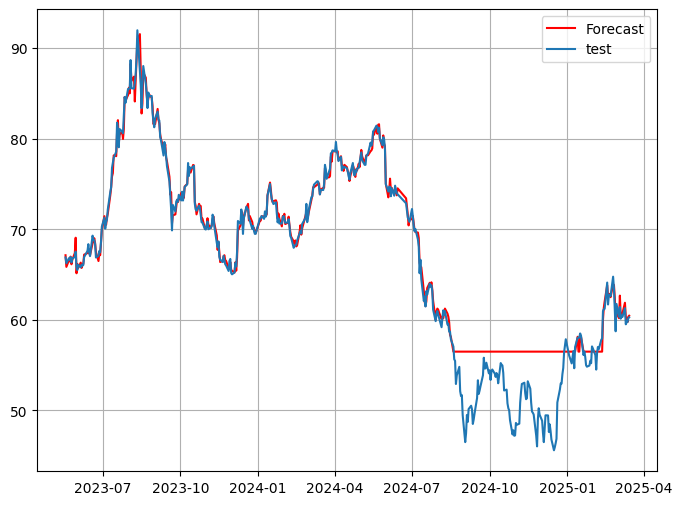

RMSE -------- 2.8302701848558347


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

Train: 1840, Validation:, Test: 460
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1840, number of used features: 3
[LightGBM] [Info] Start training from score 153.164674


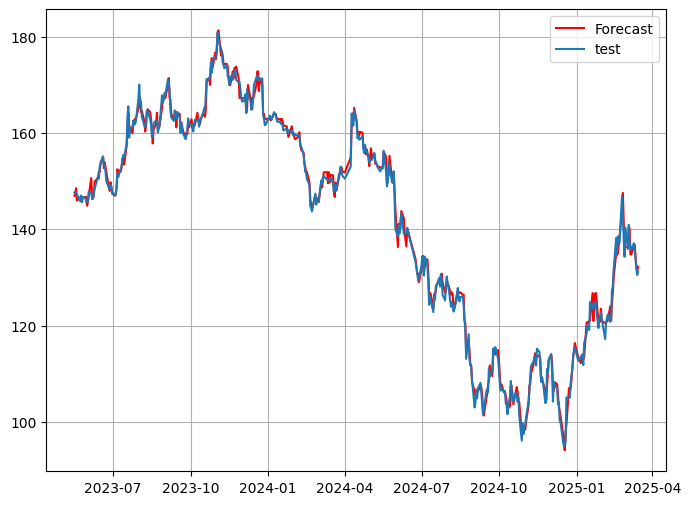

RMSE -------- 1.4183200527373871


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

Train: 1843, Validation:, Test: 461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1843, number of used features: 3
[LightGBM] [Info] Start training from score 1045.817906


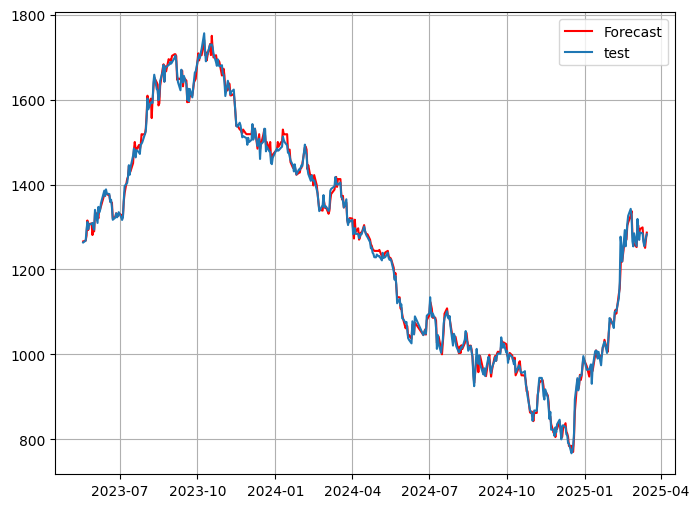

RMSE -------- 11.529886288612097


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

Train: 1854, Validation:, Test: 464
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1854, number of used features: 3
[LightGBM] [Info] Start training from score 188.811548


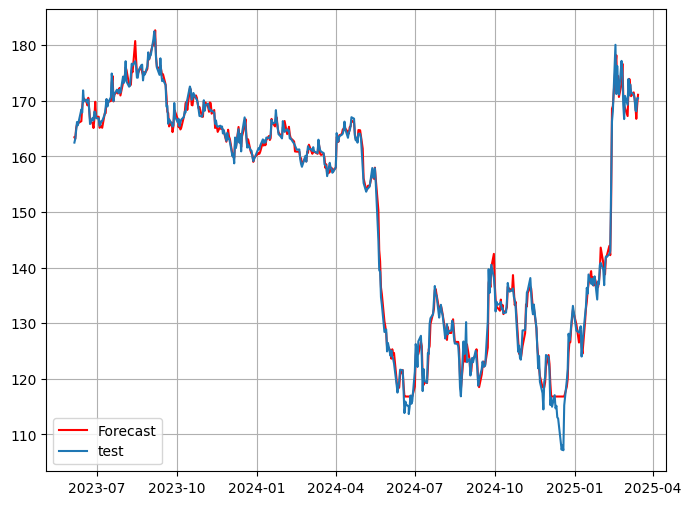

RMSE -------- 1.61046412036322


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

Train: 1910, Validation:, Test: 478
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1910, number of used features: 3
[LightGBM] [Info] Start training from score 946.500423


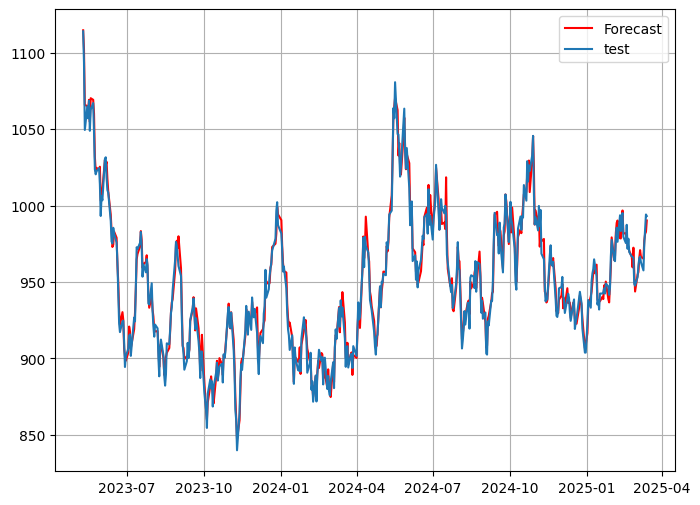

RMSE -------- 6.178419597866319


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

Train: 1915, Validation:, Test: 479
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1915, number of used features: 3
[LightGBM] [Info] Start training from score 1526.491586


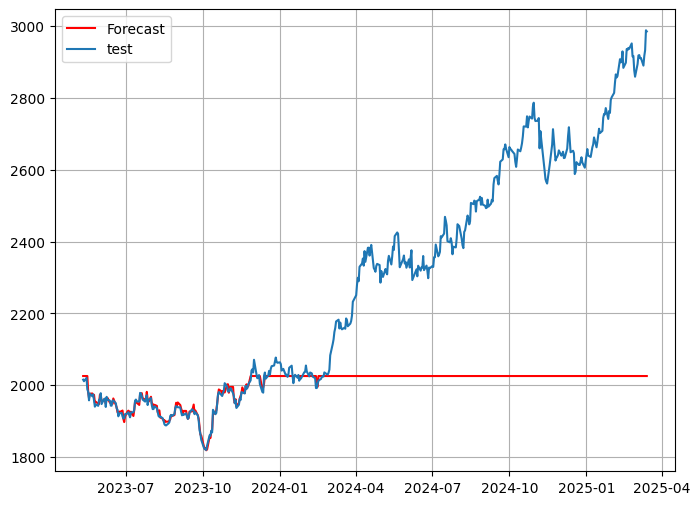

RMSE -------- 410.69633440315187


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

Train: 1916, Validation:, Test: 479
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1916, number of used features: 3
[LightGBM] [Info] Start training from score 19.285028


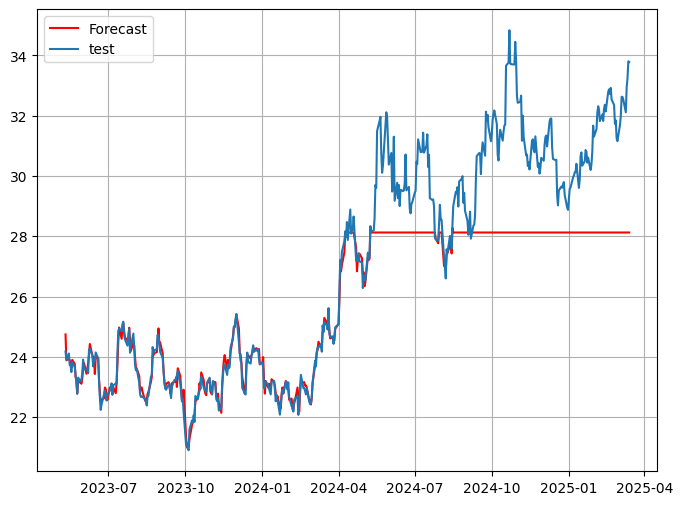

RMSE -------- 1.9745093026134994


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [43]:
result_lgbm = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = lgbm_learn(n)
    result_lgbm.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")
all_reault['result_lgbm'] = result_lgbm

In [44]:
def prepare_lstm_data(series, window_size=10):
    X, y = [], []
    for i in range(len(series) - window_size):
        X.append(series[i:i+window_size])
        y.append(series[i+window_size])
    return np.array(X), np.array(y)

def lstm_learn(data_1, window_size=10, epochs=10):
    data = data_1.copy()

    # нормализация
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(data[["Цена"]])

    # подготовка входов и выходов
    X, y = prepare_lstm_data(scaled.flatten(), window_size)

    # деление на train/test
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # LSTM ожидает входы в формате (samples, timesteps, features)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    # модель через Input, чтобы убрать warning
    model = Sequential([
        Input(shape=(window_size, 1)),
        LSTM(64, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mse')

    # обучение
    model.fit(X_train, y_train, epochs=epochs, verbose=0)

    # предсказание
    y_pred = model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    rmse_lstm = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))


    index_offset = window_size + split
    test_index = data.index[index_offset: index_offset + len(y_test)]
    # график
    plt.figure(figsize=(10, 5))
    plt.plot(test_index, y_test_inv, label="Test")
    plt.plot(test_index, y_pred_inv, label="Forecast", color="red")
    plt.legend()
    plt.title("LSTM Forecast")
    plt.grid()
    plt.show()

    return rmse_lstm


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

2025-03-30 12:15:31.270764: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


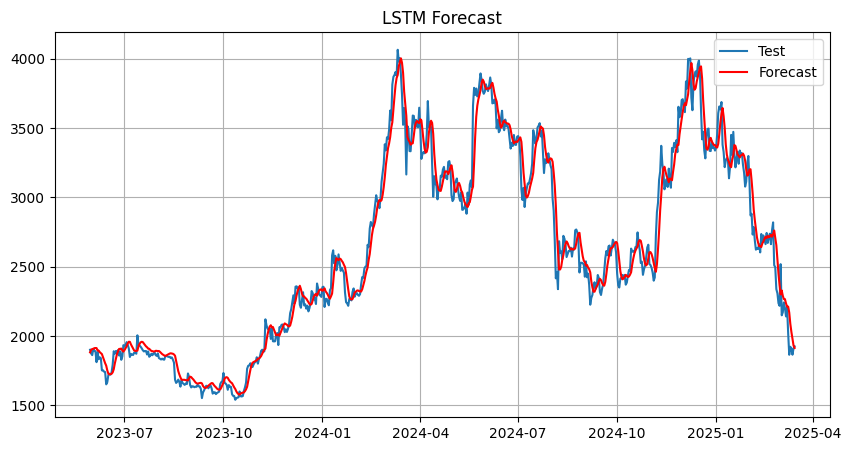

RMSE -------- 120.45439110650634


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

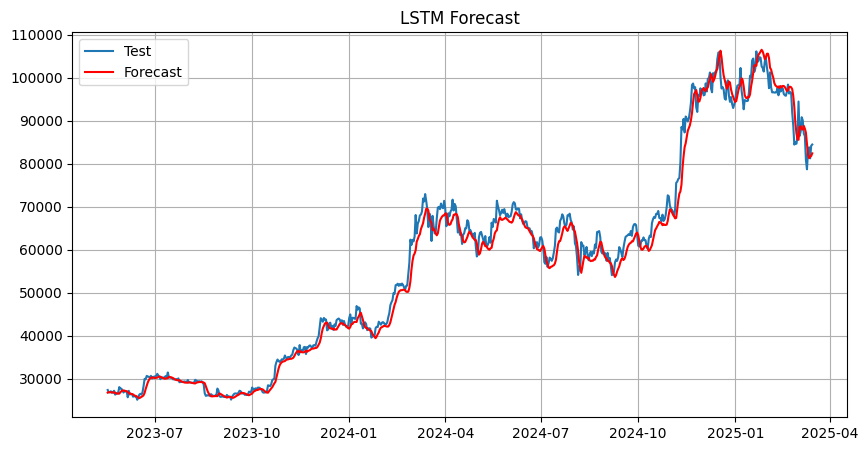

RMSE -------- 2510.8716735866774


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

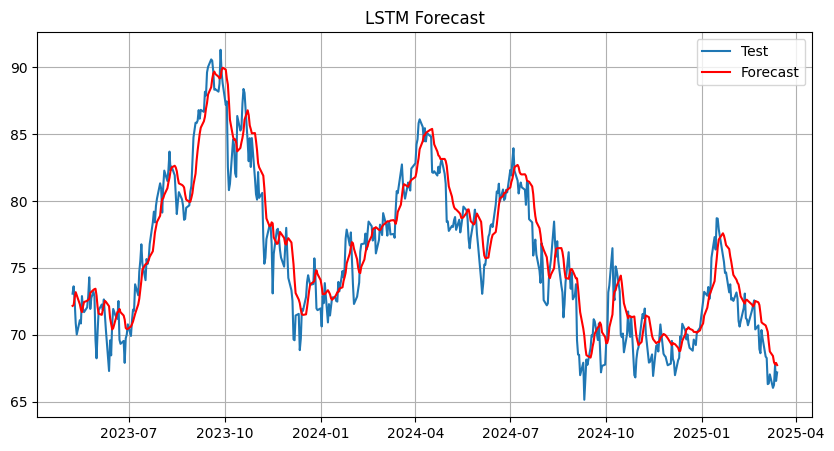

RMSE -------- 1.9932255218507373


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

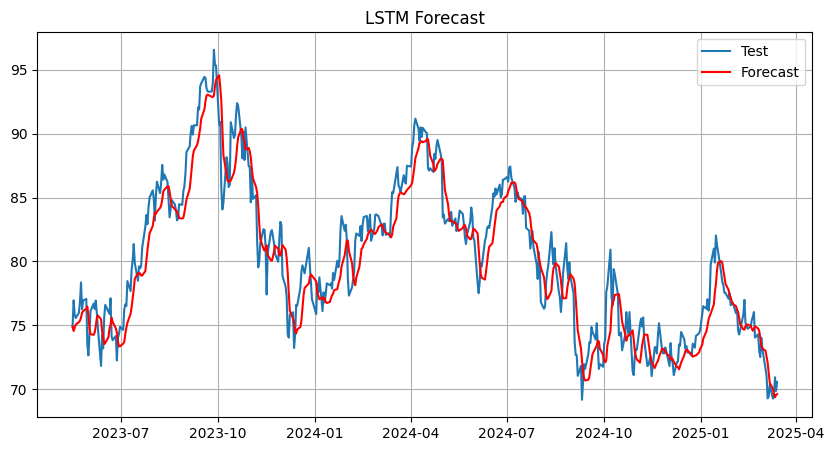

RMSE -------- 1.9760945080836523


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

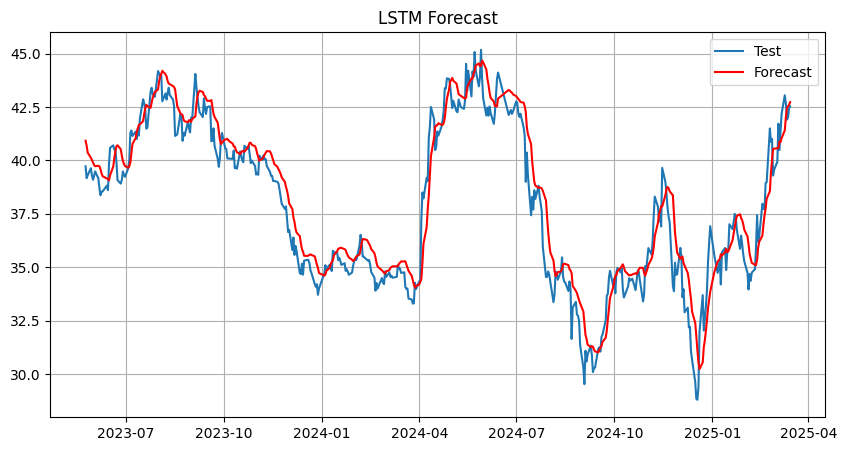

RMSE -------- 1.127288319949281


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

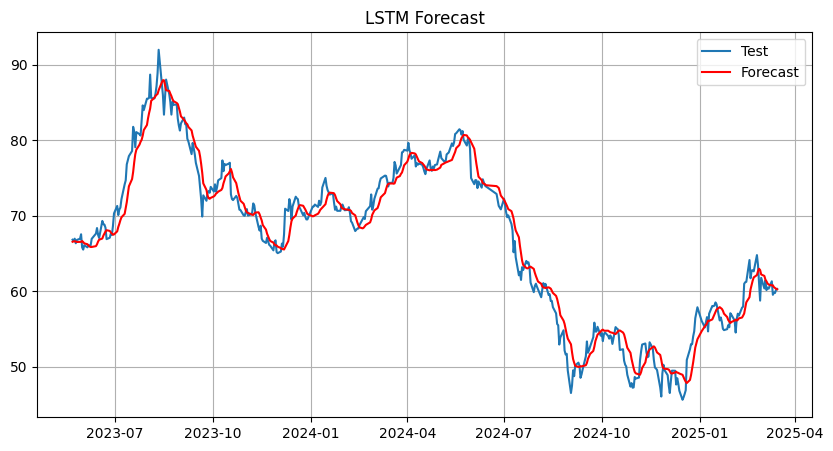

RMSE -------- 2.0073122104142787


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

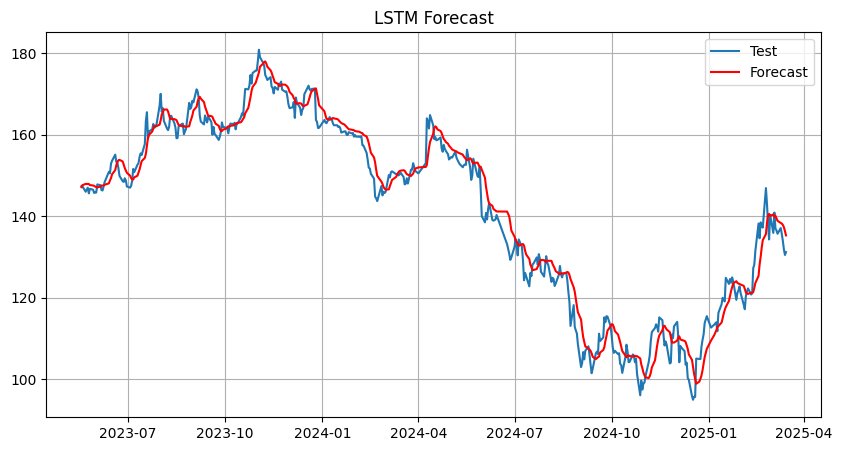

RMSE -------- 3.913810439904359


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

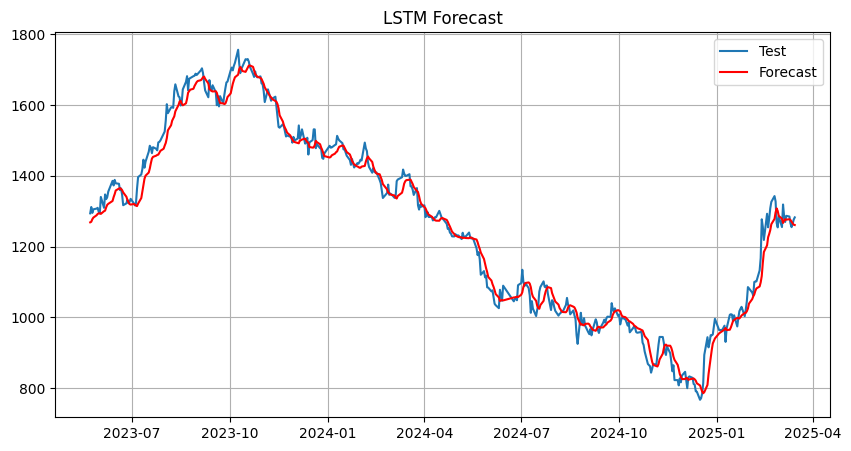

RMSE -------- 32.263260314052616


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

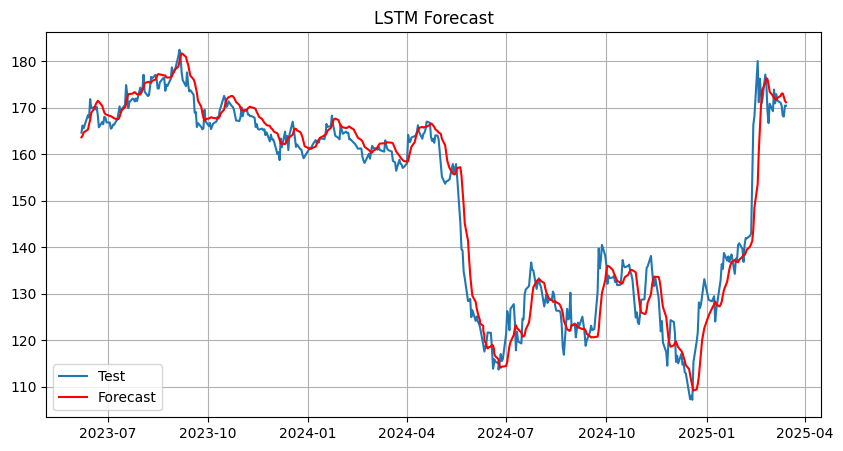

RMSE -------- 4.543210204992957


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

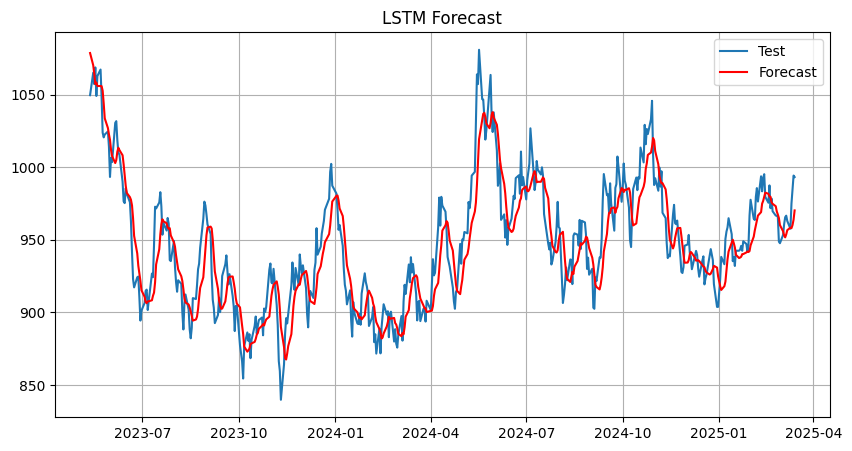

RMSE -------- 20.04373586708684


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

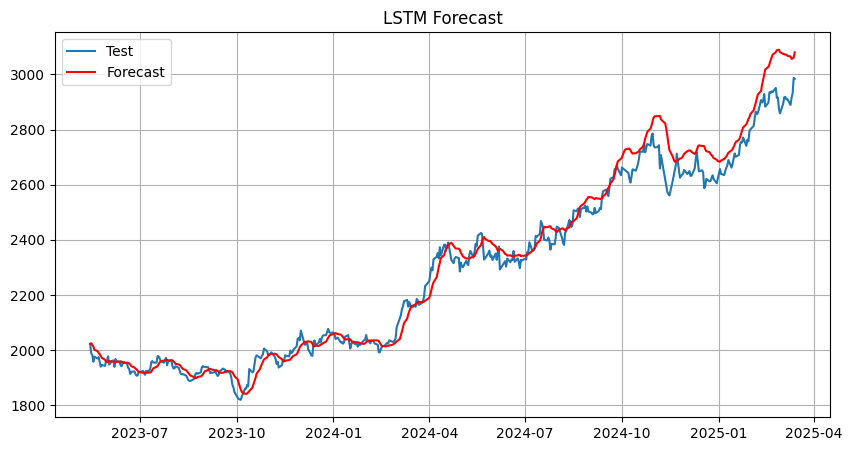

RMSE -------- 56.38331927884214


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

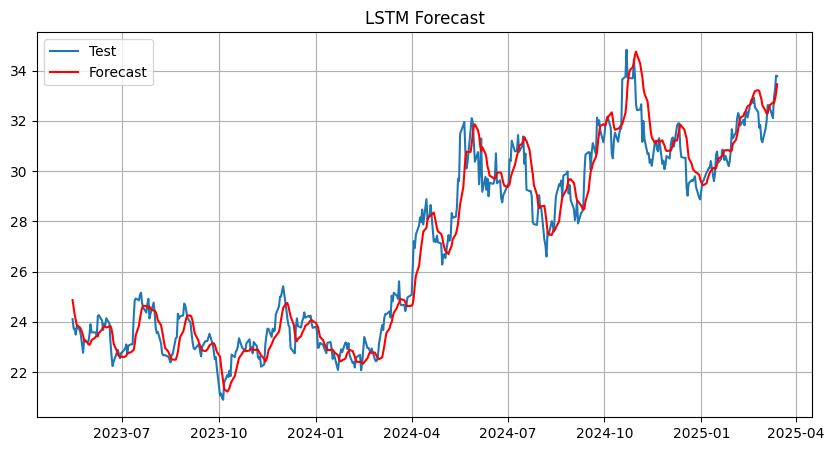

RMSE -------- 0.7920539031059151


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [45]:
result_lstm = []
for name, df in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    try:
        metr = lstm_learn(df)
    except Exception as e:
        print(f"⚠️ Ошибка: {e}")
        metr = np.nan
    result_lstm.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")
    
all_reault['result_lstm'] = result_lstm


In [46]:
all_reault

,dataset_name,dataset_mean_price,arima_result,prophet_result,result_rf,result_lgbm,result_lstm
0,crypt_Ethereum,1264.224518,844.039192,3469.099087,46.231417,46.392178,120.454391
1,crypt_BTC,24007.290015,34895.018047,73901.155423,13084.720551,14490.792732,2510.871674
2,futures_WTI_CLJ5,63.524965,7.577570,10.135417,0.672852,0.673460,1.993226
3,futures_Brent_LCOK5,68.036667,7.516409,11.400879,0.664862,0.664689,1.976095
4,share_metal_RUAL,36.765748,6.428924,26.703817,0.395122,0.381239,1.127288
5,share_metal_ALRS,82.728964,11.658282,61.758701,1.923495,2.830270,2.007312
6,share_metal_GMKN,150.887652,29.334151,67.525758,1.310385,1.418320,3.913810
7,share_oil_gaz_NVTK,1090.358767,320.351014,697.377234,11.308981,11.529886,32.263260
8,share_oil_gaz_GAZ,181.021035,27.355865,116.478648,1.469220,1.610464,4.543210
9,spot_preciouse_metal_XPT,946.928643,188.451954,46.262625,6.541620,6.178420,20.043736


/tmp/ipykernel_2081/3748432685.py:12: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 1600x600 with 0 Axes>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


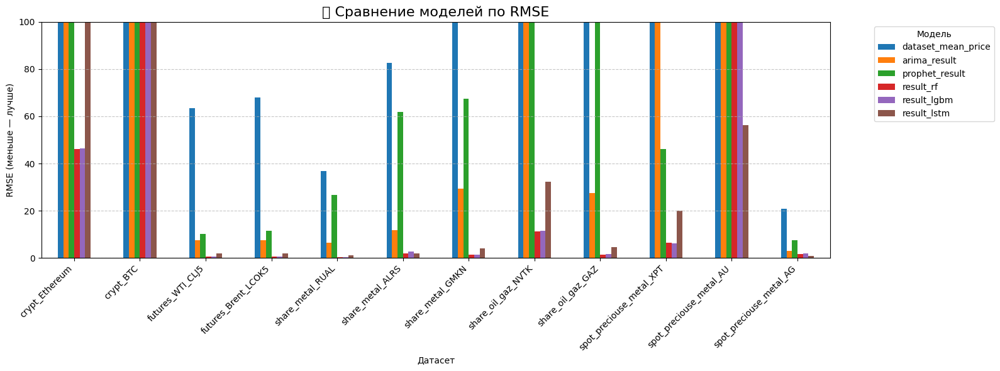

In [47]:
# Построение графика
plt.figure(figsize=(16, 6))
ax = all_reault.set_index("dataset_name").plot(kind="bar", figsize=(16, 6))

plt.title("📊 Сравнение моделей по RMSE", fontsize=16)
plt.ylabel("RMSE (меньше — лучше)")
plt.xlabel("Датасет")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.ylim(0, 100)  # Ограничение по высоте столбцов, можно подстроить под свои данные
plt.legend(title="Модель", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

🔍 Конкретные наблюдения о моделях из коробки (без проработки новых фичей):

- Криптовалюты (Ethereum, BTC):
RandomForest и LightGBM — лидеры по точности.

ARIMA и Prophet — самые слабые (особенно Prophet — RMSE выше 70 000 на BTC).

---

- Фьючерсы на нефть (WTI, Brent):
- 
Все модели справляются очень хорошо (RMSE < 15), Но ML модели српавились гораздо лучше.

---

- Металлургические и нефтегазовые акции:

Явное лидерство у RandomForest и LightGBM

---

Драгоценные металлы (спот):

Очень хорошие результаты у LSTM и LightGBM, особенно на AG.
ARIMA — тоже неплох, а вот Prophet везде отстаёт.


---

✅ Выводы:
📈 LSTM показывает самые стабильные и низкие ошибки на большинстве активов — особенно криптовалюты, акции, драгметаллы.
🌲 LightGBM и RandomForest — хороши на менее волатильных, "табличных" задачах (нефть, металлы), но требуют качественной инженерии признаков.
📉 Prophet в "сыром" виде справляется хуже всех — особенно на нестационарных и волатильных активах. Нужно его донастраивать.
📉 ARIMA — лидер по простоте и эффективности на традиционных акциях и сглаженных рядах, но остатёт от LightGBM и RandomForest



# 5. Добавлние новых фичей в датасеты для эксперемента со всеми моделями.

In [48]:
# Создание датасета для записи результатов обучения
all_reault_feat = pd.DataFrame()

name_ds = []
for i, _ in all_data.items():
    name_ds.append(i)
all_reault_feat['dataset_name'] = name_ds

# фиксация в общем датасете средней цены, для наглядности диапазона цен

mean_ds = []
for i, n in all_data.items():
    mean_ds.append(n.mean()['Цена'])
all_reault_feat['dataset_mean_price'] = mean_ds

In [49]:
def upgrade_dataset(data_1):
    data = data_1.copy()
    data["День недели"] = data.index.dayofweek
    data["Месяц"] = data.index.month
    data["Год"] = data.index.year

    data["lag_1"] = data["Цена"].shift(1)
    data["lag_3"] = data["Цена"].shift(3)
    data["lag_5"] = data["Цена"].shift(5)
    data["lag_15"] = data["Цена"].shift(15)
    data["lag_30"] = data["Цена"].shift(30)
    data["lag_90"] = data["Цена"].shift(90)
    data["lag_180"] = data["Цена"].shift(180)
    data["lag_360"] = data["Цена"].shift(360)


    data["diff_1"] = data["Цена"].diff(1)
    data["diff_2"] = data["Цена"].diff(2)

    data["sma_5"] = data["Цена"].rolling(window=5).mean()
    data["sma_10"] = data["Цена"].rolling(window=10).mean() 
    data["ema_5"] = data["Цена"].ewm(span=5).mean()
    data["ema_10"] = data["Цена"].ewm(span=10).mean()

    return data

In [50]:
def arima_learn_feat(data_1):

    data = data_1.copy()
    data = upgrade_dataset(data)
    # деление на train/test по оригинальным данным
    train_size = int(len(data) * 0.8)
    train_orig = data.iloc[:train_size]
    test_orig = data.iloc[train_size:]
    
    # Дифференцирование тренировочных данных (только train!)
    train = train_orig.diff().dropna()

    # обучение модели на стационарных данных
    arima_model = ARIMA(train["Цена"])
    arima_model = arima_model.fit()
    print(arima_model.summary())

    # Прогноз в "разностях"
    forecast_diff = arima_model.forecast(steps=len(test_orig))

    # Обратное дифференцирование
    last_train_value = train_orig["Цена"].iloc[-1]
    preds = forecast_diff.cumsum() + last_train_value

    # расчет RMSE на оригинальном масштабе
    rmse = np.sqrt(mean_squared_error(test_orig["Цена"], preds))

    # График
    plt.figure(figsize=(8, 6))
    plt.plot(test_orig.index, test_orig["Цена"], label="Test (original)", color="black")
    plt.plot(test_orig.index, preds, label="ARIMA Forecast", color="red")
    plt.legend()
    plt.grid()
    plt.show()


    return rmse
    


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 2268
Model:                          ARIMA   Log Likelihood              -12975.018
Date:                Sun, 30 Mar 2025   AIC                          25954.036
Time:                        12:16:30   BIC                          25965.489
Sample:                    03-12-2017   HQIC                         25958.215
                         - 05-27-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7974      1.589      0.502      0.616      -2.317       3.912
sigma2      5453.3137     48.769    111.820      0.000    5357.729    5548.899
Ljung-Box (L1) (Q):                  14.40   Jarque-

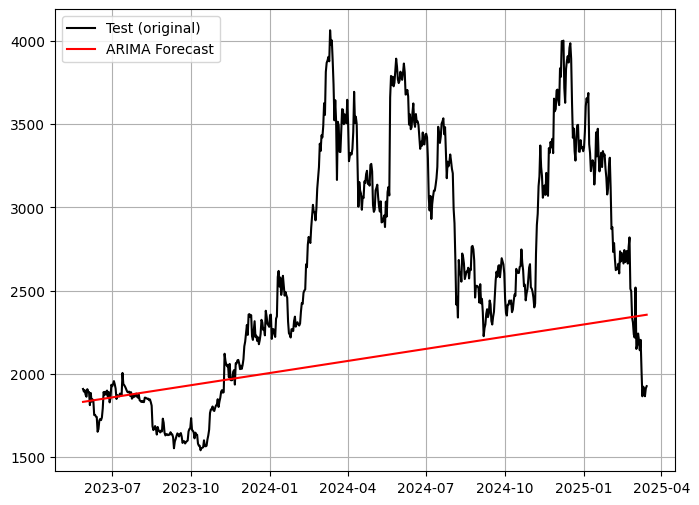

RMSE -------- 813.7437404973815


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 2323
Model:                          ARIMA   Log Likelihood              -19160.251
Date:                Sun, 30 Mar 2025   AIC                          38324.501
Time:                        12:16:30   BIC                          38336.003
Sample:                    01-03-2017   HQIC                         38328.692
                         - 05-14-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.1570     19.286      0.578      0.563     -26.643      48.957
sigma2      8.583e+05   9797.958     87.602      0.000    8.39e+05    8.78e+05
Ljung-Box (L1) (Q):                   2.61   Jarque-

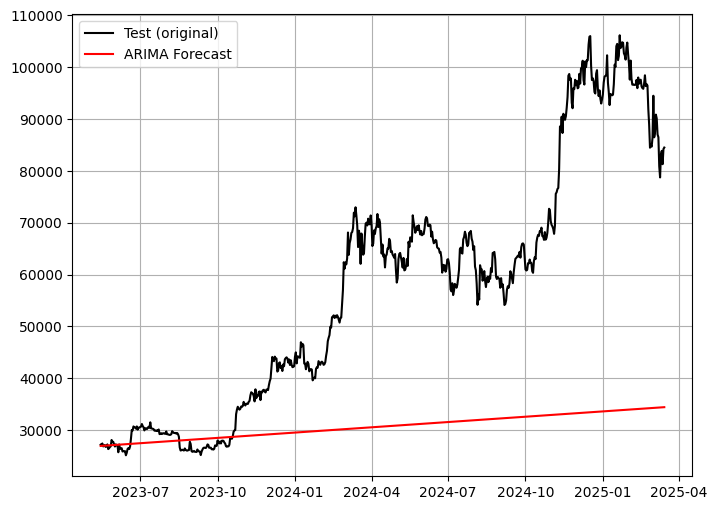

RMSE -------- 34418.20285560138


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1575
Model:                          ARIMA   Log Likelihood               -3082.286
Date:                Sun, 30 Mar 2025   AIC                           6168.572
Time:                        12:16:30   BIC                           6179.296
Sample:                             0   HQIC                          6172.558
                               - 1575                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0123      0.046      0.270      0.787      -0.077       0.102
sigma2         2.9333      0.044     66.453      0.000       2.847       3.020
Ljung-Box (L1) (Q):                   0.09   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

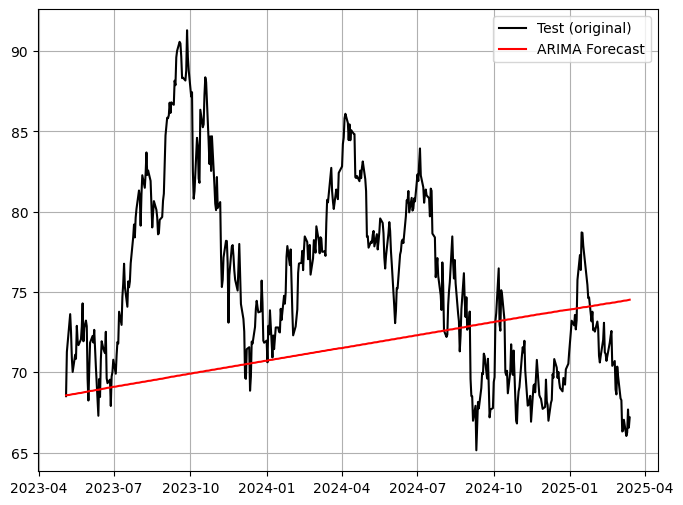

RMSE -------- 7.749442003994928


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1539
Model:                          ARIMA   Log Likelihood               -3042.830
Date:                Sun, 30 Mar 2025   AIC                           6089.661
Time:                        12:16:31   BIC                           6100.339
Sample:                             0   HQIC                          6093.634
                               - 1539                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0153      0.047      0.324      0.746      -0.077       0.108
sigma2         3.0539      0.046     67.004      0.000       2.965       3.143
Ljung-Box (L1) (Q):                   0.44   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

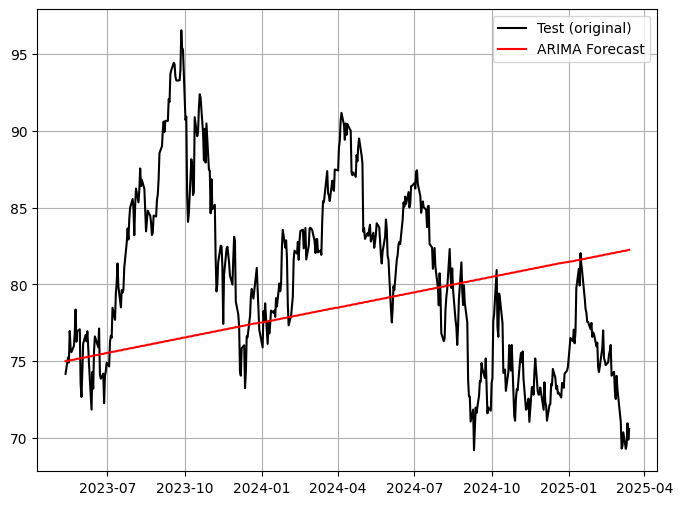

RMSE -------- 7.246496549145789


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1479
Model:                          ARIMA   Log Likelihood               -2335.017
Date:                Sun, 30 Mar 2025   AIC                           4674.035
Time:                        12:16:31   BIC                           4684.633
Sample:                             0   HQIC                          4677.986
                               - 1479                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0088      0.031      0.288      0.773      -0.051       0.069
sigma2         1.3767      0.018     77.752      0.000       1.342       1.411
Ljung-Box (L1) (Q):                   0.14   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

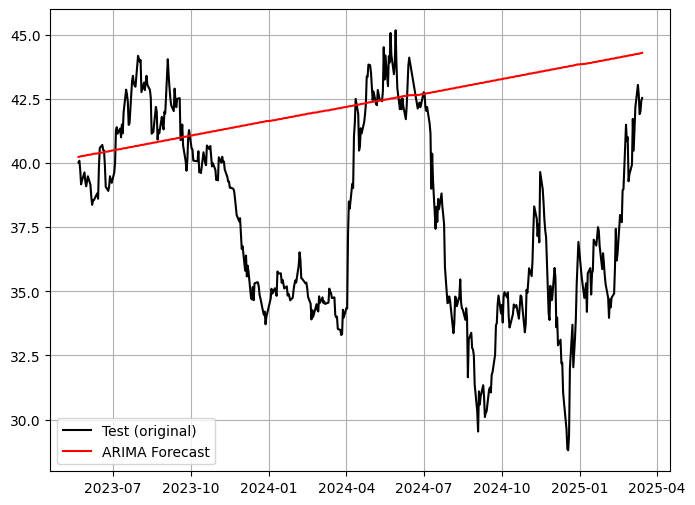

RMSE -------- 6.247923917777371


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1483
Model:                          ARIMA   Log Likelihood               -3051.272
Date:                Sun, 30 Mar 2025   AIC                           6106.545
Time:                        12:16:31   BIC                           6117.148
Sample:                             0   HQIC                          6110.497
                               - 1483                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0122      0.053     -0.232      0.817      -0.115       0.091
sigma2         3.5863      0.046     78.369      0.000       3.497       3.676
Ljung-Box (L1) (Q):                   1.14   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

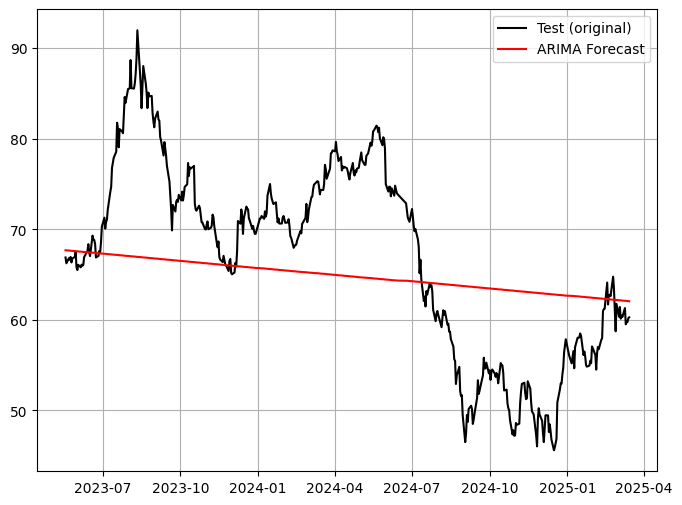

RMSE -------- 9.838755064384996


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1479
Model:                          ARIMA   Log Likelihood               -3947.437
Date:                Sun, 30 Mar 2025   AIC                           7898.874
Time:                        12:16:31   BIC                           7909.472
Sample:                             0   HQIC                          7902.825
                               - 1479                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0451      0.091      0.493      0.622      -0.134       0.224
sigma2        12.1840      0.177     68.698      0.000      11.836      12.532
Ljung-Box (L1) (Q):                   0.07   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

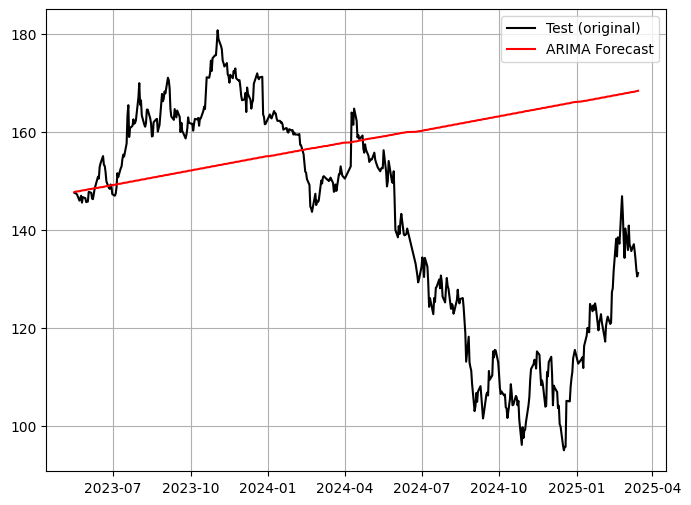

RMSE -------- 32.11272099344792


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1482
Model:                          ARIMA   Log Likelihood               -6969.792
Date:                Sun, 30 Mar 2025   AIC                          13943.583
Time:                        12:16:32   BIC                          13954.186
Sample:                             0   HQIC                         13947.535
                               - 1482                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4345      0.717      0.606      0.545      -0.972       1.841
sigma2       711.9976      7.078    100.590      0.000     698.125     725.871
Ljung-Box (L1) (Q):                   2.61   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

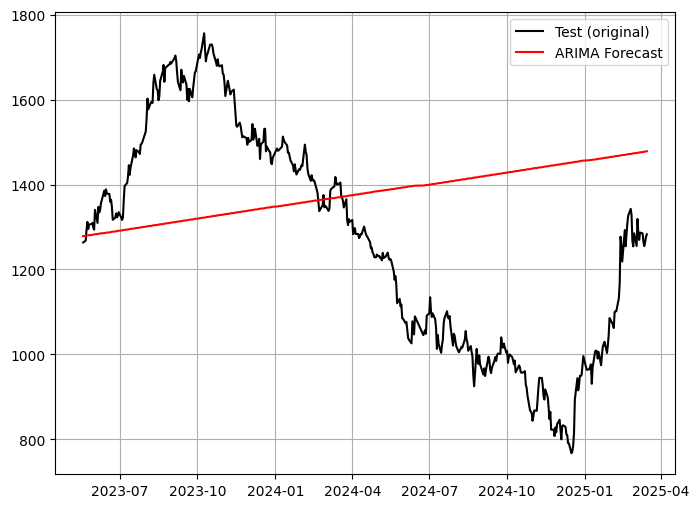

RMSE -------- 329.4970664268598


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1493
Model:                          ARIMA   Log Likelihood               -4731.662
Date:                Sun, 30 Mar 2025   AIC                           9467.325
Time:                        12:16:32   BIC                           9477.942
Sample:                             0   HQIC                          9471.281
                               - 1493                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0282      0.168      0.168      0.867      -0.301       0.358
sigma2        33.1347      0.228    145.498      0.000      32.688      33.581
Ljung-Box (L1) (Q):                   1.30   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

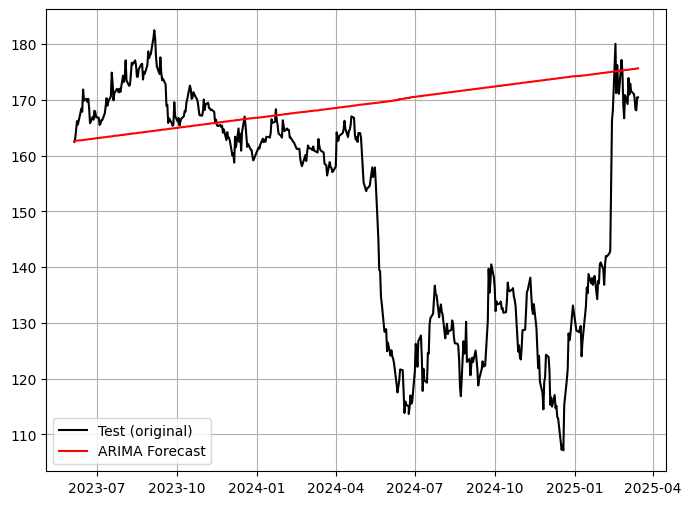

RMSE -------- 30.284278916272747


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1549
Model:                          ARIMA   Log Likelihood               -6465.996
Date:                Sun, 30 Mar 2025   AIC                          12935.992
Time:                        12:16:32   BIC                          12946.682
Sample:                             0   HQIC                         12939.968
                               - 1549                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1024      0.405      0.253      0.800      -0.691       0.896
sigma2       247.3239      5.525     44.764      0.000     236.495     258.153
Ljung-Box (L1) (Q):                   0.00   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

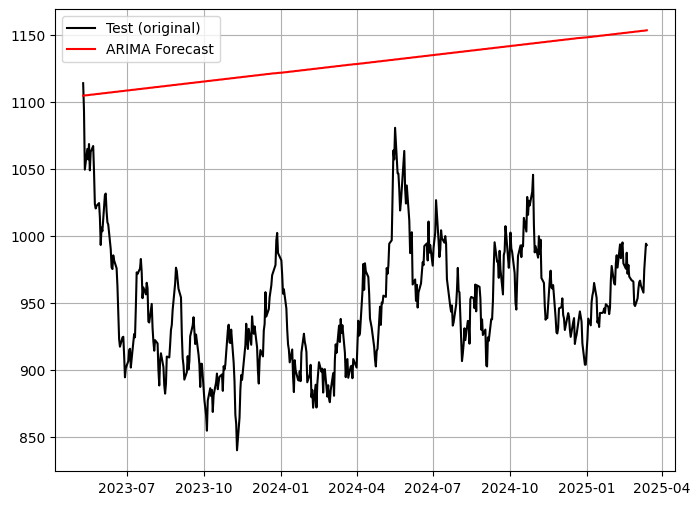

RMSE -------- 186.0127990990233


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1554
Model:                          ARIMA   Log Likelihood               -6383.135
Date:                Sun, 30 Mar 2025   AIC                          12770.269
Time:                        12:16:32   BIC                          12780.967
Sample:                             0   HQIC                         12774.247
                               - 1554                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4980      0.382      1.303      0.193      -0.251       1.247
sigma2       216.4140      4.080     53.036      0.000     208.416     224.412
Ljung-Box (L1) (Q):                   0.82   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

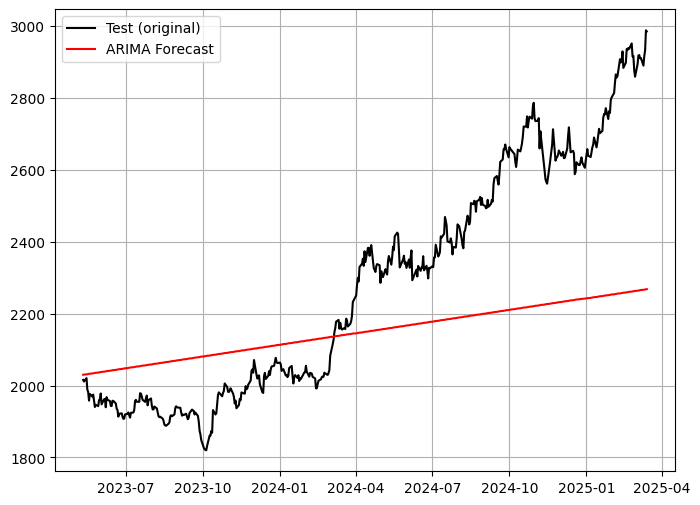

RMSE -------- 291.5790462307742


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

                               SARIMAX Results                                
Dep. Variable:                   Цена   No. Observations:                 1555
Model:                          ARIMA   Log Likelihood                -683.271
Date:                Sun, 30 Mar 2025   AIC                           1370.542
Time:                        12:16:33   BIC                           1381.240
Sample:                             0   HQIC                          1374.520
                               - 1555                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0055      0.010      0.566      0.571      -0.014       0.025
sigma2         0.1410      0.002     83.951      0.000       0.138       0.144
Ljung-Box (L1) (Q):                   1.17   Jarque-

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib

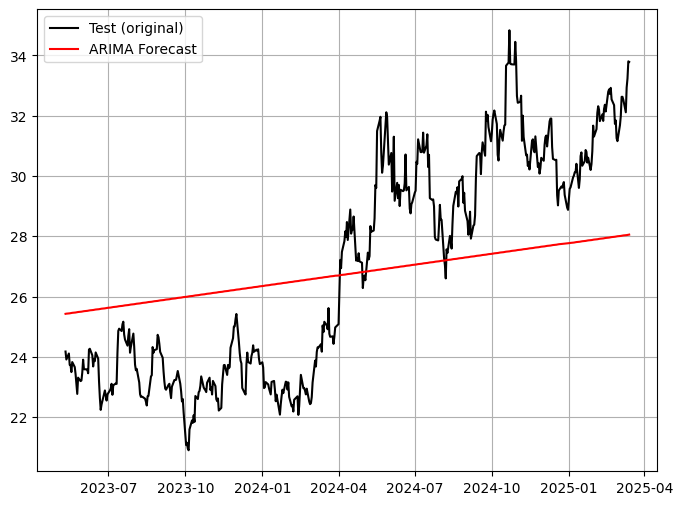

RMSE -------- 3.058864874146175


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [51]:
# Основной цикл для обучения модели ARIMA для каждого датасета
# с записью результатов

result_arima = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = arima_learn_feat(n)
    result_arima.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")

all_reault_feat['arima_result'] = result_arima

In [67]:
def prophet_learn_feat(data_1):

    data = data_1.copy()
    data = upgrade_dataset(data)
    
    # деление датасета на 
    train_size = int(len(data) * 0.8)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]

    print(f"Train: {len(train)}, Test: {len(test)}")

    #Prophet требует колонки "ds" (дата) и "y" (целевая переменная)
    train = train.reset_index()[["Дата", "Цена"]]
    train.columns = ["ds", "y"]
    test = test.reset_index()[["Дата", "Цена"]]
    test.columns = ["ds", "y"]

    #Обучаем модель Prophet
    prophet_model = Prophet()
    prophet_model.fit(train)

    #прогноз на количество дней в тесте
    future = prophet_model.make_future_dataframe(periods=len(test))  
    forecast = prophet_model.predict(future)

    #берем только нужные прогнозы (по размеру теста)
    test_prophet = forecast[-len(test):]  

    #Оценка качества (RMSE)
    rmse_prophet = np.sqrt(mean_squared_error(test["y"].values, test_prophet["yhat"].values))
    print(f"RMSE Prophet: {rmse_prophet:.2f}")

    # График
    plt.figure(figsize=(8, 6))
    # prophet_model.plot(forecast)
    plt.plot(test.index, test["y"].values, label="Original data", color="black")
    plt.plot(test.index,test_prophet["yhat"].values, label="prophet Forecast", color="red")
    plt.legend()
    plt.grid()
    plt.show()

    return rmse_prophet
    

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

12:39:53 - cmdstanpy - INFO - Chain [1] start processing


Train: 2629, Test: 658


12:39:54 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 3469.10


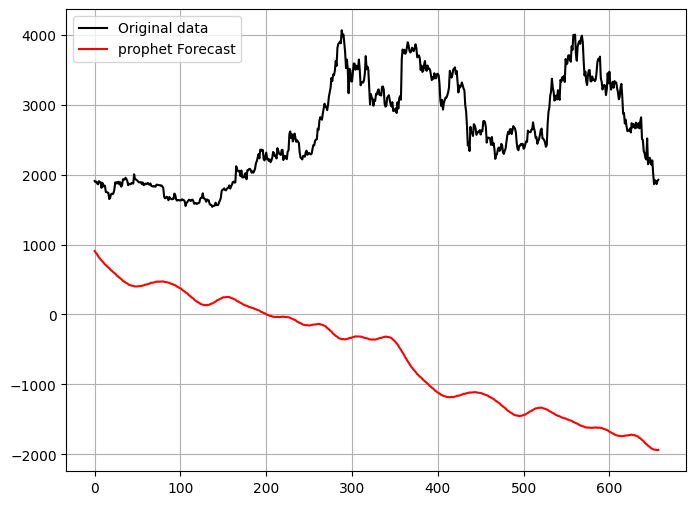

RMSE -------- 3469.0990873392325


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

Train: 2684, Test: 671


12:39:54 - cmdstanpy - INFO - Chain [1] start processing
12:39:55 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 73901.16


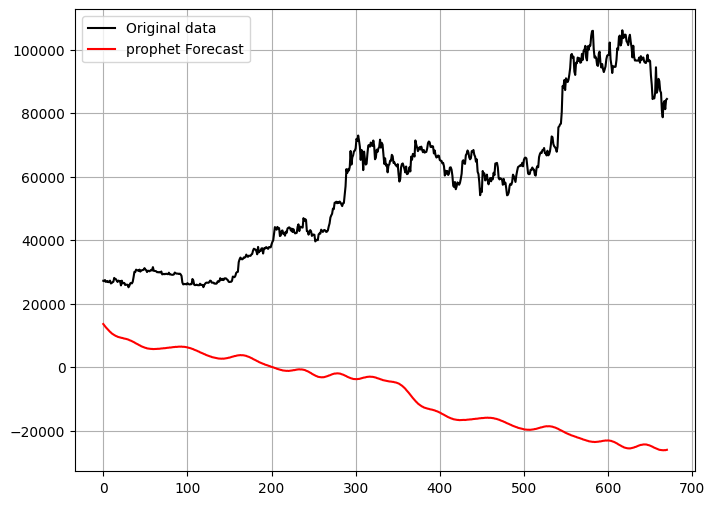

RMSE -------- 73901.15542286752


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

Train: 1936, Test: 485


12:39:55 - cmdstanpy - INFO - Chain [1] start processing
12:39:56 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 10.14


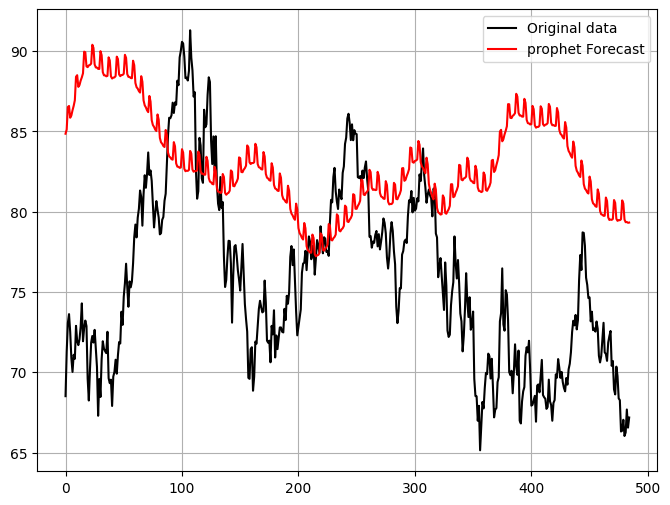

RMSE -------- 10.135416781817058


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

12:39:56 - cmdstanpy - INFO - Chain [1] start processing


Train: 1900, Test: 476


12:39:57 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 11.40


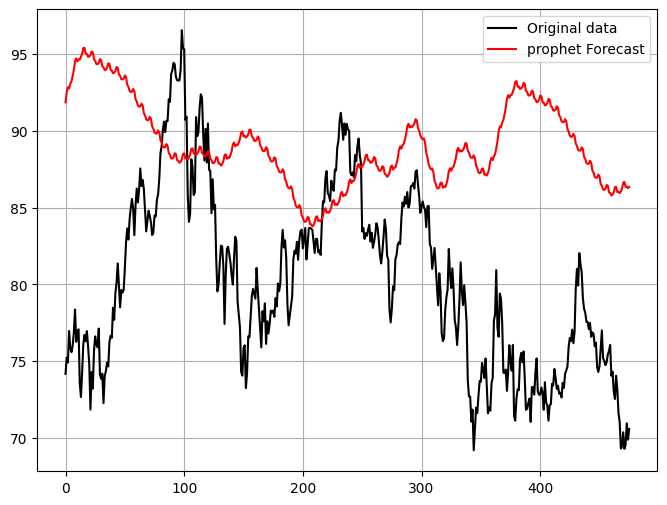

RMSE -------- 11.400878512481267


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

12:39:57 - cmdstanpy - INFO - Chain [1] start processing


Train: 1840, Test: 460


12:39:57 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 26.70


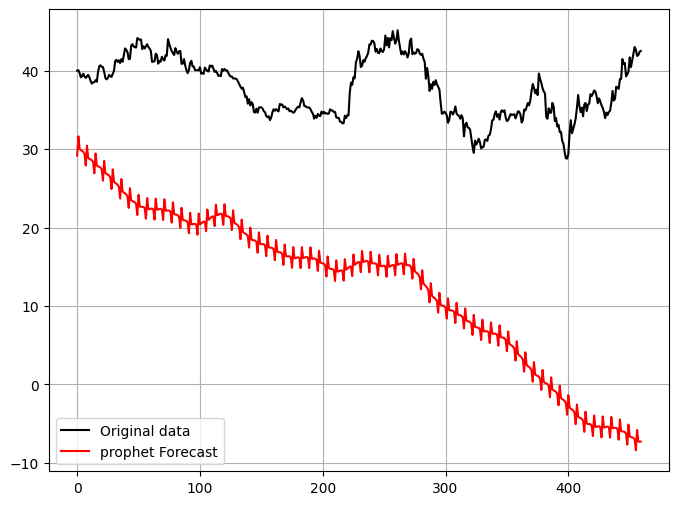

RMSE -------- 26.70381663894175


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

12:39:58 - cmdstanpy - INFO - Chain [1] start processing


Train: 1844, Test: 462


12:39:58 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 61.76


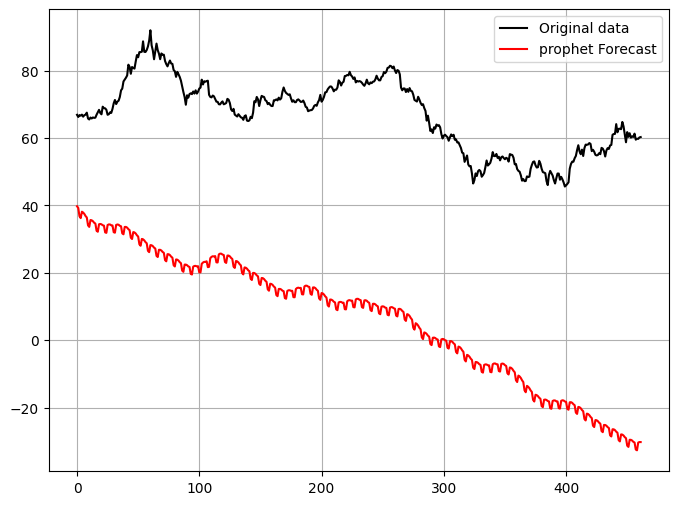

RMSE -------- 61.7587009711877


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

12:39:59 - cmdstanpy - INFO - Chain [1] start processing


Train: 1840, Test: 460


12:39:59 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 67.53


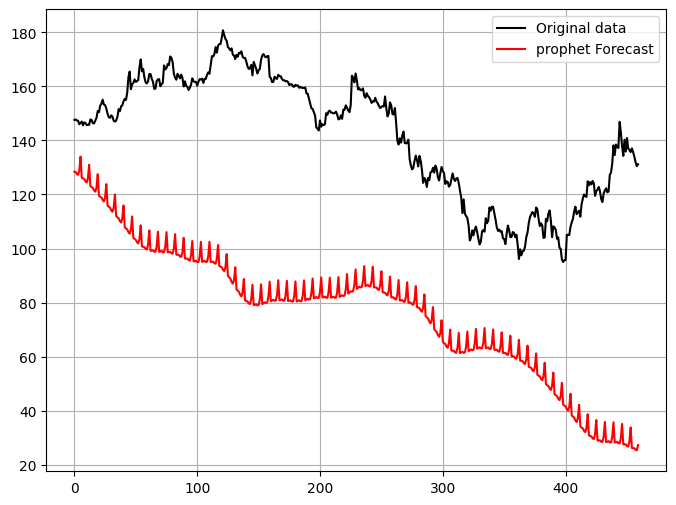

RMSE -------- 67.52575811192304


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

12:39:59 - cmdstanpy - INFO - Chain [1] start processing


Train: 1843, Test: 461


12:40:00 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 697.38


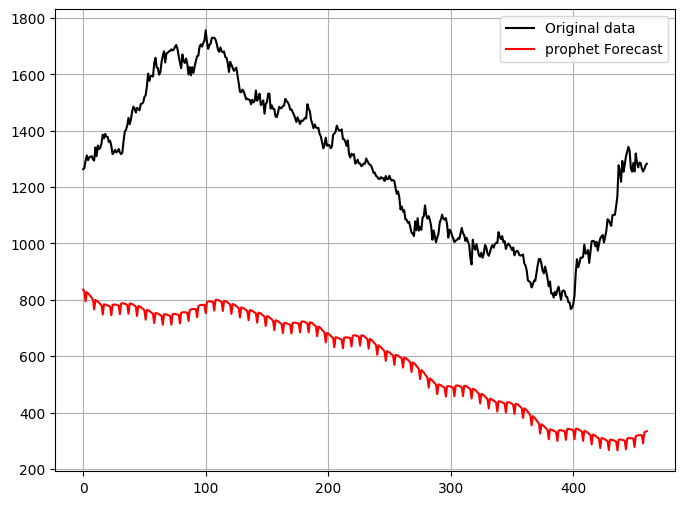

RMSE -------- 697.3772339702857


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

12:40:00 - cmdstanpy - INFO - Chain [1] start processing


Train: 1854, Test: 464


12:40:01 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 116.48


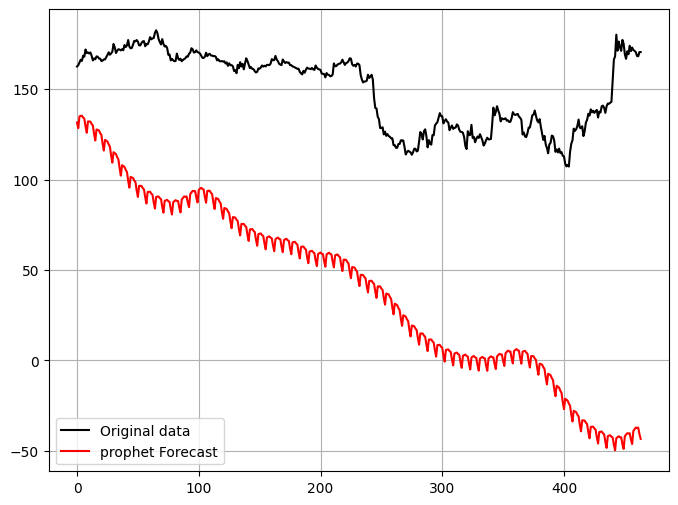

RMSE -------- 116.47864795830381


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

12:40:01 - cmdstanpy - INFO - Chain [1] start processing


Train: 1910, Test: 478


12:40:02 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 46.26


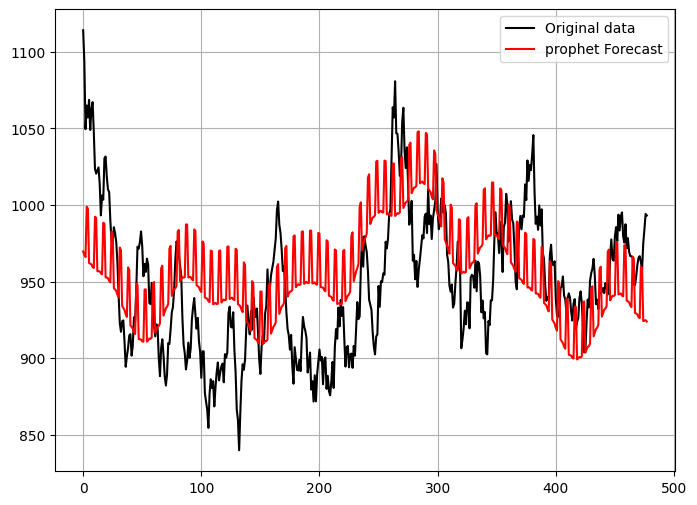

RMSE -------- 46.26262451569608


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

12:40:02 - cmdstanpy - INFO - Chain [1] start processing


Train: 1915, Test: 479


12:40:03 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 535.04


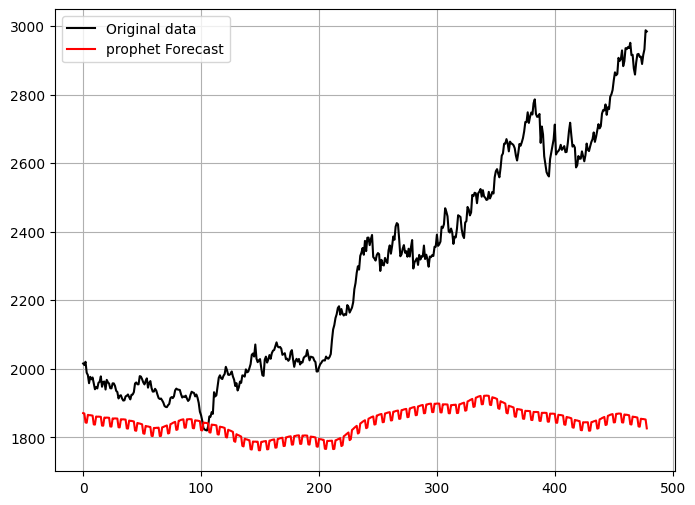

RMSE -------- 535.0393610408843


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

12:40:03 - cmdstanpy - INFO - Chain [1] start processing


Train: 1916, Test: 479


12:40:04 - cmdstanpy - INFO - Chain [1] done processing


RMSE Prophet: 7.43


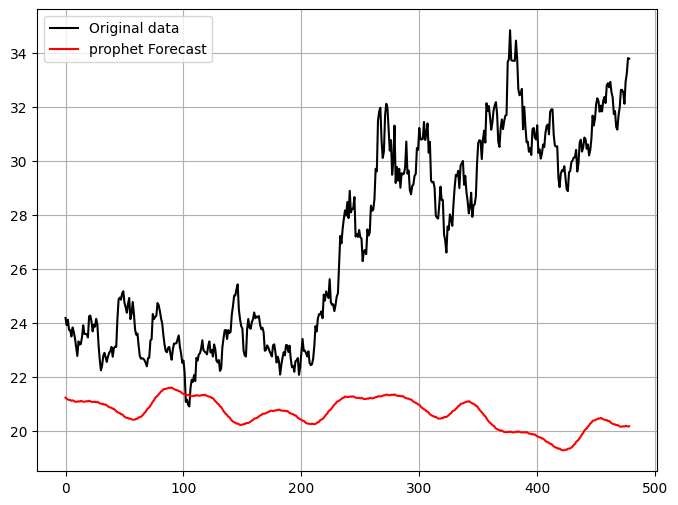

RMSE -------- 7.431600668825285


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [68]:
result_prophet = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = prophet_learn_feat(n)
    result_prophet.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")

all_reault_feat['prophet_result'] = result_prophet

In [56]:
def rf_learn_feat(data_1):
    
    # деление датасета на 
    data = data_1.copy()
    data = upgrade_dataset(data)
    
    train_size = int(len(data) * 0.8)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    
    print(f"Train: {len(train)},  Test: {len(test)}")

    # Деление на фичи и таргет
    train_x = train.drop(columns = ["Цена"])
    train_y = train["Цена"]
    test_x = test.drop(columns = ["Цена"])
    test_y = test["Цена"]
    
    # Обучение модели
    rf_model = RandomForestRegressor(random_state=RANDOM_STATE)
    rf_model.fit(train_x, train_y)
    y_pred_rf = rf_model.predict(test_x)

    # Рассчёт RMSE
    rmse_rf = np.sqrt(mean_squared_error(test_y, y_pred_rf))

    # график предсказания
    plt.figure(figsize=(8, 6))
    plt.plot(test.index, y_pred_rf, label="Forecast", color="red")
    plt.plot(test.index, test_y, label="test")
    plt.legend()
    plt.grid()
    plt.show()

    return rmse_rf


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

Train: 2629,  Test: 658


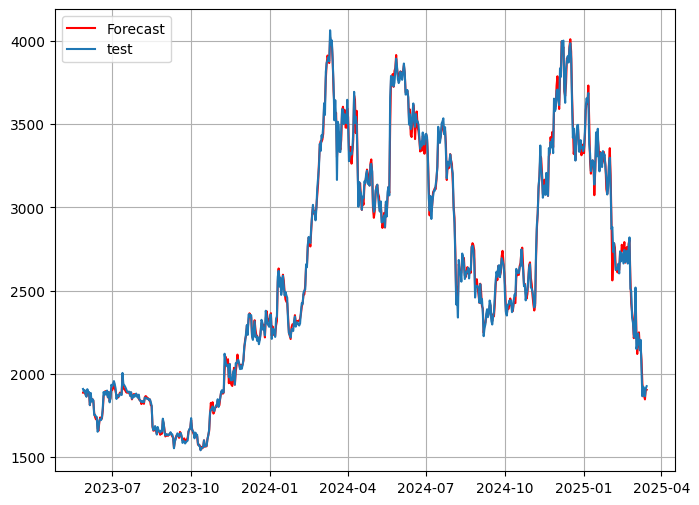

RMSE -------- 35.321374793098954


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

Train: 2684,  Test: 671


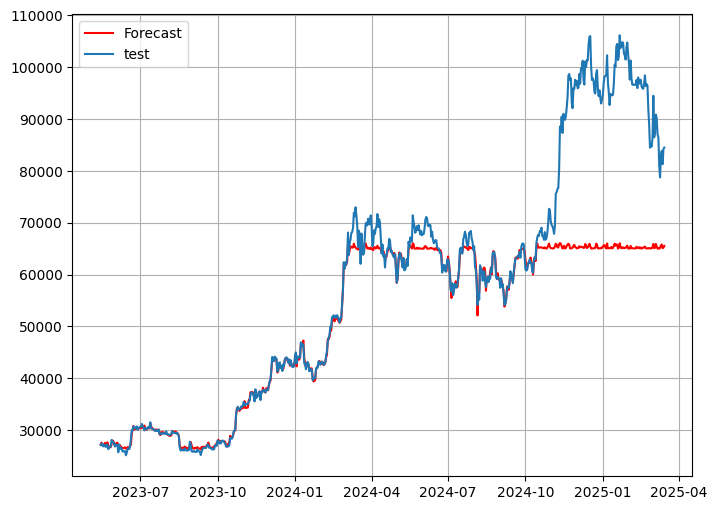

RMSE -------- 13517.019146958422


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

Train: 1936,  Test: 485


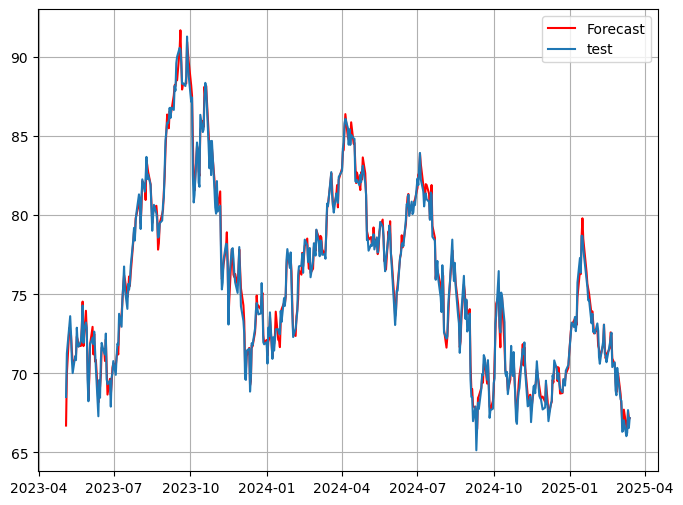

RMSE -------- 0.5406634900606191


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

Train: 1900,  Test: 476


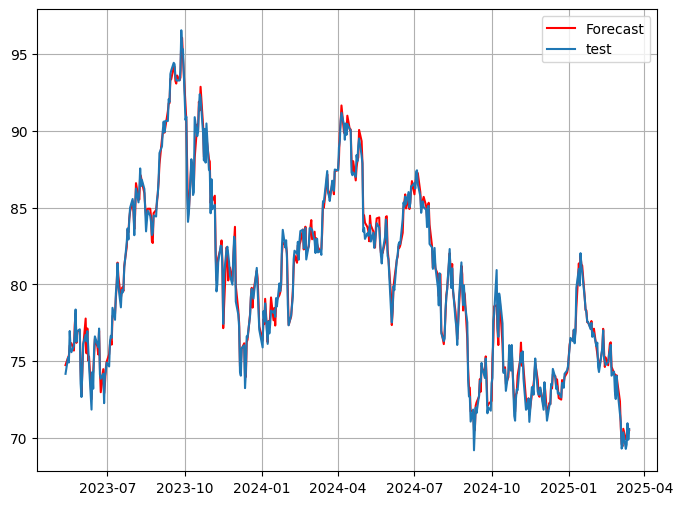

RMSE -------- 0.5277559928643217


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

Train: 1840,  Test: 460


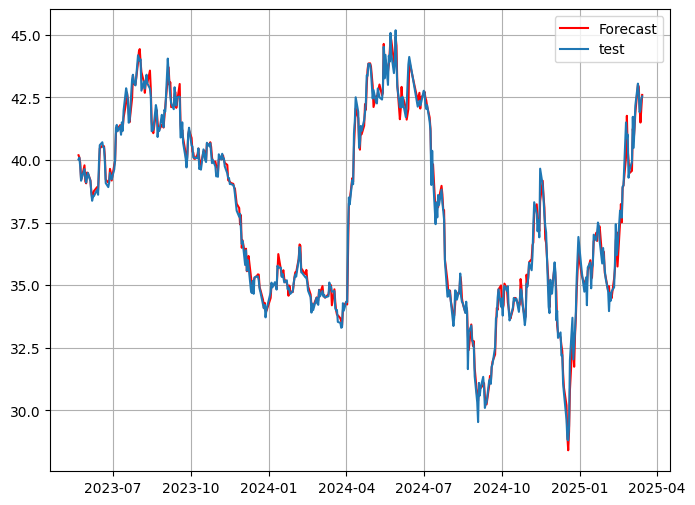

RMSE -------- 0.3458408079138132


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

Train: 1844,  Test: 462


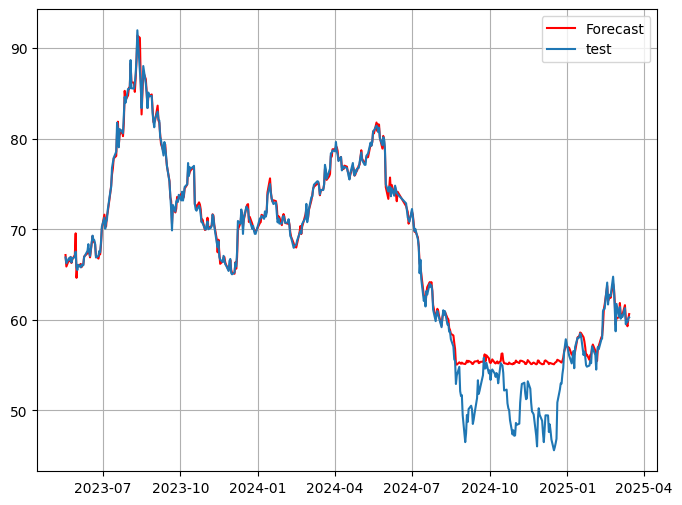

RMSE -------- 2.3409393999925054


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

Train: 1840,  Test: 460


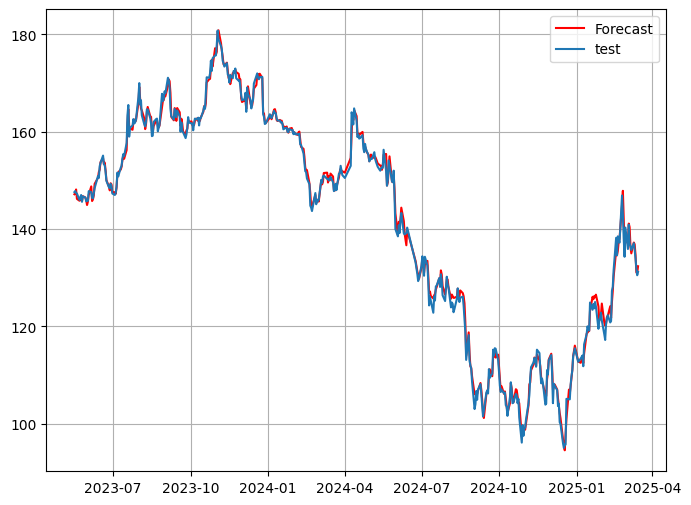

RMSE -------- 1.1996438973440298


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

Train: 1843,  Test: 461


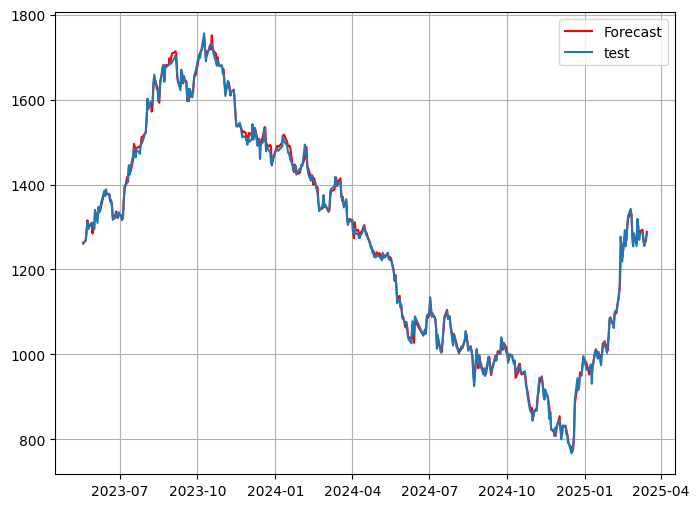

RMSE -------- 9.733111942132984


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

Train: 1854,  Test: 464


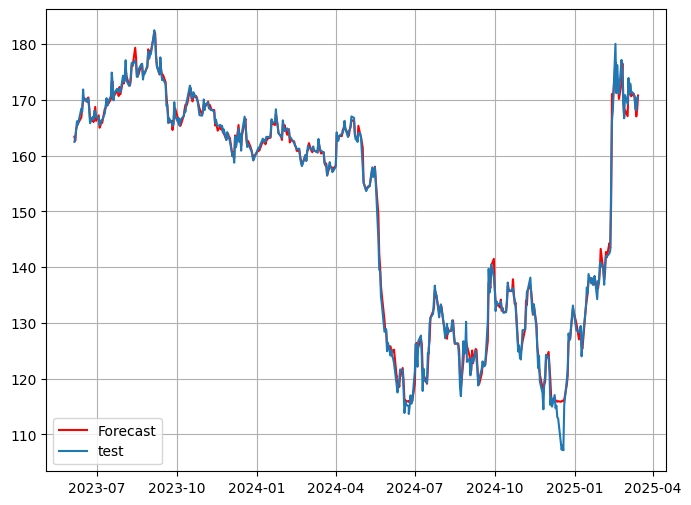

RMSE -------- 1.3787431220636905


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

Train: 1910,  Test: 478


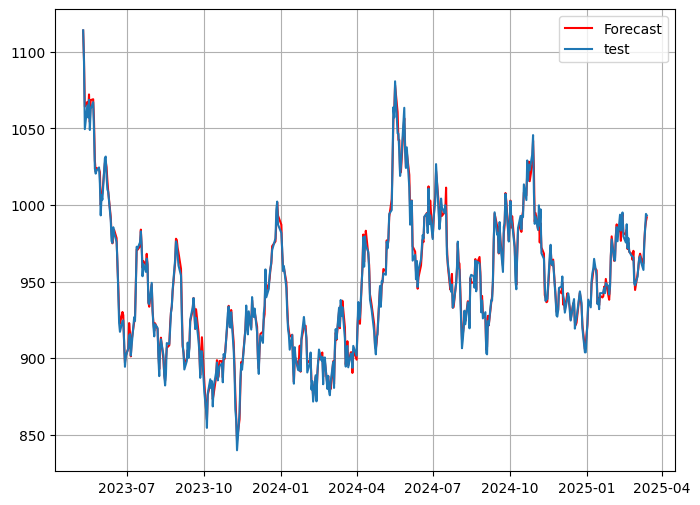

RMSE -------- 3.8957500363460786


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

Train: 1915,  Test: 479


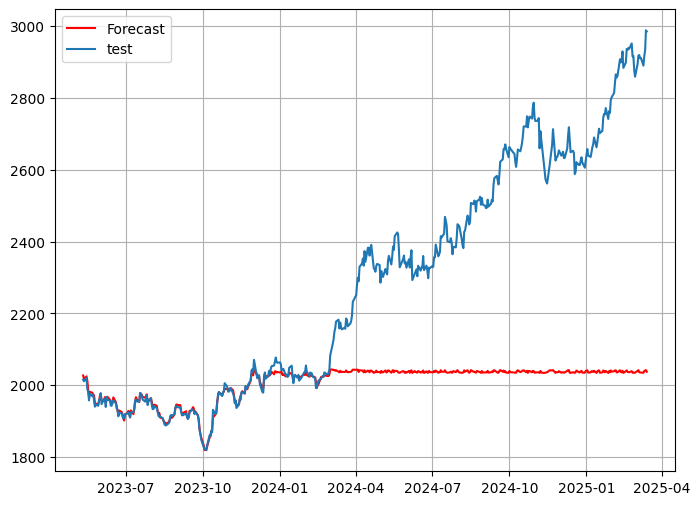

RMSE -------- 402.3239048754211


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

Train: 1916,  Test: 479


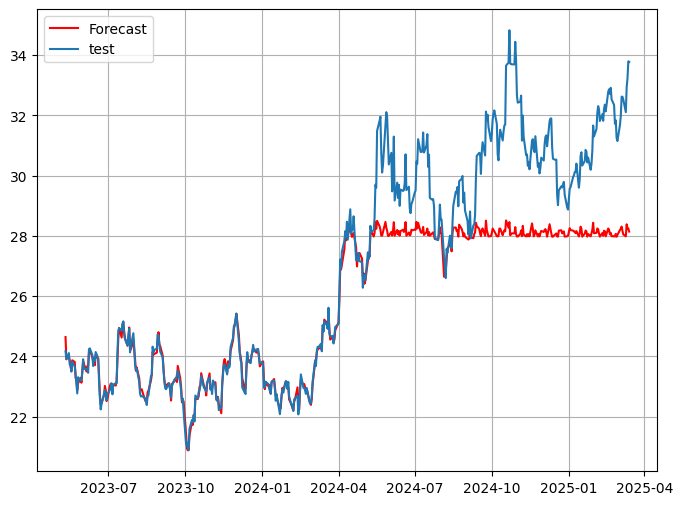

RMSE -------- 1.9572611120364625


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [57]:
result_rf = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = rf_learn_feat(n)
    result_rf.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")
    
all_reault_feat['result_rf'] = result_rf

In [60]:
def lgbm_learn_feat(data_1):
    
    # Добавление новых фичей
    data = data_1.copy()
    data = upgrade_dataset(data)
    
    # деление датасета на 
    train_size = int(len(data) * 0.8)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    
    print(f"Train: {len(train)}, Validation:, Test: {len(test)}")

    # Деление на таргет и фичи
    train_x = train.drop(columns = ["Цена"])
    train_y = train["Цена"]
    test_x = test.drop(columns = ["Цена"])
    test_y = test["Цена"]

    # Обучение модели
    lgb_model = lgb.LGBMRegressor()
    lgb_model.fit(train_x, train_y)

    # предсказание на тесте
    y_pred_rf = lgb_model.predict(test_x)
    rmse_rf = np.sqrt(mean_squared_error(test_y, y_pred_rf))

    # График предсказания
    plt.figure(figsize=(8, 6))
    plt.plot(test.index, y_pred_rf, label="Forecast", color="red")
    plt.plot(test.index, test_y, label="test")
    plt.legend()
    plt.grid()
    plt.show()

    return rmse_rf


<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_Ethereum</div>

Train: 2629, Validation:, Test: 658
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4364
[LightGBM] [Info] Number of data points in the train set: 2629, number of used features: 20
[LightGBM] [Info] Start training from score 923.035252


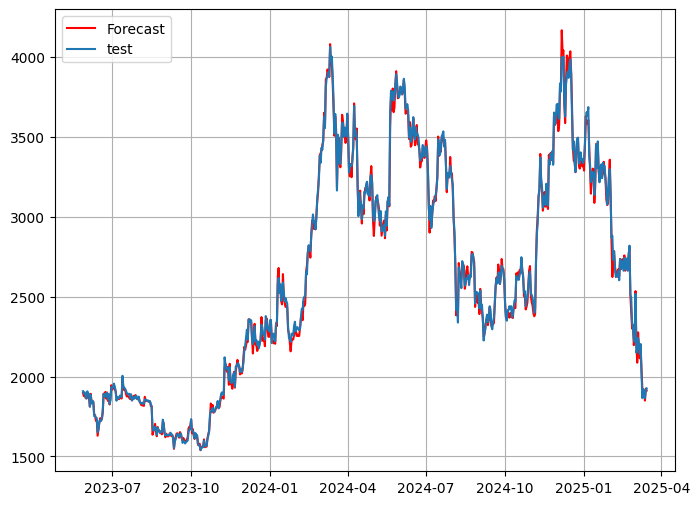

RMSE -------- 32.383031220541454


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_Ethereum</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: crypt_BTC</div>

Train: 2684, Validation:, Test: 671
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4364
[LightGBM] [Info] Number of data points in the train set: 2684, number of used features: 20
[LightGBM] [Info] Start training from score 15685.211628


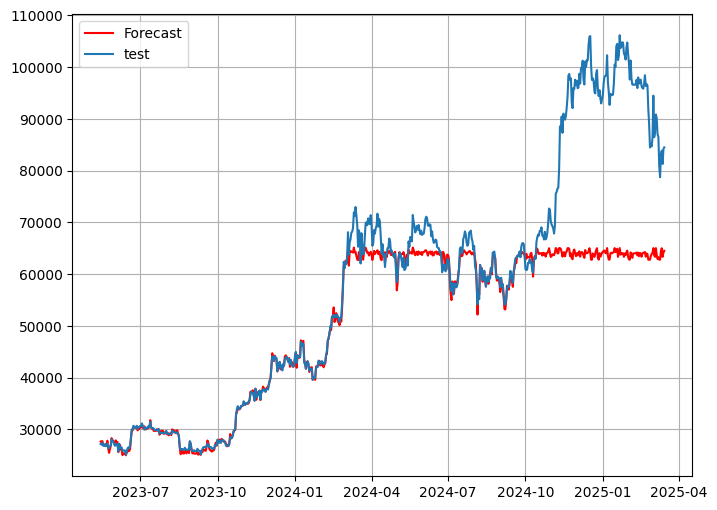

RMSE -------- 14136.306952198373


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: crypt_BTC</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_WTI_CLJ5</div>

Train: 1936, Validation:, Test: 485
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4363
[LightGBM] [Info] Number of data points in the train set: 1936, number of used features: 20
[LightGBM] [Info] Start training from score 60.460785


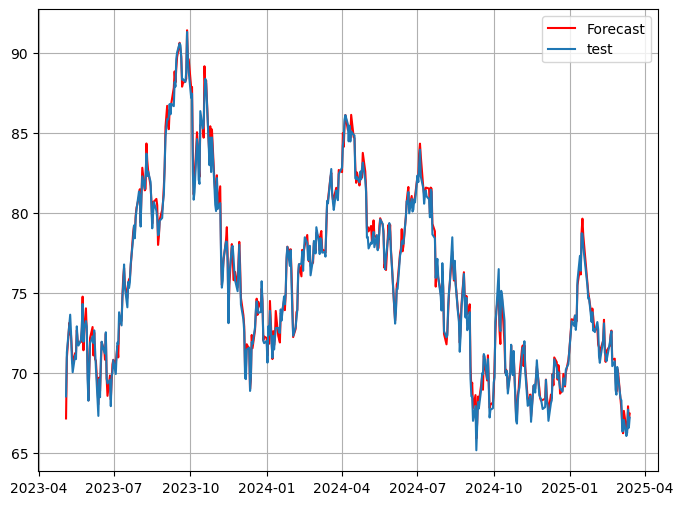

RMSE -------- 0.471419379875603


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_WTI_CLJ5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: futures_Brent_LCOK5</div>

Train: 1900, Validation:, Test: 476
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4362
[LightGBM] [Info] Number of data points in the train set: 1900, number of used features: 20
[LightGBM] [Info] Start training from score 64.977068


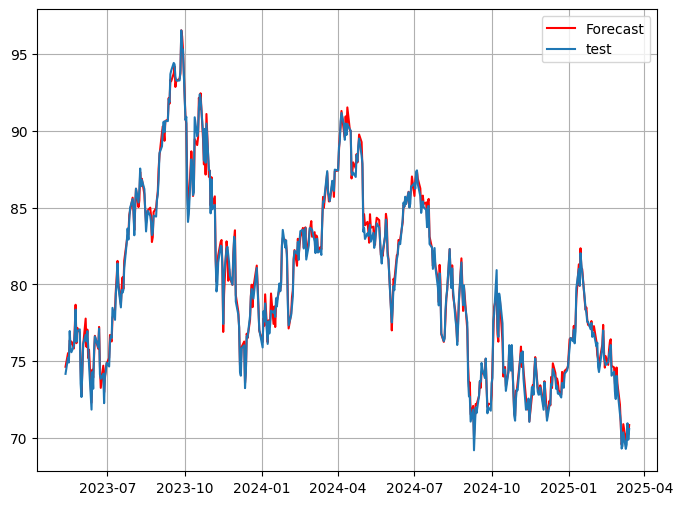

RMSE -------- 0.44611264895600744


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: futures_Brent_LCOK5</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_RUAL</div>

Train: 1840, Validation:, Test: 460
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4363
[LightGBM] [Info] Number of data points in the train set: 1840, number of used features: 20
[LightGBM] [Info] Start training from score 36.508130


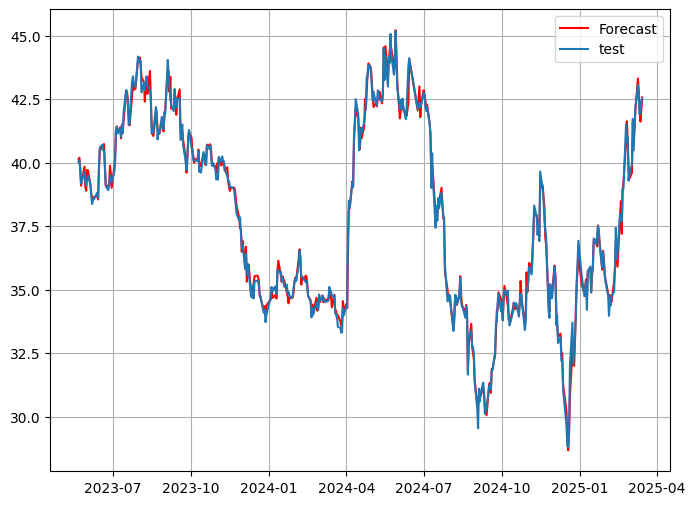

RMSE -------- 0.276217865187473


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_RUAL</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_ALRS</div>

Train: 1844, Validation:, Test: 462
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4364
[LightGBM] [Info] Number of data points in the train set: 1844, number of used features: 20
[LightGBM] [Info] Start training from score 86.713248


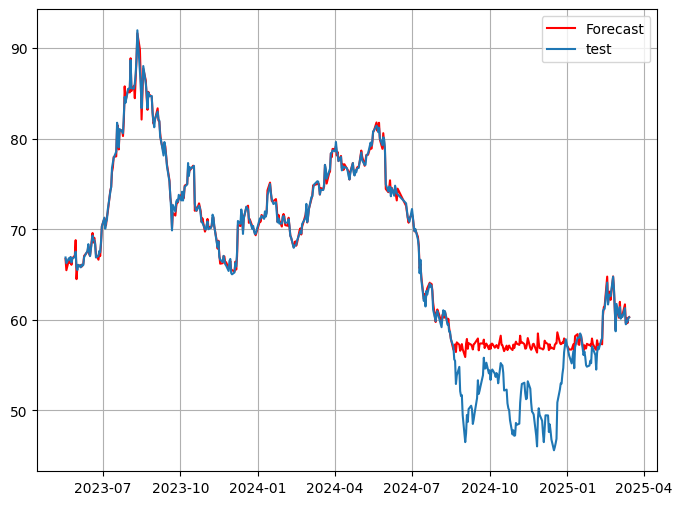

RMSE -------- 3.0737254286960805


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_ALRS</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_metal_GMKN</div>

Train: 1840, Validation:, Test: 460
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4358
[LightGBM] [Info] Number of data points in the train set: 1840, number of used features: 20
[LightGBM] [Info] Start training from score 153.164674


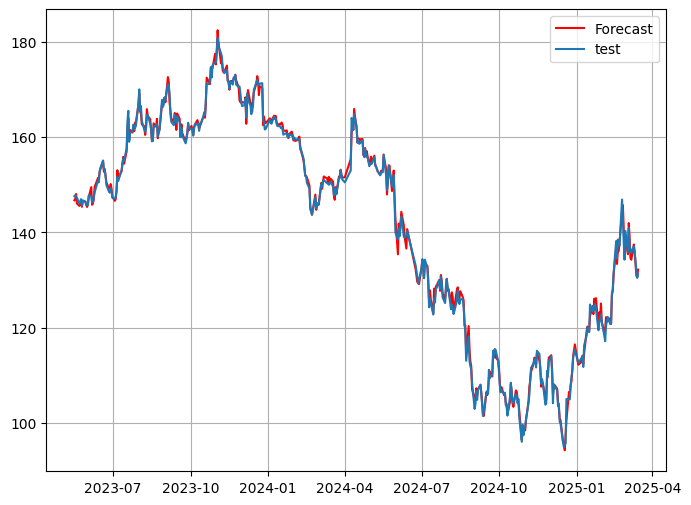

RMSE -------- 0.9965271958972842


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_metal_GMKN</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_NVTK</div>

Train: 1843, Validation:, Test: 461
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4363
[LightGBM] [Info] Number of data points in the train set: 1843, number of used features: 20
[LightGBM] [Info] Start training from score 1045.817906


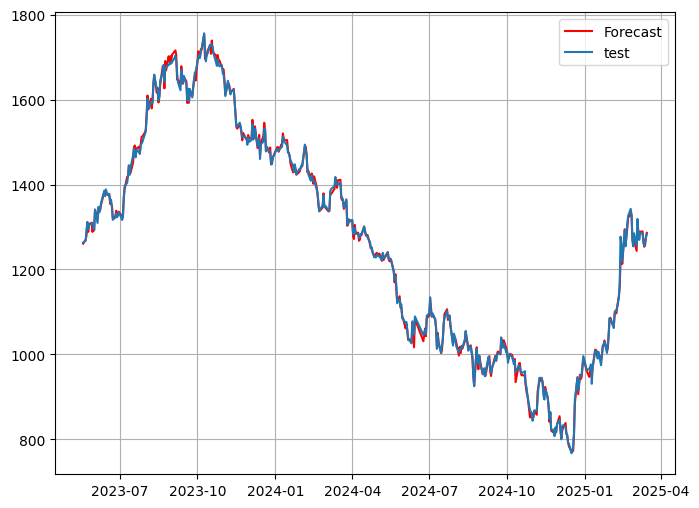

RMSE -------- 7.847840070254783


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_NVTK</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: share_oil_gaz_GAZ</div>

Train: 1854, Validation:, Test: 464
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4363
[LightGBM] [Info] Number of data points in the train set: 1854, number of used features: 20
[LightGBM] [Info] Start training from score 188.811548


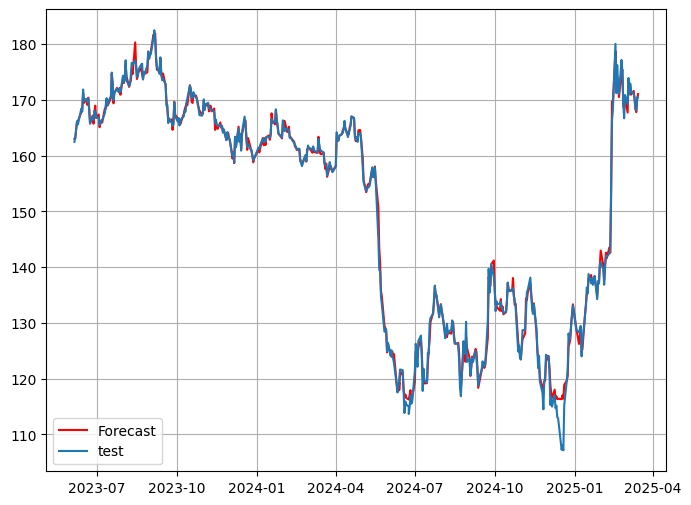

RMSE -------- 1.2883373985761295


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: share_oil_gaz_GAZ</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_XPT</div>

Train: 1910, Validation:, Test: 478
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4362
[LightGBM] [Info] Number of data points in the train set: 1910, number of used features: 20
[LightGBM] [Info] Start training from score 946.500423


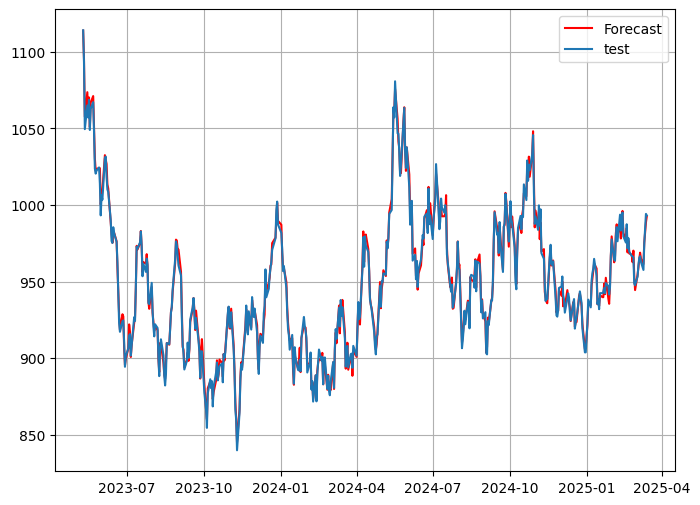

RMSE -------- 3.395783131236221


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_XPT</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AU</div>

Train: 1915, Validation:, Test: 479
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4362
[LightGBM] [Info] Number of data points in the train set: 1915, number of used features: 20
[LightGBM] [Info] Start training from score 1526.491586


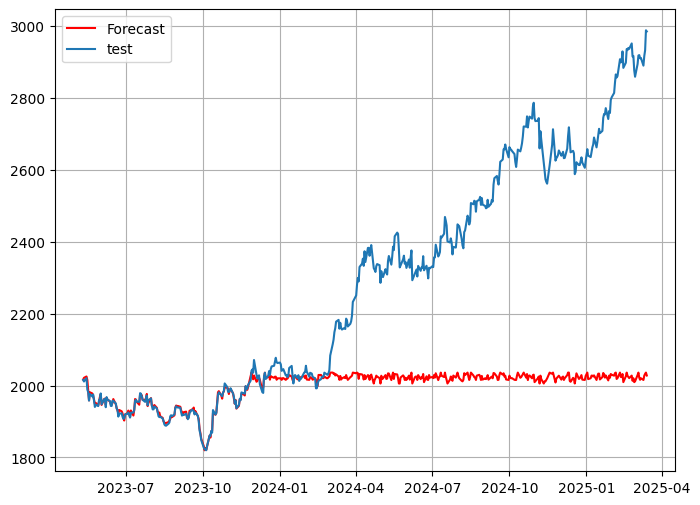

RMSE -------- 412.0107109585138


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AU</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

Train: 1916, Validation:, Test: 479
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4362
[LightGBM] [Info] Number of data points in the train set: 1916, number of used features: 20
[LightGBM] [Info] Start training from score 19.285028


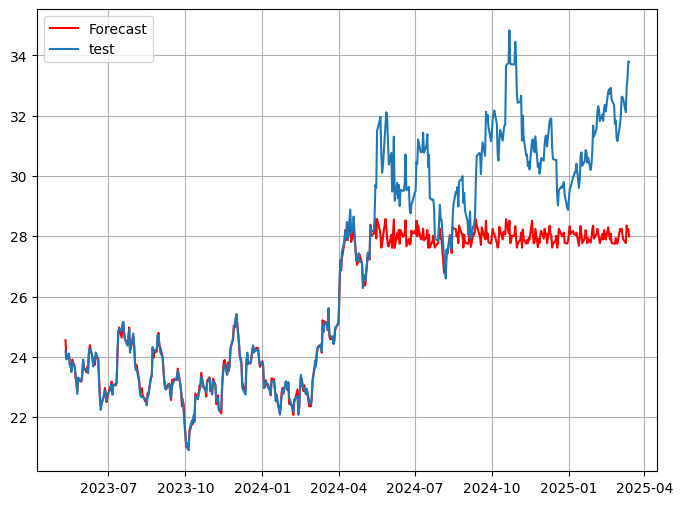

RMSE -------- 2.0263913794039925


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [61]:
result_lgbm = []
for i, n in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    metr = lgbm_learn_feat(n)
    result_lgbm.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")
all_reault_feat['result_lgbm'] = result_lgbm

In [62]:
def lstm_learn_feat(data_1, window_size=10, epochs=10):
    
    data = data_1.copy()
    data = upgrade_dataset(data)
    
    # нормализация
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(data[["Цена"]])

    # подготовка входов и выходов
    X, y = prepare_lstm_data(scaled.flatten(), window_size)

    # деление на train/test
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # LSTM ожидает входы в формате (samples, timesteps, features)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    # модель через Input, чтобы убрать warning
    model = Sequential([
        Input(shape=(window_size, 1)),
        LSTM(64, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mse')

    # обучение
    model.fit(X_train, y_train, epochs=epochs, verbose=0)

    # предсказание
    y_pred = model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    rmse_lstm = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))


    index_offset = window_size + split
    test_index = data.index[index_offset: index_offset + len(y_test)]
    # график
    plt.figure(figsize=(10, 5))
    plt.plot(test_index, y_test_inv, label="Test")
    plt.plot(test_index, y_pred_inv, label="Forecast", color="red")
    plt.legend()
    plt.title("LSTM Forecast")
    plt.grid()
    plt.show()

    return rmse_lstm

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

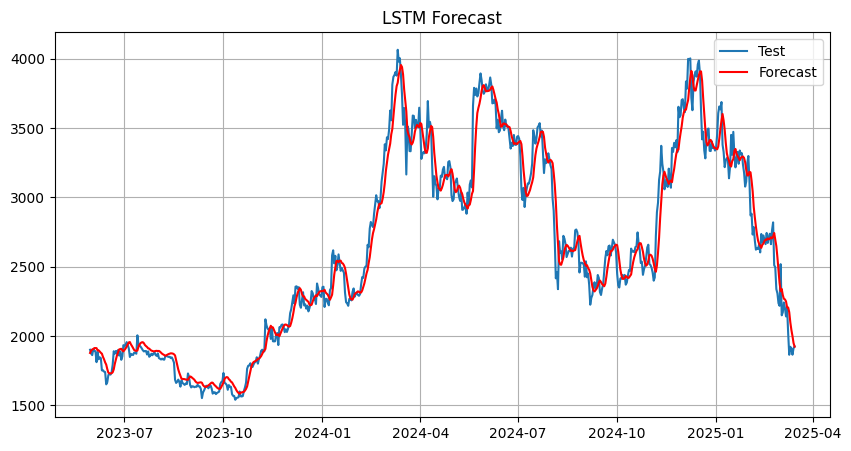

RMSE -------- 126.6738624945356


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

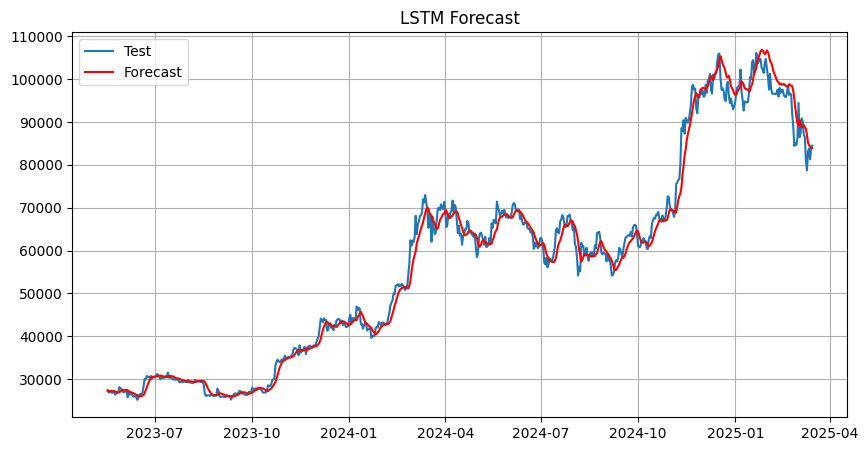

RMSE -------- 2612.6870197377048


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

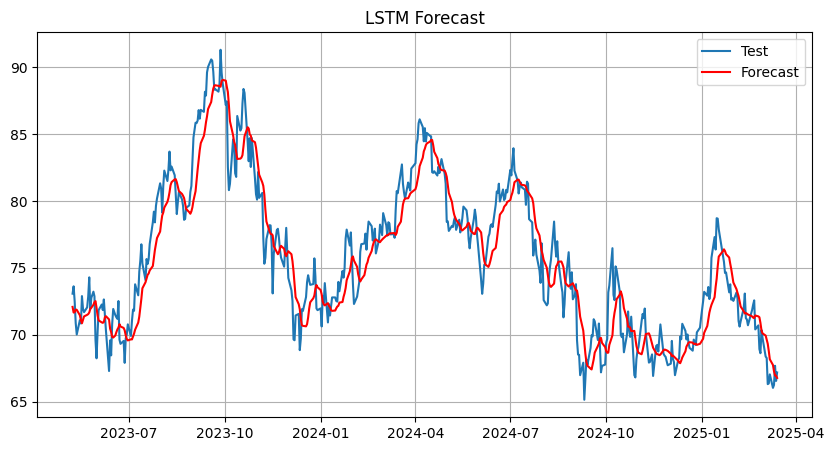

RMSE -------- 2.065343669600288


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

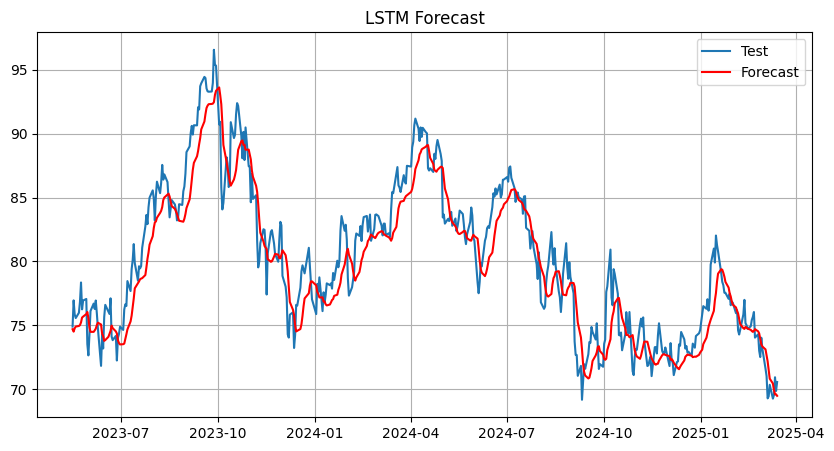

RMSE -------- 2.18980740525468


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

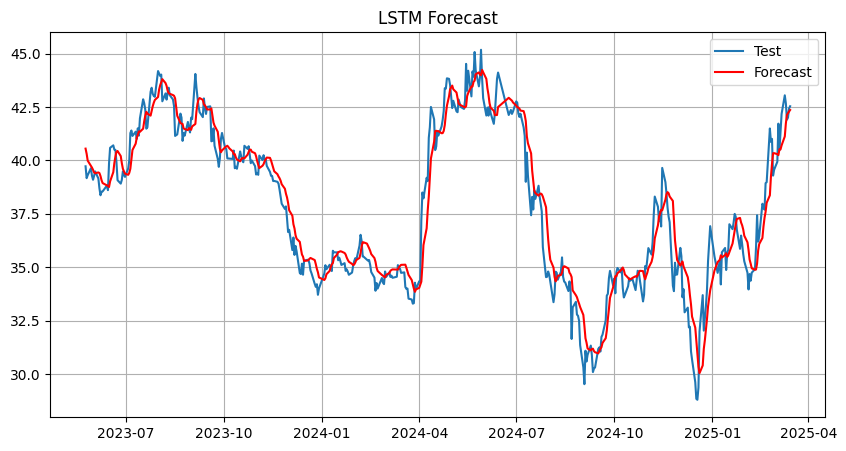

RMSE -------- 1.0281994785772972


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

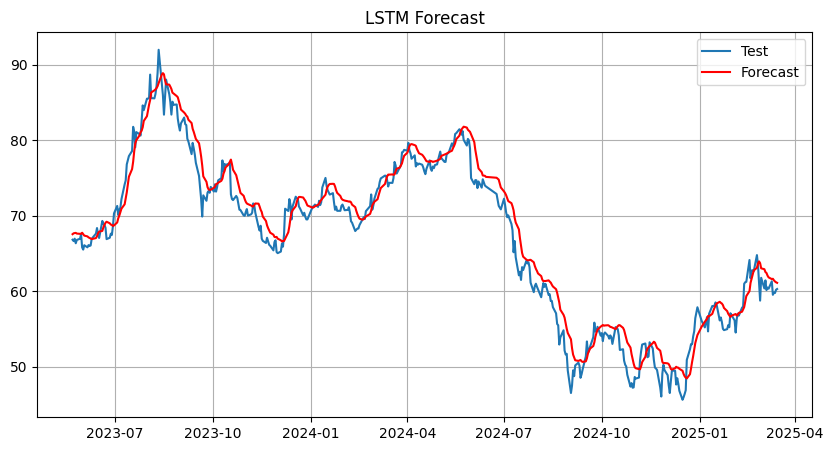

RMSE -------- 2.194956157343327


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

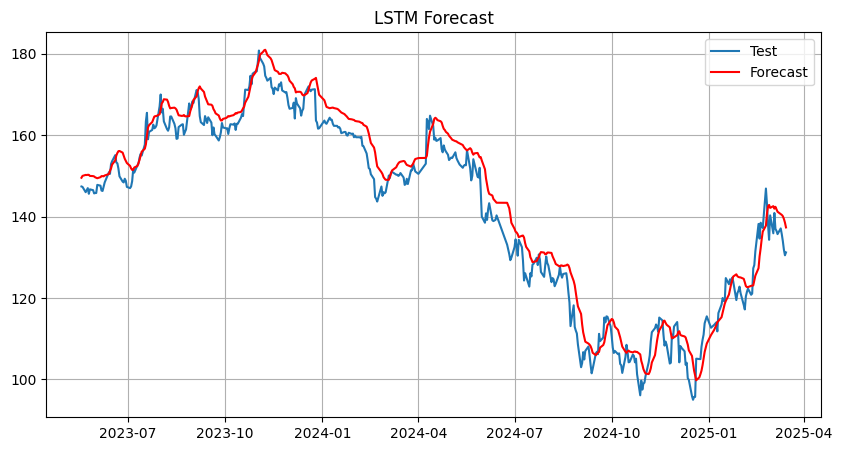

RMSE -------- 4.887770914232019


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

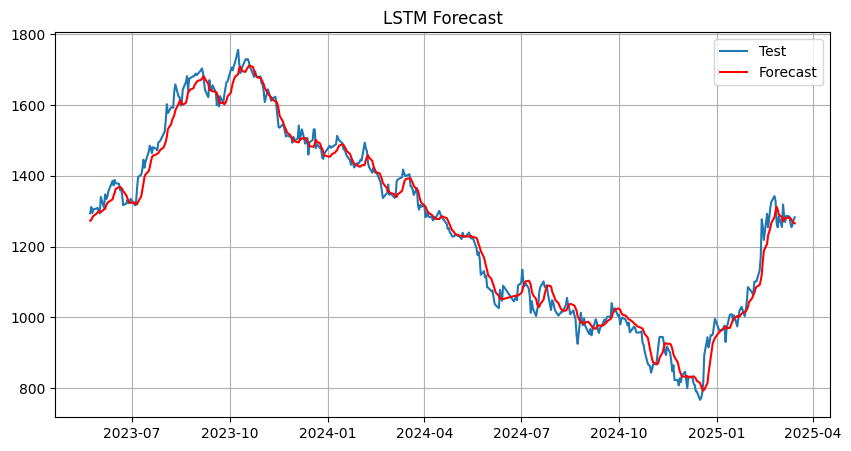

RMSE -------- 31.913286699210616


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

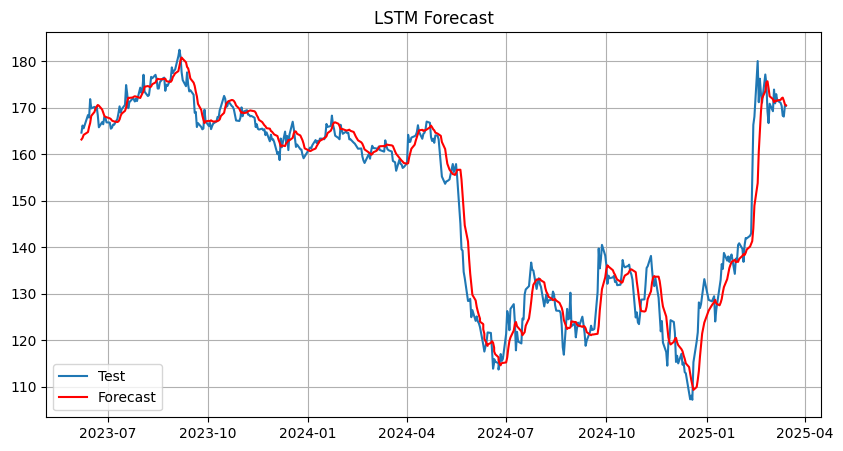

RMSE -------- 4.301641097717753


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

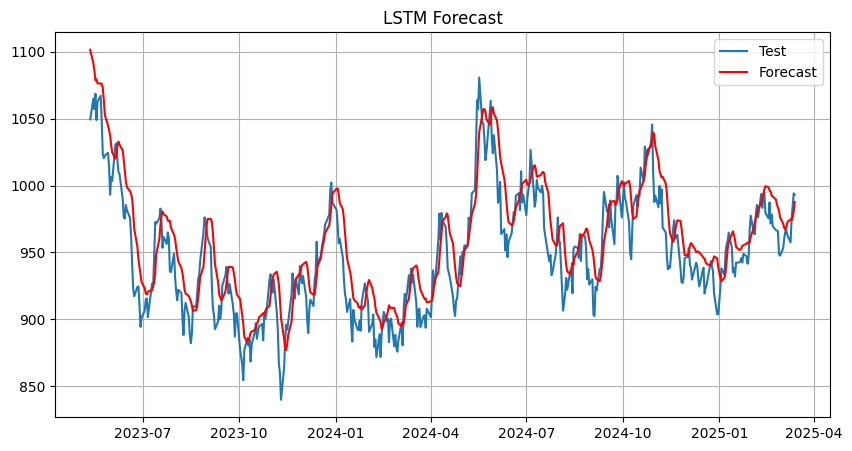

RMSE -------- 23.37223580300032


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

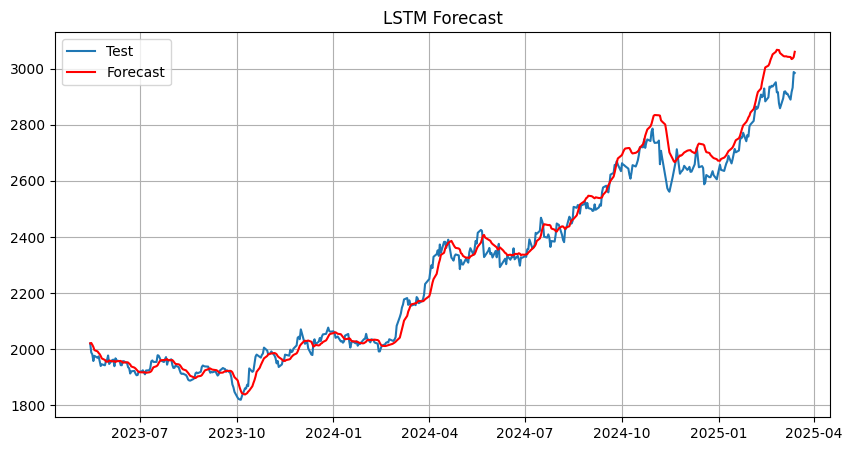

RMSE -------- 49.08009635738401


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

<div style='background-color:#1f77b4;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>🚀 Начало обучения для датасета: spot_preciouse_metal_AG</div>

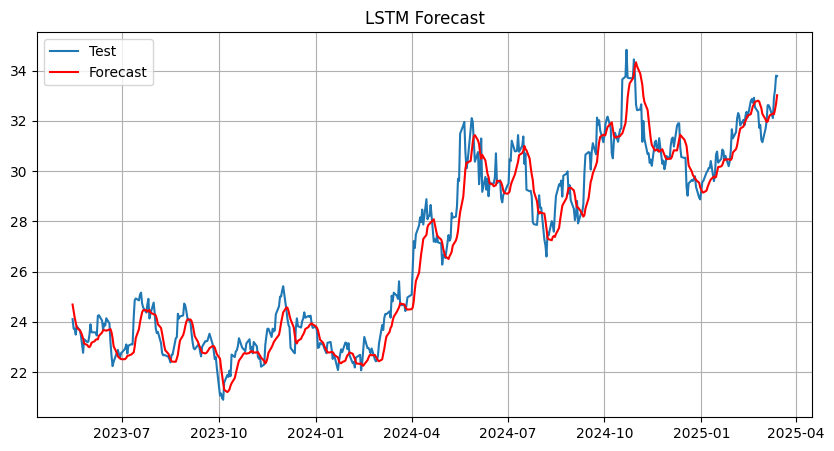

RMSE -------- 0.8071234251622479


<div style='background-color:#2ca02c;                       padding:10px; border-radius:6px; color:white; font-weight:bold;                       font-size:16px; margin-top:20px;'>✅ Конец обучения для датасета: spot_preciouse_metal_AG</div>

In [63]:
result_lstm = []
for name, df in all_data.items():
    title_block(f"🚀 Начало обучения для датасета: {i}", color="blue")
    try:
        metr = lstm_learn_feat(df)
    except Exception as e:
        print(f"⚠️ Ошибка: {e}")
        metr = np.nan
    result_lstm.append(metr)
    print(f'RMSE -------- {metr}')
    title_block(f"✅ Конец обучения для датасета: {i}", color="green")
    
all_reault_feat['result_lstm'] = result_lstm

In [66]:
all_reault

,dataset_name,dataset_mean_price,arima_result,prophet_result,result_rf,result_lgbm,result_lstm
0,crypt_Ethereum,1264.224518,844.039192,3469.099087,46.231417,46.392178,120.454391
1,crypt_BTC,24007.290015,34895.018047,73901.155423,13084.720551,14490.792732,2510.871674
2,futures_WTI_CLJ5,63.524965,7.577570,10.135417,0.672852,0.673460,1.993226
3,futures_Brent_LCOK5,68.036667,7.516409,11.400879,0.664862,0.664689,1.976095
4,share_metal_RUAL,36.765748,6.428924,26.703817,0.395122,0.381239,1.127288
5,share_metal_ALRS,82.728964,11.658282,61.758701,1.923495,2.830270,2.007312
6,share_metal_GMKN,150.887652,29.334151,67.525758,1.310385,1.418320,3.913810
7,share_oil_gaz_NVTK,1090.358767,320.351014,697.377234,11.308981,11.529886,32.263260
8,share_oil_gaz_GAZ,181.021035,27.355865,116.478648,1.469220,1.610464,4.543210
9,spot_preciouse_metal_XPT,946.928643,188.451954,46.262625,6.541620,6.178420,20.043736


In [69]:
all_reault_feat

,dataset_name,dataset_mean_price,arima_result,prophet_result,result_rf,result_lgbm,result_lstm
0,crypt_Ethereum,1264.224518,813.743740,3469.099087,35.321375,32.383031,126.673862
1,crypt_BTC,24007.290015,34418.202856,73901.155423,13517.019147,14136.306952,2612.687020
2,futures_WTI_CLJ5,63.524965,7.749442,10.135417,0.540663,0.471419,2.065344
3,futures_Brent_LCOK5,68.036667,7.246497,11.400879,0.527756,0.446113,2.189807
4,share_metal_RUAL,36.765748,6.247924,26.703817,0.345841,0.276218,1.028199
5,share_metal_ALRS,82.728964,9.838755,61.758701,2.340939,3.073725,2.194956
6,share_metal_GMKN,150.887652,32.112721,67.525758,1.199644,0.996527,4.887771
7,share_oil_gaz_NVTK,1090.358767,329.497066,697.377234,9.733112,7.847840,31.913287
8,share_oil_gaz_GAZ,181.021035,30.284279,116.478648,1.378743,1.288337,4.301641
9,spot_preciouse_metal_XPT,946.928643,186.012799,46.262625,3.895750,3.395783,23.372236


/tmp/ipykernel_2081/3748432685.py:12: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 1600x600 with 0 Axes>

/home/danila/mainpk/masters_work/Project_Financial_assets_and_ML/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


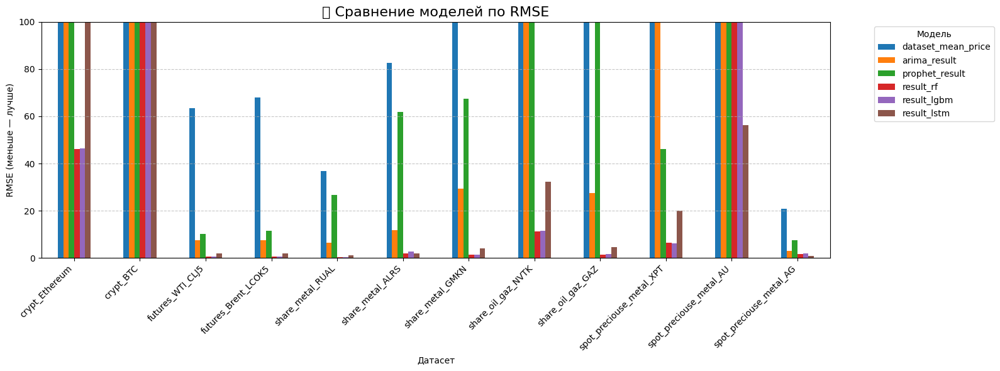

In [71]:
# Построение графика
plt.figure(figsize=(16, 6))
ax = all_reault.set_index("dataset_name").plot(kind="bar", figsize=(16, 6))

plt.title("📊 Сравнение моделей по RMSE", fontsize=16)
plt.ylabel("RMSE (меньше — лучше)")
plt.xlabel("Датасет")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.ylim(0, 100)  # Ограничение по высоте столбцов, можно подстроить под свои данные
plt.legend(title="Модель", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

🏁 Финальный вывод:
Добавление фичей не помогает ARIMA и Prophet, и они теряют конкурентоспособность по сравнению с фичевыми моделями (RF, LGBM, LSTM).
ARIMA всё ещё может быть полезна как базовая модель на стационарных рядах.
Prophet можно использовать там, где важна интерпретация, сезонность, праздники — но не ради точности.
Добавление фичей в ML модели при обучении сильно не улучшело их качество, местами даже качество не много снизилось, что говорит о том, что фичи были либо подобраны не корректно, либо они не могут дать весомый вес для модели в определении цены.